# Load libraries

In [1]:
library(ggplot2) ##plotting package
library(cowplot) ##plots + arrange plots etc
#library(pheatmap) ##plot heatmaps
library(RColorBrewer) ## color palettes
#library(viridis) ##colors for heatmaps
library(dplyr) ## for the R pipes
library(tidyr) ## for tidying the dataframes
library(data.table) ## load files into R faster
#library(profmem) ## keep track of memory usage
#library(matrixStats)  ## get summary statistics on matrices
#library(WGCNA) ## faster cor()
library(scales) ## representing values with varying scales
library(VennDiagram)  ## plot venn diagram


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last


Loading required package: grid

Loading required package: futile.logger



# Import data 

## Counts

In [2]:
##tpms
gn_bdr_tpm_updated_df_trunc <- data.table::fread('/Users/rusi2317/projects/DBNascent_Analysis/data/final_counts/genes_5ptrunc_bidirectionals_tpm500bp_promoters.tsv.gz')
dim(gn_bdr_tpm_updated_df_trunc)
head(gn_bdr_tpm_updated_df_trunc, 3)

[1] 284441    893

chromosome,start,end,GeneID,Length,SRZ1950491,SRZ1950493,SRZ1950495,SRZ1950497,SRZ1950499,⋯,SRR11793829,SRR11793830,stdev,variance,mean,median,coefvar,max,bidir,bidir_id
<chr>,<int>,<int>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
chr1,77562416,77681908,ZZZ3,119493,5.829455,8.3145779,5.9802570,6.2823684,6.3409987,⋯,0.5279793,4.530625,4.004108,16.032880,6.242682,5.644451,0.6414082,36.13679,,Gene
chr17,4004445,4142280,ZZEF1,137836,2.965708,3.6729336,3.4432781,3.3094377,3.7108574,⋯,0.4787957,2.945369,2.723936,7.419826,4.139845,3.601543,0.6579801,18.42629,,Gene
chr7,143382095,143391111,ZYX,9017,1.324866,0.9145094,0.3628197,0.4957133,0.8411699,⋯,1.3579248,6.731350,19.013528,361.514236,14.768354,8.292290,1.2874507,185.82795,,Gene


## Metadata

In [3]:
##fxn to convert the first letter to uppercase
first_letter_uppper <- function(x) {
  substr(x, 1, 1) <- toupper(substr(x, 1, 1))
  return(x)
}

##metadata
metadata_celltype <- data.table::fread('/Users/rusi2317/projects/DBNascent-build/230131_db_output.tsv')
metadata_celltype$Tissue <- first_letter_uppper(metadata_celltype$tissue)
dim(metadata_celltype)
head(metadata_celltype)

[1] 2880   15

organism,tissue,tissue_description,disease,srp,paper_id,protocol,sample_name,sample_type,cell_type,samp_qc_score,samp_data_score,replicate,control_experimental,Tissue
<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
A. thaliana,seed,seed,0,SRP076266,Hetzel2016nascent,GRO-cap,SRR3647033,tissue,seed,3,1,1,control,Seed
A. thaliana,seed,seed,0,SRP076266,Hetzel2016nascent,GRO-seq,SRR3647034,tissue,seed,4,1,1,control,Seed
A. thaliana,seed,seed,0,SRP076266,Hetzel2016nascent,GRO-seq,SRR3647035,tissue,seed,3,1,2,control,Seed
A. thaliana,seedling,seedling,0,SRP101403,Liu2018arabidopsis,GRO-seq,SRR5313794,tissue,seedling,5,1,1,experimental,Seedling
A. thaliana,seedling,seedling,0,SRP101403,Liu2018arabidopsis,GRO-seq,SRR5313795,tissue,seedling,4,1,2,experimental,Seedling
A. thaliana,seedling,seedling,0,SRP101403,Liu2018arabidopsis,GRO-seq,SRR5313796,tissue,seedling,4,1,1,control,Seedling


In [4]:
##get samples transcribed
sample_ids <- colnames(gn_bdr_tpm_updated_df_trunc[,6:885])
metadata_celltype_counted <- metadata_celltype[metadata_celltype$sample_name %in% sample_ids,]
dim(metadata_celltype_counted)
head(metadata_celltype_counted)

[1] 880  15

organism,tissue,tissue_description,disease,srp,paper_id,protocol,sample_name,sample_type,cell_type,samp_qc_score,samp_data_score,replicate,control_experimental,Tissue
<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266931,cell line,MV4-11,1,2,1,control,Blood
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266932,cell line,MV4-11,2,1,2,control,Blood
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266933,cell line,MV4-11,1,2,1,experimental,Blood
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266934,cell line,MV4-11,1,2,2,experimental,Blood
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266935,cell line,MV4-11,1,2,1,experimental,Blood
H. sapiens,blood,blood; biphenotypic B myelomonocytic leukemia,1,SRP149838,Aho2019displacement,PRO-seq,SRR7266936,cell line,MV4-11,1,2,2,experimental,Blood


## Significant pairs

### Separated by tissues

In [5]:
sig_pairs_path <- '/Users/rusi2317/projects/meta_analysis_qc/hg38/processed_data/correlations_nObs/Tissue_samples/significant_pairs'

##get paths for the counts tables
sig_pairs_path_files <- list.files(path=sig_pairs_path, 
                              pattern="*significant*", 
                                   full.names=TRUE)

##load correlations
sig_pairs_path_DT_list <- lapply(sig_pairs_path_files, 
                                   data.table::fread) 

##add tissue ids
sig_pairs_file_names <- as.character(lapply(strsplit(sig_pairs_path_files, '/'), `[`, 11))
sig_pairs_names_chr <- gsub("-", " ", as.character(lapply(strsplit(sig_pairs_file_names, '_'), `[`, 1)))
sig_pairs_names_chr

[1] "chr1"  "chr10" "chr11" "chr12" "chr13" "chr14" "chr15" "chr16" "chr17"
[10] "chr18" "chr19" "chr2"  "chr20" "chr21" "chr22" "chr3"  "chr4"  "chr5" 
[19] "chr6"  "chr7"  "chr8"  "chr9"  "chrX"  "chrY"

In [6]:
##combine to one data.table
sig_pairs_path_DT <- do.call(rbind, sig_pairs_path_DT_list)
dim(sig_pairs_path_DT)
head(sig_pairs_path_DT, 3)

[1] 3478376      17

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
ZSWIM5,"chr1-45797029-45797375-tfit,dreg","ZSWIM5:chr1-45797029-45797375-tfit,dreg",0.6736485,1.907654e-03,8.517234e-05,4.647775,28,45016399,45205855,Gene,45797029,45797375,Tfit & dREG,780630,blood,12.17391
ZSWIM5,chr1-45207903-45208533-tfit,ZSWIM5:chr1-45207903-45208533-tfit,0.8061069,3.125044e-25,1.177055e-28,14.797242,120,45016399,45205855,Gene,45207903,45208533,Tfit,191504,blood,52.17391
ZSWIM5,chr1-45212302-45213100-tfit,ZSWIM5:chr1-45212302-45213100-tfit,0.7553321,4.820697e-19,4.219646e-22,12.143149,113,45016399,45205855,Gene,45212302,45213100,Tfit,195903,blood,49.13043


In [7]:
sig_pairs_path_DT_0.8 <- subset(sig_pairs_path_DT, abs(pcc) > 0.8 & 
                                adj_p_BH < 0.001 &
                               percent_transcribed_both > 75)
dim(sig_pairs_path_DT_0.8)

[1] 487978     17

### All samples

In [8]:
sig_pairs_path_all <- '/Users/rusi2317/projects/meta_analysis_qc/hg38/processed_data/correlations_nObs/All_samples/significant_pairs'

##get paths for the counts tables
sig_pairs_path_all_files <- list.files(path=sig_pairs_path_all, 
                              pattern="*significant*", 
                                   full.names=TRUE)

##load correlations
sig_pairs_path_all_DT_list <- lapply(sig_pairs_path_all_files, 
                                   data.table::fread) 

##add tissue ids
sig_pairs_file_all_names <- as.character(lapply(strsplit(sig_pairs_path_all_files, '/'), `[`, 11))
sig_pairs_all_names_chr <- gsub("-", " ", as.character(lapply(strsplit(sig_pairs_file_all_names, '_'), `[`, 1)))
sig_pairs_all_names_chr

[1] "chr1"  "chr10" "chr11" "chr12" "chr13" "chr14" "chr15" "chr16" "chr17"
[10] "chr18" "chr19" "chr2"  "chr20" "chr21" "chr22" "chr3"  "chr4"  "chr5" 
[19] "chr6"  "chr7"  "chr8"  "chr9"  "chrX"  "chrY"

In [9]:
##combine to one data.table
sig_pairs_all_path_DT <- do.call(rbind, sig_pairs_path_all_DT_list)
dim(sig_pairs_all_path_DT)
head(sig_pairs_all_path_DT, 3)

[1] 151527     17

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
ZZZ3,"chr1-78549583-78550187-tfit,dreg","ZZZ3:chr1-78549583-78550187-tfit,dreg",0.6506210,4.909393e-10,2.100425e-11,7.758235,84,77562416,77681908,Gene,78549583,78550187,Tfit & dREG,987167,All_samples,9.545455
ZZZ3,chr1-77560995-77561253-tfit,ZZZ3:chr1-77560995-77561253-tfit,0.7411239,2.130913e-143,8.121471e-147,31.917814,838,77562416,77681908,Gene,77560995,77561253,Tfit,-1421,All_samples,95.227273
ZZZ3,chr1-78435277-78435871-tfit,ZZZ3:chr1-78435277-78435871-tfit,0.7694158,5.415959e-09,2.632923e-10,8.080489,47,77562416,77681908,Gene,78435277,78435871,Tfit,872861,All_samples,5.340909


In [10]:
sig_pairs_all_path_DT_0.8 <- subset(sig_pairs_all_path_DT,
                                    abs(pcc) > 0.8 & 
                                    adj_p_BH < 0.001 &
                                    percent_transcribed_both > 5)
dim(sig_pairs_all_path_DT_0.8)

[1] 13669    17

### Merged

``` 
Blood	230
Breast	218
Kidney	115
Prostate	55
Intestine	52
Uterus	48
Skin	44
Embryo	31
Umbilical cord	20
Lung	17
```

In [11]:
sig_pairs_merged <- rbind(sig_pairs_path_DT, sig_pairs_all_path_DT)
sig_pairs_merged$tissue <- factor(sig_pairs_merged$tissue,
                                  levels=c('All_samples','blood','breast','kidney',
                                          'prostate','intestine','uterus',
                                          'skin','embryo','umbilical cord','lung'))
dim(sig_pairs_merged)
head(sig_pairs_merged)

[1] 3629903      17

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<fct>,<dbl>
ZSWIM5,"chr1-45797029-45797375-tfit,dreg","ZSWIM5:chr1-45797029-45797375-tfit,dreg",0.6736485,1.907654e-03,8.517234e-05,4.647775,28,45016399,45205855,Gene,45797029,45797375,Tfit & dREG,780630,blood,12.17391
ZSWIM5,chr1-45207903-45208533-tfit,ZSWIM5:chr1-45207903-45208533-tfit,0.8061069,3.125044e-25,1.177055e-28,14.797242,120,45016399,45205855,Gene,45207903,45208533,Tfit,191504,blood,52.17391
ZSWIM5,chr1-45212302-45213100-tfit,ZSWIM5:chr1-45212302-45213100-tfit,0.7553321,4.820697e-19,4.219646e-22,12.143149,113,45016399,45205855,Gene,45212302,45213100,Tfit,195903,blood,49.13043
ZSWIM5,chr1-45237885-45239727-tfit,ZSWIM5:chr1-45237885-45239727-tfit,0.6177204,4.691308e-10,2.230307e-12,7.972018,105,45016399,45205855,Gene,45237885,45239727,Tfit,221486,blood,45.65217
ZSWIM5,chr1-45321722-45322611-dreg,ZSWIM5:chr1-45321722-45322611-dreg,0.6088238,4.040509e-17,4.797999e-20,10.353492,184,45016399,45205855,Gene,45321722,45322611,dREG,305323,blood,80.00000
ZSCAN20,chr1-33498239-33500469-tfit,ZSCAN20:chr1-33498239-33500469-tfit,0.7219180,5.530860e-34,7.691070e-38,15.648996,227,33473395,33496507,Gene,33498239,33500469,Tfit,24844,blood,98.69565


Warning message:
“Removed 2799 rows containing non-finite values (stat_ydensity).”
Warning message:
“Removed 2799 rows containing non-finite values (stat_boxplot).”


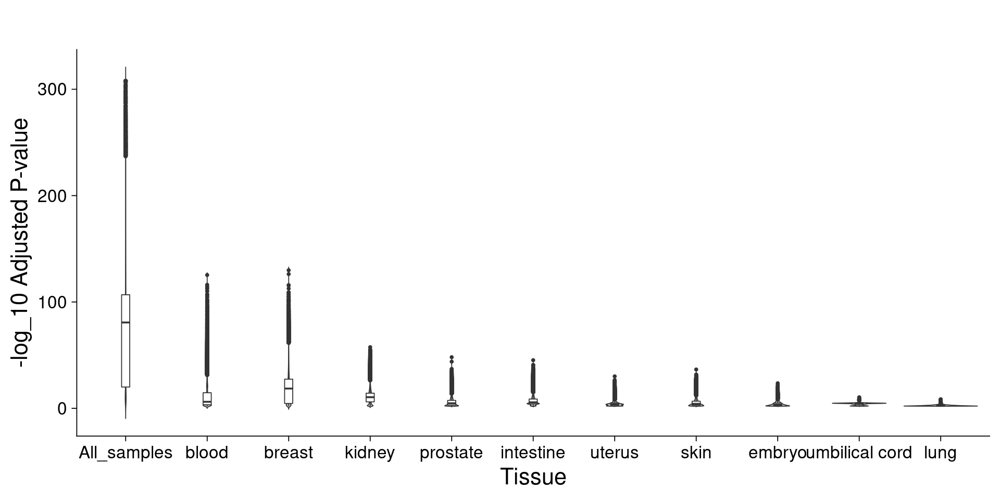

In [12]:
options(repr.plot.width=16, repr.plot.height=8)

p_vals <- ggplot(sig_pairs_merged, 
       aes(x=tissue, 
           y=-log(adj_p_BH, base=10)
          )) +
  geom_violin(trim=FALSE, fill="gray")+
geom_boxplot(width=0.1)+
theme_cowplot(24) +
  labs(title = " ", 
       y = "-log_10 Adjusted P-value",
       x = "Tissue") +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 30), 
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

p_vals

Warning message:
“Removed 2799 rows containing non-finite values (stat_ydensity).”
Warning message:
“Removed 2799 rows containing non-finite values (stat_boxplot).”


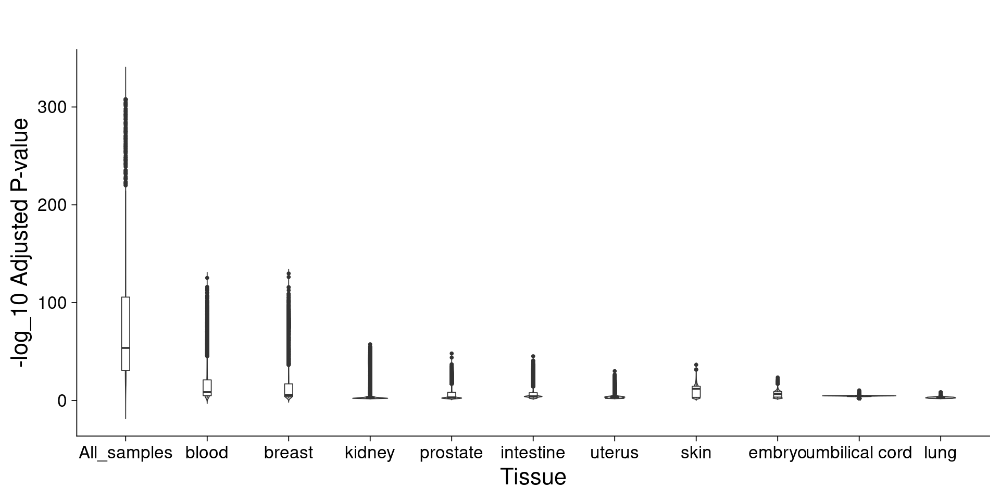

In [13]:
options(repr.plot.width=16, repr.plot.height=8)

p_vals_sig <- ggplot(subset(sig_pairs_merged, adj_p_BH < 0.01 & abs(pcc)>0.9), 
       aes(x=tissue, 
           y=-log(adj_p_BH, base=10)
          )) +
  geom_violin(trim=FALSE, fill="gray")+
geom_boxplot(width=0.1)+
theme_cowplot(24) +
  labs(title = " ", 
       y = "-log_10 Adjusted P-value",
       x = "Tissue") +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 30), 
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

p_vals_sig

# Functions
## Pair wise TPMs plot

In [132]:
plot_transcript_pairs_txptID <- function(normalized_counts, datatable_pairs, 
                                  nsample, gene_id, bidir_id,
                                 metadata_df, cols) {
    
    nsamples <- nsample
    
    normalized_counts_df <- as.data.frame(normalized_counts)
    
    gene_filtered <- subset(normalized_counts_df, GeneID == as.character(gene_id))
    bidir_filtered <- normalized_counts_df[normalized_counts_df$GeneID %in% bidir_id,]
    print(gene_filtered$GeneID)
    print(bidir_filtered$GeneID)
    
    filtered_pair <- rbind(gene_filtered, bidir_filtered)
    rownames(filtered_pair) <- filtered_pair$GeneID
    
    corr_summary <- subset(datatable_pairs, 
                           transcript_1 == gene_id &
                          transcript_2 == bidir_id)
                           
    print(head(corr_summary))
    
    transcript_1id <- corr_summary$transcript_2  #datatable_pairs[row_number,]$transcript_1
    transcript_2id <- corr_summary$transcript_1 #datatable_pairs[row_number,]$transcript_2
    coeff <- corr_summary$pcc
    adj <- corr_summary$adj_p_BH
    
    print(paste0("Bidir: ", transcript_1id))
    print(paste0("Gene: ", transcript_2id))
    print(paste0("Coeff: ", coeff))
    print(paste0("Adj p-val: ", adj))
    
    filtered_pair_df <- as.data.frame(t(filtered_pair[c(6:(nsample+5))]))
    print(head(filtered_pair_df))
    
    colnames(filtered_pair_df) <- c('transcript_1','transcript_2')
    filtered_pair_df$srz <- rownames(filtered_pair_df)
    
    filtered_pair_metadata <- merge(filtered_pair_df, 
                          metadata_df, 
                          by.x = 'srz',
                         by.y = 'sample_name')
    

    # Change the confidence interval fill color
    p1 <- ggplot(filtered_pair_metadata, 
           aes(x=transcript_2,
               y=transcript_1,
              fill=tissue)) + 
      geom_point(size=8,shape=21, color="gray90")+
    theme_cowplot() + 
    geom_smooth(method='lm',formula=y~x, color = 'gray40', fill='gray60') +
    labs(title = paste("R = ",
                       signif(coeff, 3),
                       ",", 
                       " P = ",
                       signif(adj, 3)),
         x = bquote(.(transcript_1id) ~ log[10] ~ TPM), 
         y = bquote(.(transcript_2id) ~ log[10] ~ TPM)) + 
    scale_fill_manual(name = "Tissues", values = cols) +
    theme(plot.title = element_text(hjust = 0.5, 
                                    #face = "bold",
                                   size = 26),
          axis.title = element_text(size = 26), 
          axis.text = element_text(size = 24),
          axis.text.x = element_text(size = 22),
         legend.title = element_text(size = 22),
         legend.text = element_text(size = 20),
      axis.title.x = element_text(colour = "#5e3c99"),
      axis.title.y = element_text(colour = "#e66101"),
      panel.background = element_rect(fill = "transparent"), 
      plot.background = element_rect(fill = "transparent", color = NA),
      legend.key = element_rect(colour = "transparent", 
                                fill = "transparent"),
      legend.background = element_rect(fill = "transparent"), 
      legend.box.background = element_rect(fill = "transparent",
                                           colour = "transparent")) +
     scale_x_log10(breaks = trans_breaks("log10", function(x) 10^x),
              labels = trans_format("log10", math_format(10^.x))) +
     scale_y_log10(breaks = trans_breaks("log10", function(x) 10^x),
              labels = trans_format("log10", math_format(10^.x))) 
    
    options(repr.plot.width=12, repr.plot.height=8)

    print(p1)
}

## Pair wise TPMs plot : Color the tissue specified

In [133]:
plot_transcript_pairs_txptID_col <- function(normalized_counts, datatable_pairs, 
                                  nsample, gene_id, bidir_id,
                                 metadata_df, cols, tissue_id) {
    
    nsamples <- nsample
    
    normalized_counts_df <- as.data.frame(normalized_counts)
    
    gene_filtered <- subset(normalized_counts_df, GeneID == as.character(gene_id))
    bidir_filtered <- normalized_counts_df[normalized_counts_df$GeneID %in% bidir_id,]
    print(gene_filtered$GeneID)
    print(bidir_filtered$GeneID)
    
    filtered_pair <- rbind(gene_filtered, bidir_filtered)
    rownames(filtered_pair) <- filtered_pair$GeneID
    
    corr_summary <- subset(datatable_pairs, 
                           transcript_1 == gene_id &
                          transcript_2 == bidir_id & 
                          tissue == tissue_id)
                           
    print(head(corr_summary))
    
    transcript_1id <- corr_summary$transcript_2  #datatable_pairs[row_number,]$transcript_1
    transcript_2id <- corr_summary$transcript_1 #datatable_pairs[row_number,]$transcript_2
    coeff <- corr_summary$pcc
    adj <- corr_summary$adj_p_BH
    
    print(paste0("Bidir: ", transcript_1id))
    print(paste0("Gene: ", transcript_2id))
    print(paste0("Coeff: ", coeff))
    print(paste0("Adj p-val: ", adj))
    
    filtered_pair_df <- as.data.frame(t(filtered_pair[c(6:(nsample+5))]))
    print(head(filtered_pair_df))
    
    colnames(filtered_pair_df) <- c('transcript_1','transcript_2')
    filtered_pair_df$srz <- rownames(filtered_pair_df)
    
    filtered_pair_metadata <- merge(filtered_pair_df, 
                          metadata_df, 
                          by.x = 'srz',
                         by.y = 'sample_name')
    
    filtered_pair_metadata$tissue <- factor(filtered_pair_metadata$tissue, 
                                            levels = sort(unique(filtered_pair_metadata$tissue)))
    
    filtered_pair_metadata_tissue <- subset(filtered_pair_metadata,
                                           tissue == tissue_id)

    # Change the confidence interval fill color
    p1 <- ggplot(filtered_pair_metadata, 
           aes(x=transcript_2,
               y=transcript_1)) + 
      geom_point(size=8,shape=21, color="gray90",fill="gray80")+
    geom_point(data=filtered_pair_metadata_tissue,
                  size=9,
                  shape=21, 
                  color="gray80",
                 aes(x=transcript_2,
                    y=transcript_1,
                    fill=tissue)) +
    theme_cowplot() + 
    geom_smooth(data=filtered_pair_metadata_tissue, 
                method='lm',formula=y~x, color = 'gray40', fill='gray60') +
    labs(title = paste(tissue_id,"\n","R = ",
                       signif(coeff, 3),
                       ",", 
                       " P = ",
                       signif(adj, 3)),
         x = bquote(.(transcript_1id) ~ log[10] ~ TPM), 
         y = bquote(.(transcript_2id) ~ log[10] ~ TPM)) + 
    scale_fill_manual(name = "Tissues", 
                      values = cols,
                      drop = FALSE) +
    theme(plot.title = element_text(hjust = 0.5, 
                                    #face = "bold",
                                   size = 26),
          axis.title = element_text(size = 26), 
          axis.text = element_text(size = 24),
          axis.text.x = element_text(size = 22),
         legend.title = element_text(size = 22),
         legend.text = element_text(size = 20),
          legend.position = "none",
      axis.title.x = element_text(colour = "#5e3c99"),
      axis.title.y = element_text(colour = "#e66101"),
      panel.background = element_rect(fill = "transparent"), 
      plot.background = element_rect(fill = "transparent", color = NA),
      legend.key = element_rect(colour = "transparent", 
                                fill = "transparent"),
      legend.background = element_rect(fill = "transparent"), 
      legend.box.background = element_rect(fill = "transparent",
                                           colour = "transparent")) +
     scale_x_log10(breaks = trans_breaks("log10", function(x) 10^x),
              labels = trans_format("log10", math_format(10^.x))) +
     scale_y_log10(breaks = trans_breaks("log10", function(x) 10^x),
              labels = trans_format("log10", math_format(10^.x))) 
    
    #options(repr.plot.width=12, repr.plot.height=8)

    print(p1)
}

### Tissue colors

In [16]:
# Define the number of colors you want
nb.cols <- 20
mycolors <- colorRampPalette(brewer.pal(8, "Set1"))(nb.cols)
mycolors

[1] "#E41A1C" "#A43E55" "#64638E" "#3983AC" "#419583" "#49A75B" "#5C9A5C"
 [8] "#78767D" "#94539E" "#B85D6F" "#DE6F33" "#FF8502" "#FFB415" "#FFE428"
[15] "#F0E431" "#D0A62D" "#AF6729" "#BB614F" "#D97187" "#F781BF"

# Pair summary

## Separated by tissue

In [17]:
bidir_per_gene <- as.data.frame(table(unique(sig_pairs_path_DT_0.8[,c('transcript_1','transcript_2')])$transcript_1))
dim(bidir_per_gene)

[1] 18098     2

In [18]:
subset(bidir_per_gene, Var1=='RUNX1')

,Var1,Freq
,<fct>,<int>
13329,RUNX1,7


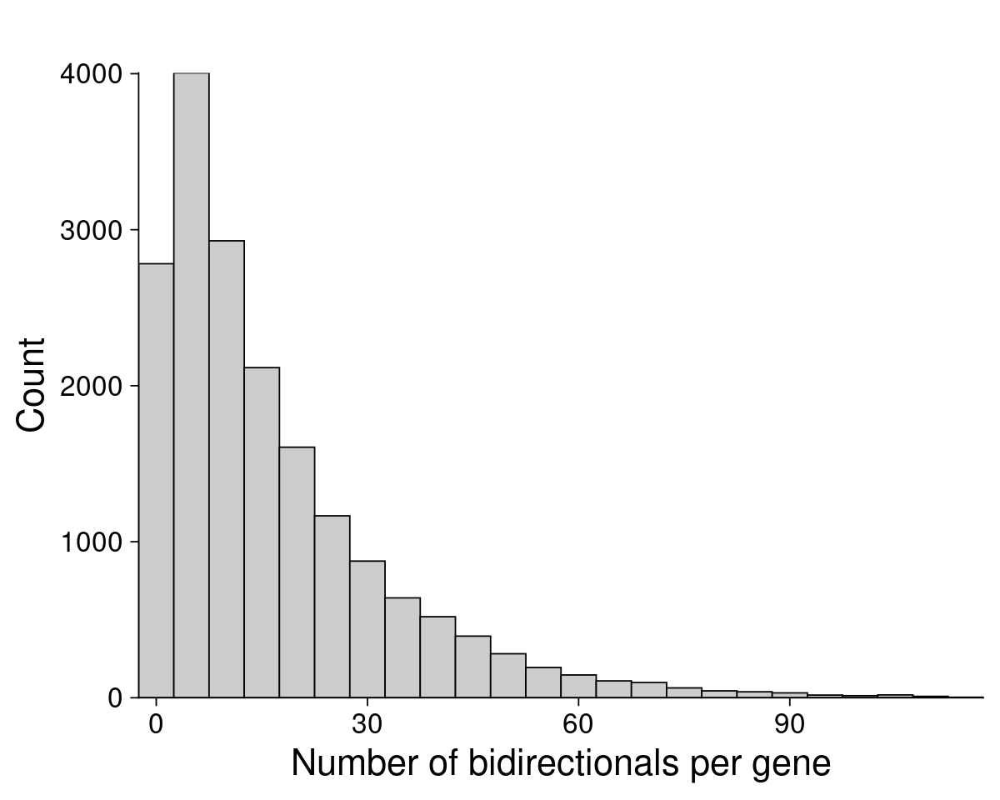

In [19]:
options(repr.plot.width=10, repr.plot.height=8)

num_bidir_hist <- ggplot(bidir_per_gene, aes(x=Freq)) +
  geom_histogram(color="black", fill="gray80", binwidth=5) +
labs(title = " ", 
       y = "Count",
       x = "Number of bidirectionals per gene") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0)) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

num_bidir_hist

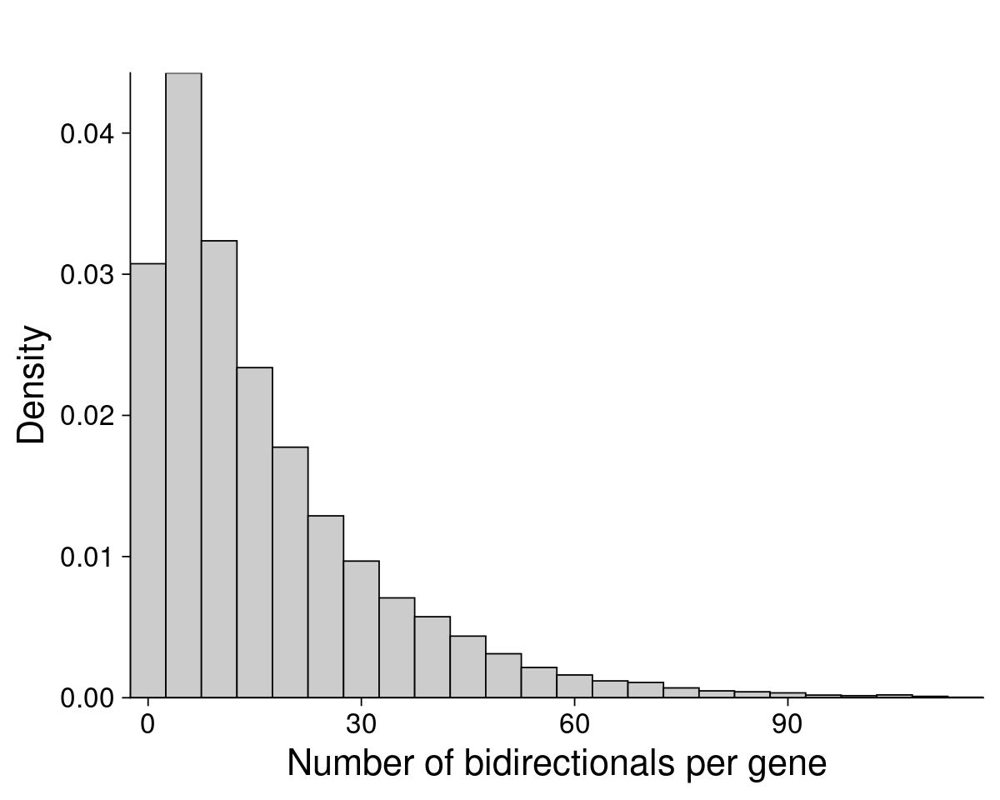

In [20]:
options(repr.plot.width=10, repr.plot.height=8)

num_bidir_hist_dens <- ggplot(bidir_per_gene, aes(x=Freq)) +
  geom_histogram(color="black", 
                 fill="gray80", 
                 binwidth=5,
                aes(y=..density..), position="identity") +
labs(title = " ", 
       y = "Density",
       x = "Number of bidirectionals per gene") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0)) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

num_bidir_hist_dens

In [21]:
gene_per_bidir <- as.data.frame(table(unique(sig_pairs_path_DT_0.8[,c('transcript_1','transcript_2')])$transcript_2))
gene_per_bidir

Var1,Freq
<fct>,<int>
chr1-100036622-100037040-dreg,13
chr1-10017270-10018456-tfit,19
"chr1-100181343-100182123-tfit,dreg",6
"chr1-1001830-1002132-tfit,dreg",42
"chr1-100185895-100186205-tfit,dreg",10
"chr1-100252733-100255069-tfit,dreg",1
chr1-100261063-100261249-tfit,14
chr1-100261943-100262281-tfit,6
"chr1-100263528-100263770-tfit,dreg",1


In [22]:
median(bidir_per_gene$Freq)
median(gene_per_bidir$Freq)

[1] 11

[1] 4

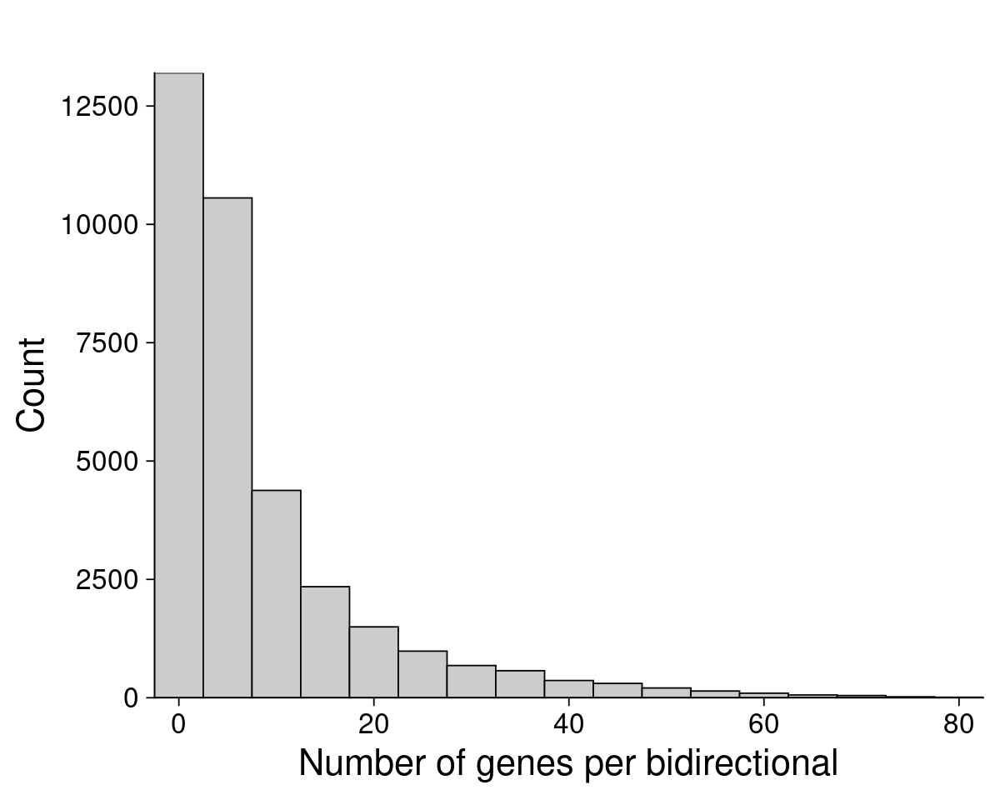

In [23]:
options(repr.plot.width=10, repr.plot.height=8)

num_genes_hist <- ggplot(gene_per_bidir, aes(x=Freq)) +
  geom_histogram(color="black", fill="gray80", binwidth=5) +
labs(title = " ", 
       y = "Count",
       x = "Number of genes per bidirectional") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0)) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

num_genes_hist

In [24]:
sig_pairs_path_DT_0.8_dist <- unique(sig_pairs_path_DT_0.8[,c('transcript_1','transcript_2', 'distance')])
dim(sig_pairs_path_DT_0.8_dist)
head(sig_pairs_path_DT_0.8_dist, 3)

[1] 299115      3

transcript_1,transcript_2,distance
<chr>,<chr>,<int>
ZNF697,chr1-119617691-119617999-dreg,-1686
ZNF695,chr1-246939041-246939883-tfit,-46282
ZNF695,chr1-246935071-246936169-dreg,-50252


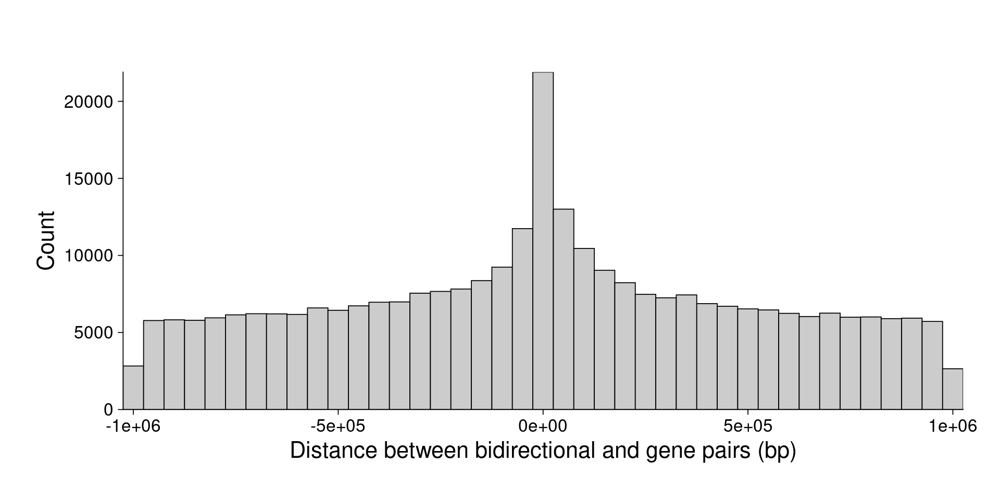

In [25]:
options(repr.plot.width=16, repr.plot.height=8)

gene_bidir_dist_hist <- ggplot(sig_pairs_path_DT_0.8_dist,
                               aes(x=distance)) +
  geom_histogram(color="black", fill="gray80", binwidth=50000) +
labs(title = " ", 
       y = "Count",
       x = "Distance between bidirectional and gene pairs (bp)") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0)#, labels = scales::comma
                  ) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20)) +
 theme(plot.margin = margin(1.5,1.5,1.5,1.5, "cm"))

gene_bidir_dist_hist

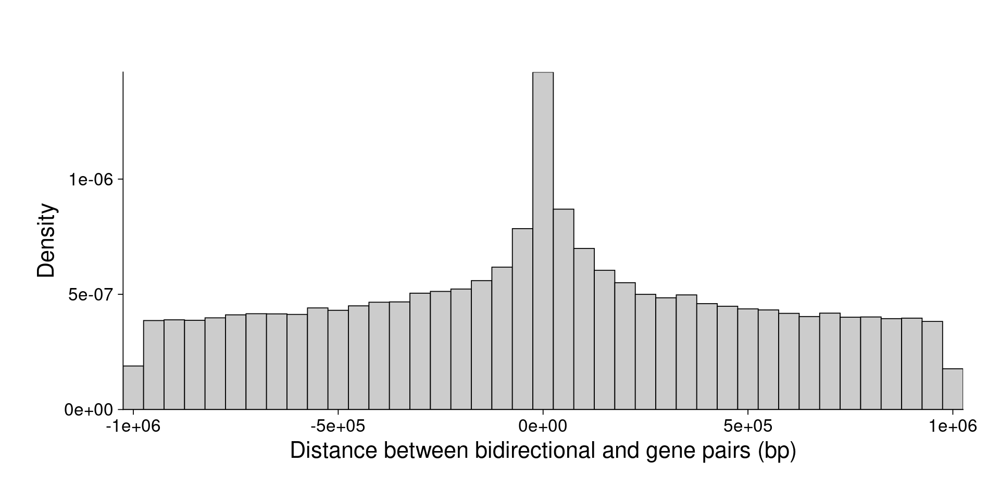

In [26]:
options(repr.plot.width=16, repr.plot.height=8)

gene_bidir_dist_hist_dens <- ggplot(sig_pairs_path_DT_0.8_dist,
                               aes(x=distance)) +
  geom_histogram(color="black", 
                 fill="gray80", 
                 binwidth=50000,
                aes(y=..density..), 
                 position="identity") +
labs(title = " ", 
       y = "Density",
       x = "Distance between bidirectional and gene pairs (bp)") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0)#, labels = scales::comma
                  ) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20)) +
 theme(plot.margin = margin(1.5,1.5,1.5,1.5, "cm"))

gene_bidir_dist_hist_dens

In [27]:
colnames(sig_pairs_path_DT_0.8)
head(sig_pairs_path_DT_0.8, 3)

[1] "transcript_1"             "transcript_2"            
 [3] "pair_id"                  "pcc"                     
 [5] "adj_p_BH"                 "pval"                    
 [7] "t"                        "nObs"                    
 [9] "transcript1_start"        "transcript1_end"         
[11] "transcript1_biotype"      "transcript2_start"       
[13] "transcript2_end"          "transcript2_biotype"     
[15] "distance"                 "tissue"                  
[17] "percent_transcribed_both"

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
ZNF697,chr1-119617691-119617999-dreg,ZNF697:chr1-119617691-119617999-dreg,0.8119128,1.038988e-38,9.172433e-43,18.39840,177,119619377,119647516,Gene,119617691,119617999,dREG,-1686,blood,76.95652
ZNF695,chr1-246939041-246939883-tfit,ZNF695:chr1-246939041-246939883-tfit,0.8079585,4.867975e-44,2.748808e-48,19.48826,204,246985323,247007307,Gene,246939041,246939883,Tfit,-46282,blood,88.69565
ZNF695,chr1-246935071-246936169-dreg,ZNF695:chr1-246935071-246936169-dreg,0.8632756,1.089097e-59,2.795049e-64,24.78549,212,246985323,247007307,Gene,246935071,246936169,dREG,-50252,blood,92.17391


### Tissue pair summary

In [28]:
sig_pairs_path_DT_0.8_tissues <- as.data.frame(table(sig_pairs_path_DT_0.8[,c('pair_id', 'tissue')]$pair_id))
dim(sig_pairs_path_DT_0.8_tissues)
head(sig_pairs_path_DT_0.8_tissues, 3)

[1] 299115      2

,Var1,Freq
,<fct>,<int>
1,"A1BG-AS1:chr19-57360570-57361865-tfit,dreg",1
2,A1BG-AS1:chr19-57403406-57404046-tfit,1
3,A1BG-AS1:chr19-57427811-57428099-dreg,1


In [29]:
subset(sig_pairs_path_DT_0.8_tissues, Freq > 1)

,Var1,Freq
,<fct>,<int>
23,"A1BG-AS1:chr19-58214388-58215364-tfit,dreg",2
25,A1BG-AS1:chr19-58382101-58382938-dreg,2
26,A1BG-AS1:chr19-58404050-58404336-dreg,2
27,A1BG-AS1:chr19-58406403-58407554-dreg,3
34,A1BG-AS1:chr19-58464863-58465880-dreg,3
41,"A1BG:chr19-57819556-57820261-tfit,dreg",3
45,"A1BG:chr19-58154718-58155285-tfit,dreg",2
46,A1BG:chr19-58382101-58382938-dreg,2
48,"A1BG:chr19-58401216-58401598-tfit,dreg",2


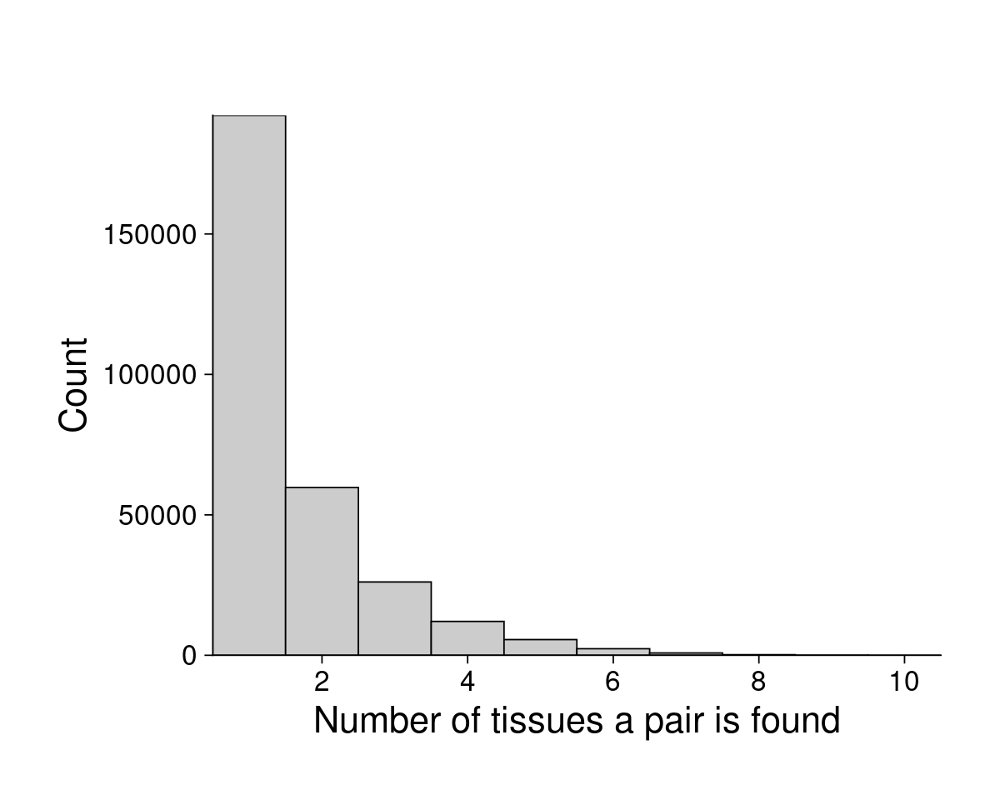

In [30]:
options(repr.plot.width=10, repr.plot.height=8)

num_tissues_hist <- ggplot(sig_pairs_path_DT_0.8_tissues, aes(x=Freq)) +
  geom_histogram(color="black", fill="gray80", binwidth=1) +
labs(title = " ", 
       y = "Count",
       x = "Number of tissues a pair is found") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0),
                   breaks = c(0,2,4,6,8,10,12)) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))+
 theme(plot.margin = margin(1.5,1.5,1.5,1.5, "cm"))

num_tissues_hist

In [31]:
ggsave(num_bidir_hist, width = 10, height = 8,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/summary_num_bidir_per_gene_hist.pdf',
      bg = "transparent")

ggsave(num_genes_hist, width = 10, height = 8,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/summary_num_genes_per_bidir_hist.pdf',
      bg = "transparent")

ggsave(gene_bidir_dist_hist, width = 10, height = 8,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/summary_gene_bidir_dist_hist.pdf',
      bg = "transparent")

ggsave(num_tissues_hist, width = 10, height = 8,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/summary_num_tissues_per_pair_hist.pdf',
      bg = "transparent")

In [32]:
sig_pairs_path_DT_0.8_dist_filt <- subset(sig_pairs_path_DT_0.8_dist, abs(distance) < 250000)
dim(sig_pairs_path_DT_0.8_dist_filt)
head(sig_pairs_path_DT_0.8_dist_filt, 3)

[1] 107363      3

transcript_1,transcript_2,distance
<chr>,<chr>,<int>
ZNF697,chr1-119617691-119617999-dreg,-1686
ZNF695,chr1-246939041-246939883-tfit,-46282
ZNF695,chr1-246935071-246936169-dreg,-50252


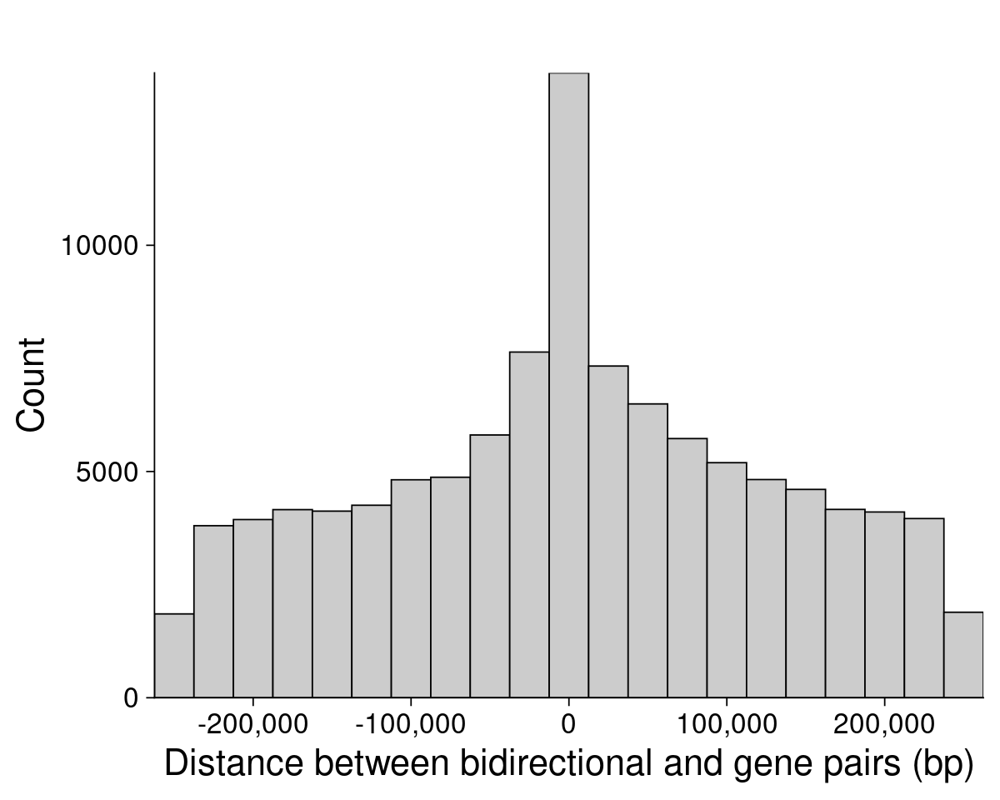

In [33]:
options(repr.plot.width=10, repr.plot.height=8)

gene_bidir_dist_hist0 <- ggplot(sig_pairs_path_DT_0.8_dist_filt,
                               aes(x=distance)) +
  geom_histogram(color="black", fill="gray80", binwidth=25000) +
labs(title = " ", 
       y = "Count",
       x = "Distance between bidirectional and gene pairs (bp)") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0), labels = scales::comma) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

gene_bidir_dist_hist0

In [34]:
sig_pairs_path_DT_0.8_summ <- unique(sig_pairs_path_DT_0.8[,c('transcript_1',
                                                              'transcript_2',
                                                              'pcc', 
                                                              'distance',
                                                             'adj_p_BH', 
                                                              'tissue',
                                                              'percent_transcribed_both')])
dim(sig_pairs_path_DT_0.8_summ)
head(sig_pairs_path_DT_0.8_summ)

[1] 487978      7

transcript_1,transcript_2,pcc,distance,adj_p_BH,tissue,percent_transcribed_both
<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>,<dbl>
ZNF697,chr1-119617691-119617999-dreg,0.8119128,-1686,1.038988e-38,blood,76.95652
ZNF695,chr1-246939041-246939883-tfit,0.8079585,-46282,4.867975e-44,blood,88.69565
ZNF695,chr1-246935071-246936169-dreg,0.8632756,-50252,1.089097e-59,blood,92.17391
ZNF695,chr1-247348071-247349550-dreg,0.8039345,362748,7.193551e-48,blood,97.82609
ZNF687,"chr1-151756203-151759125-tfit,dreg",0.8047614,473154,6.206643e-49,blood,99.56522
ZNF670-ZNF695,chr1-246939041-246939883-tfit,0.8392417,-6506,3.632219e-51,blood,89.13043


In [35]:
colnames(sig_pairs_path_DT_0.8)

[1] "transcript_1"             "transcript_2"            
 [3] "pair_id"                  "pcc"                     
 [5] "adj_p_BH"                 "pval"                    
 [7] "t"                        "nObs"                    
 [9] "transcript1_start"        "transcript1_end"         
[11] "transcript1_biotype"      "transcript2_start"       
[13] "transcript2_end"          "transcript2_biotype"     
[15] "distance"                 "tissue"                  
[17] "percent_transcribed_both"

In [36]:
sig_pairs_path_DT_0.8_blood <- subset(sig_pairs_path_DT_0.8_summ, tissue == 'blood')
dim(sig_pairs_path_DT_0.8_blood)

[1] 1544    7

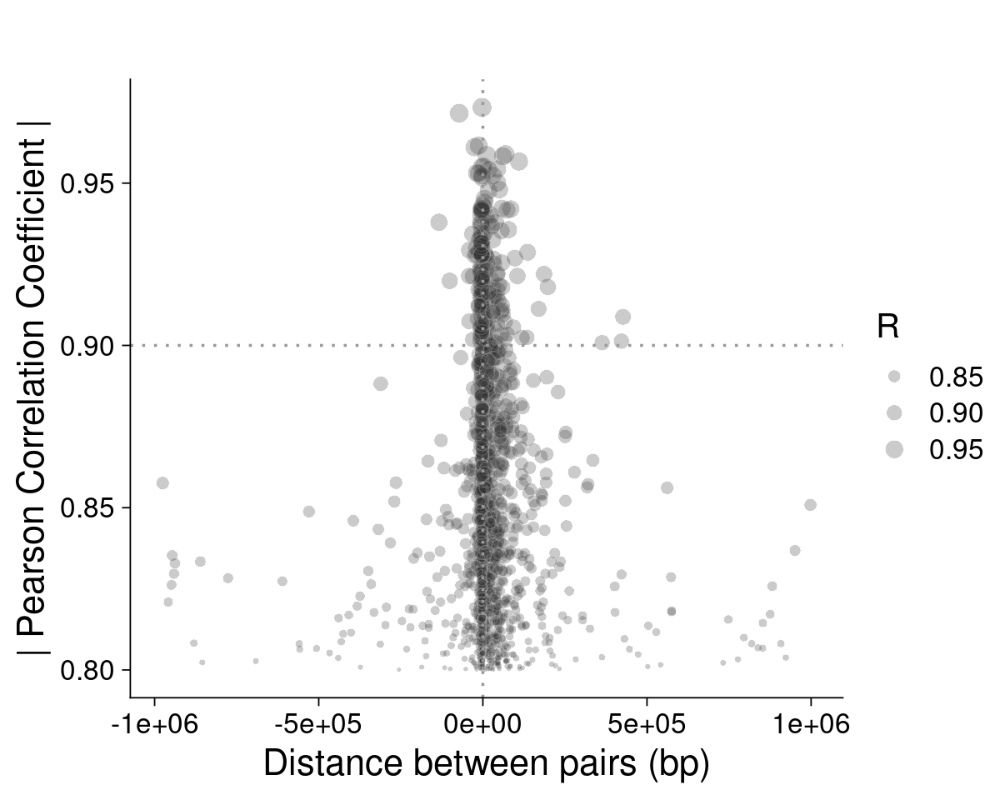

In [37]:
options(repr.plot.width=10, repr.plot.height=8)
pair_summary <- ggplot(sig_pairs_path_DT_0.8_blood, 
       aes(x=distance, 
           y=abs(pcc),
           size = abs(pcc))) +
  geom_point(alpha = 0.25,
             shape=21,
             color="gray80",
             fill='gray20') + 
geom_vline(xintercept = 0, linetype="dotted", 
                color = "gray60", size=1) +
geom_hline(yintercept = 0.9, linetype="dotted", 
                color = "gray60", size=1) +
theme_cowplot(24) +
  labs(title = " ", 
       y = "| Pearson Correlation Coefficient |",
       x = "Distance between pairs (bp)",
      size="R") +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 30), 
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

pair_summary

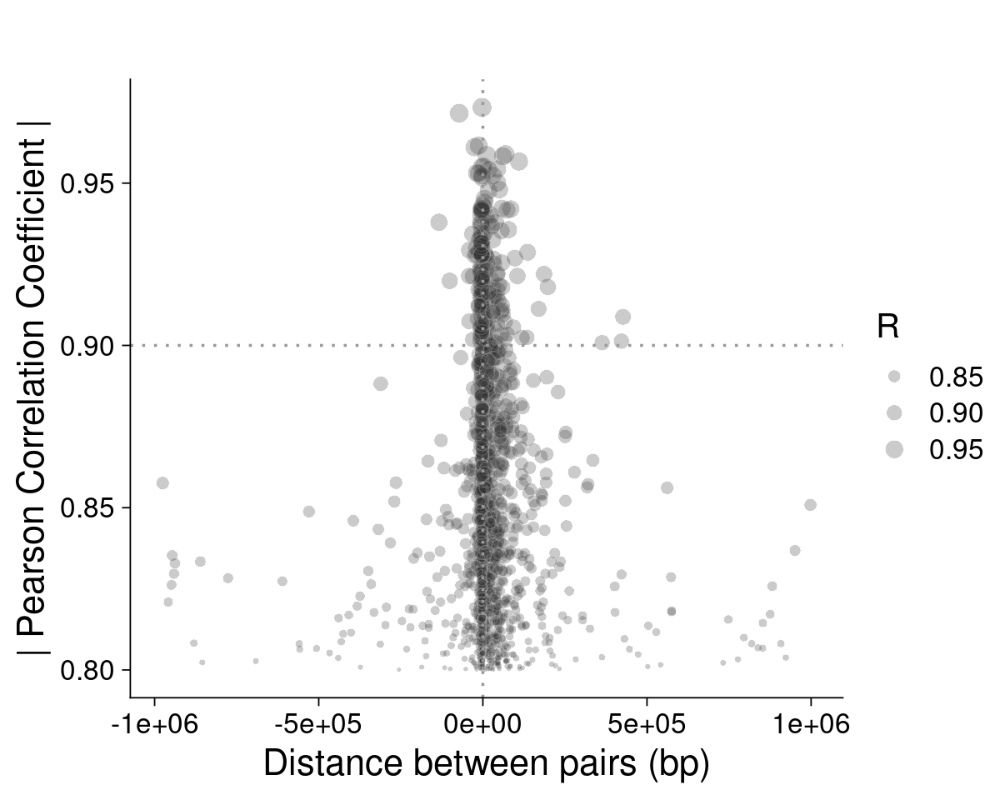

In [38]:
options(repr.plot.width=10, repr.plot.height=8)
pair_summary <- ggplot(sig_pairs_path_DT_0.8_blood, 
       aes(x=distance, 
           y=abs(pcc),
           size = abs(pcc))) +
  geom_point(alpha = 0.25,
             shape=21,
             color="gray80",
             fill='gray20') + 
geom_vline(xintercept = 0, linetype="dotted", 
                color = "gray60", size=1) +
geom_hline(yintercept = 0.9, linetype="dotted", 
                color = "gray60", size=1) +
theme_cowplot(24) +
  labs(title = " ", 
       y = "| Pearson Correlation Coefficient |",
       x = "Distance between pairs (bp)",
      size="R") +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 30), 
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

pair_summary

In [39]:
options(repr.plot.width=10, repr.plot.height=8)
pair_summary <- ggplot(sig_pairs_path_DT_0.8_blood, 
       aes(x=distance, 
           y=abs(coefficient),
           size = abs(coefficient))) +
  geom_point(alpha = 0.25,
             shape=21,
             color="gray80",
             fill='gray20') + 
geom_vline(xintercept = 0, linetype="dotted", 
                color = "gray60", size=1) +
geom_hline(yintercept = 0.9, linetype="dotted", 
                color = "gray60", size=1) +
theme_cowplot(24) +
  labs(title = " ", 
       y = "| Pearson Correlation Coefficient |",
       x = "Distance between pairs (bp)",
      size="R") +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 30), 
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

pair_summary

ERROR while rich displaying an object: Error in FUN(X[[i]], ...): object 'coefficient' not found

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
6. repr::mime2repr[[mime]](obj)
7. repr_text.default(obj)
8. paste(capture.output(p

## All samples

In [40]:
bidir_per_gene_all <- as.data.frame(table(unique(sig_pairs_all_path_DT_0.8[,c('transcript_1','transcript_2')])$transcript_1))
dim(bidir_per_gene_all)

[1] 5652    2

In [41]:
subset(bidir_per_gene_all, Var1=='RUNX1')

,Var1,Freq
,<fct>,<int>
4382,RUNX1,1


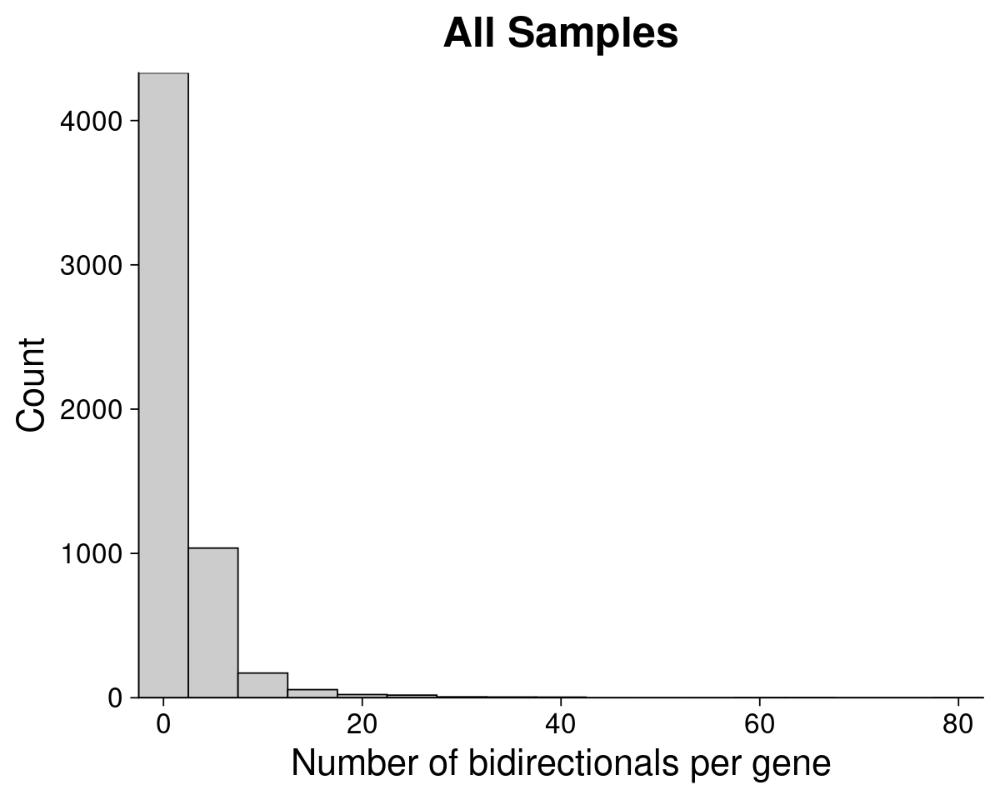

In [42]:
options(repr.plot.width=10, repr.plot.height=8)

num_bidir_hist_all <- ggplot(bidir_per_gene_all, aes(x=Freq)) +
  geom_histogram(color="black", fill="gray80", binwidth=5) +
labs(title = "All Samples", 
       y = "Count",
       x = "Number of bidirectionals per gene") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0)) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

num_bidir_hist_all

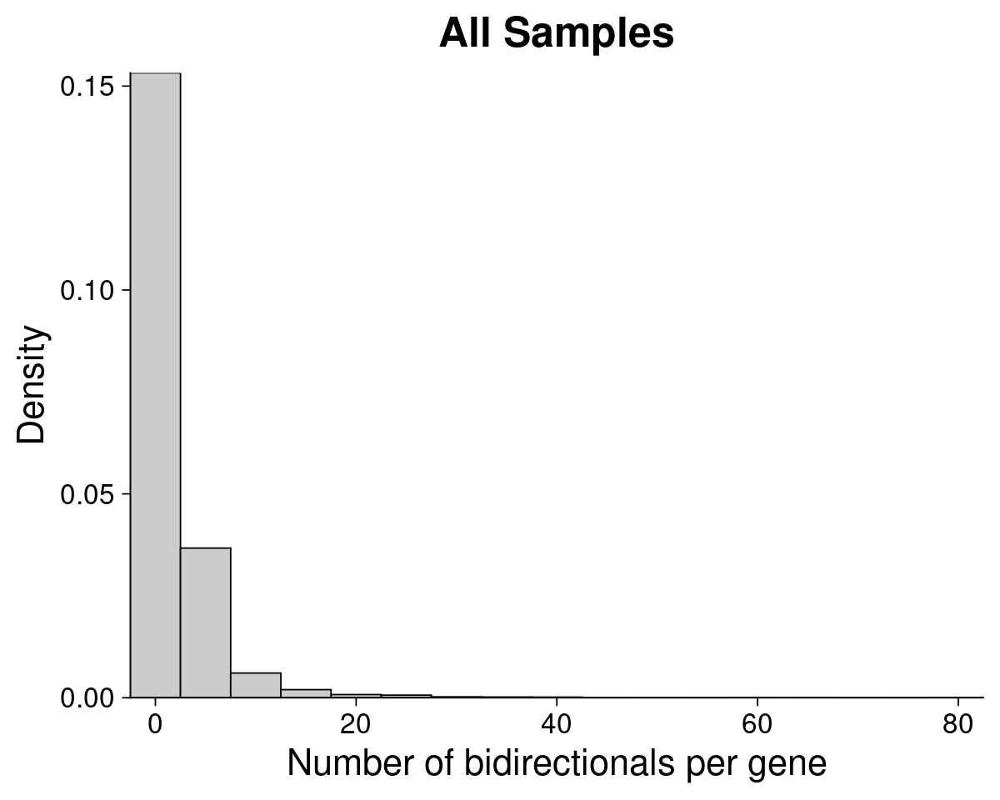

In [43]:
options(repr.plot.width=10, repr.plot.height=8)

num_bidir_hist_dens_all <- ggplot(bidir_per_gene_all, aes(x=Freq)) +
  geom_histogram(color="black", 
                 fill="gray80", 
                 binwidth=5,
                aes(y=..density..), position="identity") +
labs(title = "All Samples", 
       y = "Density",
       x = "Number of bidirectionals per gene") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0)) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

num_bidir_hist_dens_all

In [44]:
gene_per_bidir_all <- as.data.frame(table(unique(sig_pairs_all_path_DT_0.8[,c('transcript_1','transcript_2')])$transcript_2))
gene_per_bidir_all

Var1,Freq
<fct>,<int>
chr1-10017270-10018456-tfit,1
"chr1-100775432-100776728-tfit,dreg",1
chr1-101245331-101245699-dreg,2
"chr1-101298733-101299123-tfit,dreg",1
chr1-101307788-101308494-dreg,1
"chr1-101312595-101313235-tfit,dreg",1
"chr1-101314097-101315491-tfit,dreg",1
"chr1-101316075-101316691-tfit,dreg",1
chr1-101377893-101378241-tfit,1


In [45]:
median(bidir_per_gene_all$Freq)
median(gene_per_bidir_all$Freq)

[1] 1

[1] 1

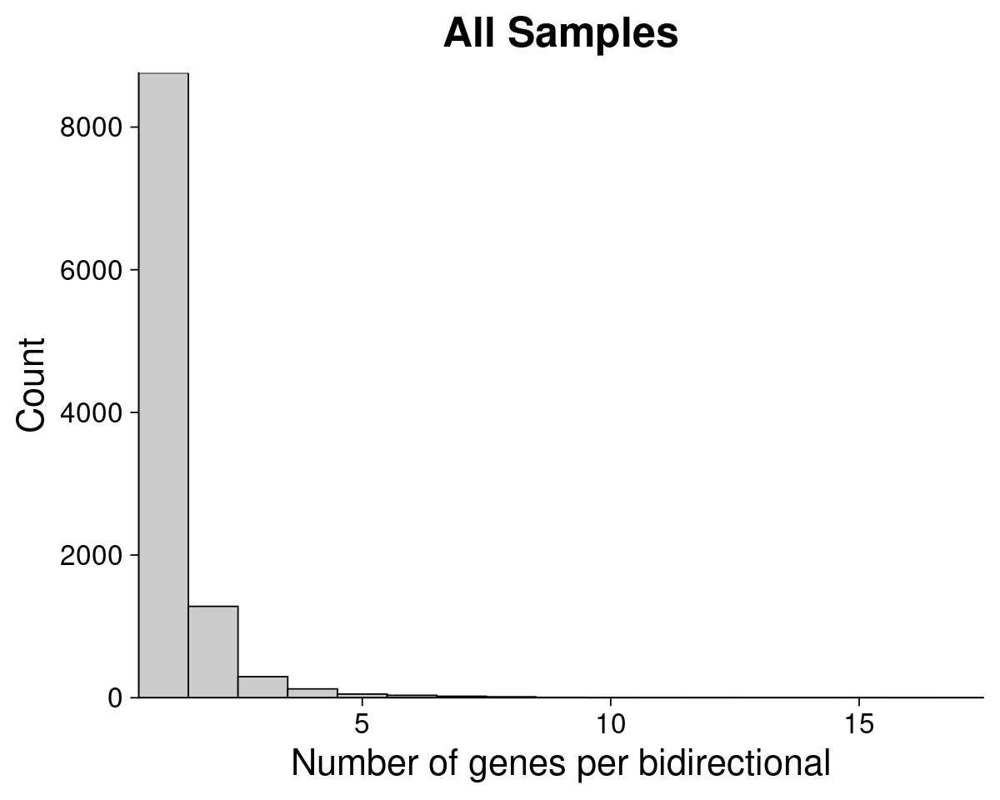

In [46]:
options(repr.plot.width=10, repr.plot.height=8)

num_genes_hist_all <- ggplot(gene_per_bidir_all, aes(x=Freq)) +
  geom_histogram(color="black", fill="gray80", binwidth=1) +
labs(title = "All Samples", 
       y = "Count",
       x = "Number of genes per bidirectional") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0)) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

num_genes_hist_all

In [47]:
sig_pairs_path_DT_0.8_dist_all <- unique(sig_pairs_all_path_DT_0.8[,c('transcript_1','transcript_2', 'distance')])
dim(sig_pairs_path_DT_0.8_dist_all)
head(sig_pairs_path_DT_0.8_dist_all, 3)

[1] 13669     3

transcript_1,transcript_2,distance
<chr>,<chr>,<int>
ZSCAN20,chr1-33498239-33500469-tfit,24844
ZRANB2-AS1,"chr1-70546208-70547686-tfit,dreg",-501048
ZRANB2-AS1,"chr1-70589474-70589968-tfit,dreg",-457782


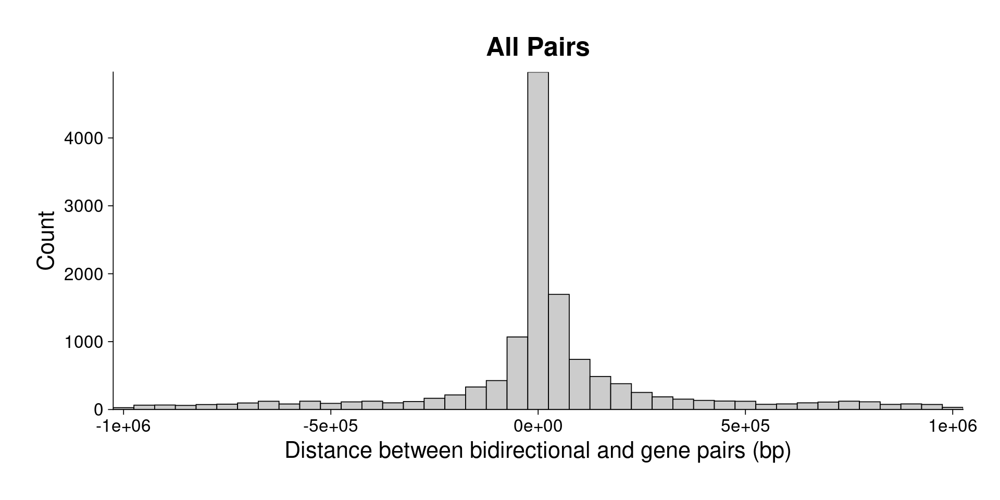

In [48]:
options(repr.plot.width=16, repr.plot.height=8)

gene_bidir_dist_hist_all <- ggplot(sig_pairs_path_DT_0.8_dist_all,
                               aes(x=distance)) +
  geom_histogram(color="black", fill="gray80", binwidth=50000) +
labs(title = "All Pairs", 
       y = "Count",
       x = "Distance between bidirectional and gene pairs (bp)") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0)#, labels = scales::comma
                  ) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20)) +
 theme(plot.margin = margin(1.5,1.5,1.5,1.5, "cm"))

gene_bidir_dist_hist_all

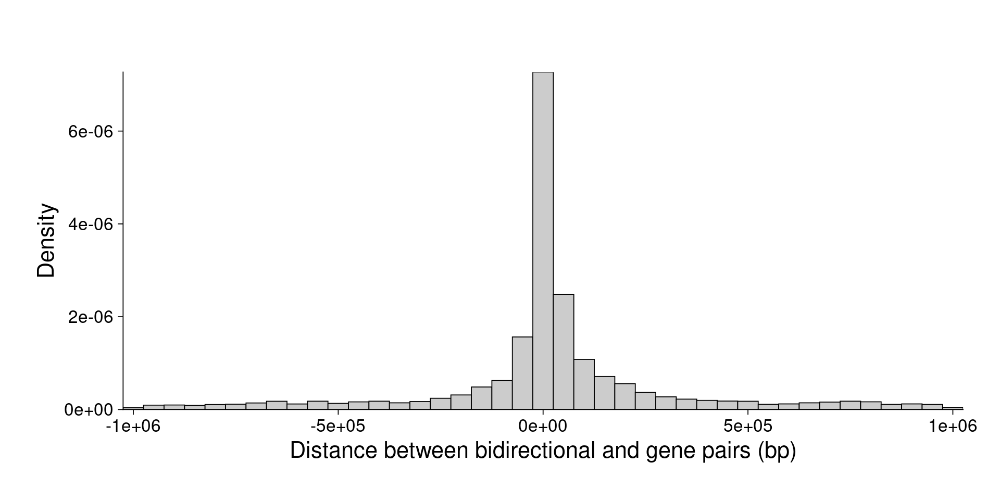

In [49]:
options(repr.plot.width=16, repr.plot.height=8)

gene_bidir_dist_hist_dens_all <- ggplot(sig_pairs_path_DT_0.8_dist_all,
                               aes(x=distance)) +
  geom_histogram(color="black", 
                 fill="gray80", 
                 binwidth=50000,
                aes(y=..density..), 
                 position="identity") +
labs(title = " ", 
       y = "Density",
       x = "Distance between bidirectional and gene pairs (bp)") +
theme_cowplot(24) +
scale_x_continuous(expand = c(0, 0)#, labels = scales::comma
                  ) +
scale_y_continuous(expand = c(0, 0)) +
theme(plot.title = element_text(size = 30, hjust = 0.5),
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20)) +
 theme(plot.margin = margin(1.5,1.5,1.5,1.5, "cm"))

gene_bidir_dist_hist_dens_all

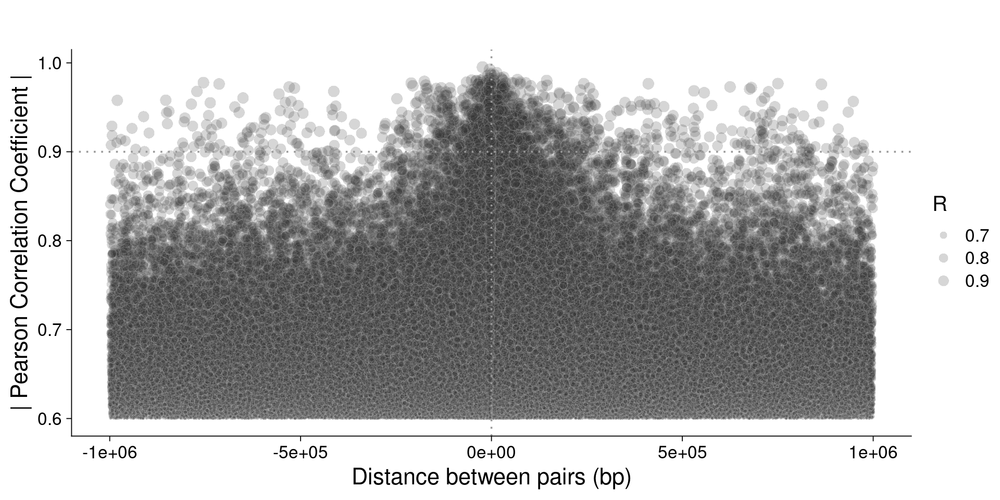

In [50]:
options(repr.plot.width=16, repr.plot.height=8)
pair_summary_allSamples <- ggplot(sig_pairs_all_path_DT, 
       aes(x=distance, 
           y=abs(pcc),
           size = abs(pcc))) +
  geom_point(alpha = 0.2,
             shape=21,
             color="gray80",
             fill='gray20') + 
geom_vline(xintercept = 0, linetype="dotted", 
                color = "gray60", size=1) +
geom_hline(yintercept = 0.9, linetype="dotted", 
                color = "gray60", size=1) +
theme_cowplot(24) +
  labs(title = " ", 
       y = "| Pearson Correlation Coefficient |",
       x = "Distance between pairs (bp)",
      size="R") +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 30), 
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

pair_summary_allSamples

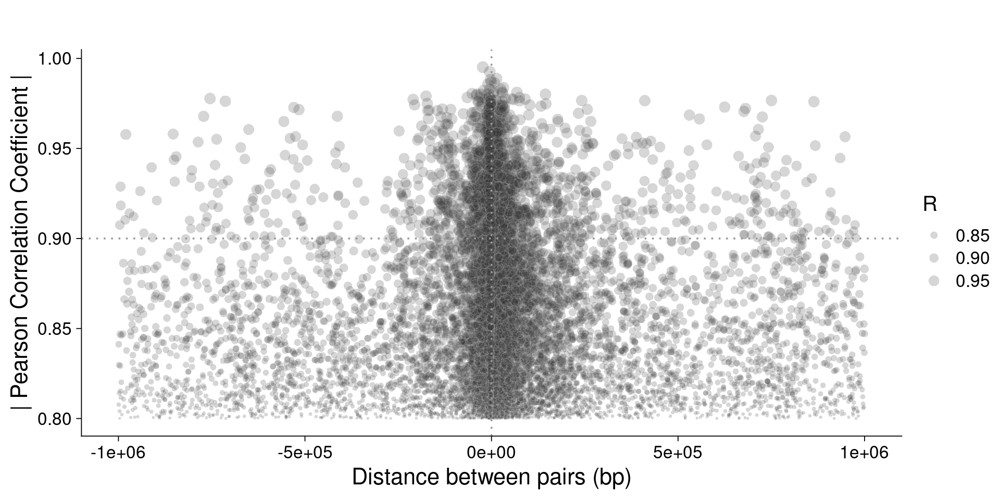

In [51]:
options(repr.plot.width=16, repr.plot.height=8)
pair_summary_allSamples_0.8 <- ggplot(sig_pairs_all_path_DT_0.8, 
       aes(x=distance, 
           y=abs(pcc),
           size = abs(pcc))) +
  geom_point(alpha = 0.2,
             shape=21,
             color="gray80",
             fill='gray20') + 
geom_vline(xintercept = 0, linetype="dotted", 
                color = "gray60", size=1) +
geom_hline(yintercept = 0.9, linetype="dotted", 
                color = "gray60", size=1) +
theme_cowplot(24) +
  labs(title = " ", 
       y = "| Pearson Correlation Coefficient |",
       x = "Distance between pairs (bp)",
      size="R") +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 30), 
      axis.title = element_text(size = 26), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 24),
     legend.text = element_text(size = 20))

pair_summary_allSamples_0.8

# Compare `tissue` vs `all samples`

## Overlap summary 

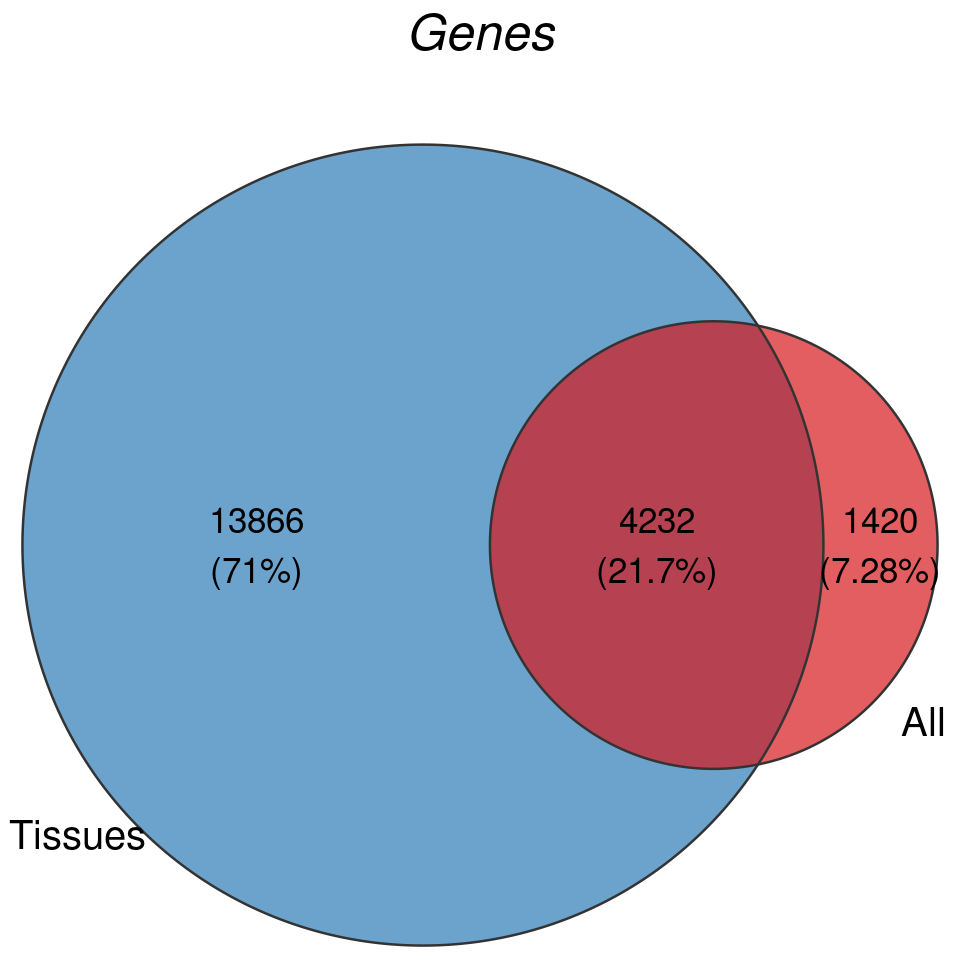

In [52]:
options(repr.plot.width=8, repr.plot.height=8)

genes_called <- venn.diagram(list(All = bidir_per_gene_all$Var1, 
                                  Tissues = bidir_per_gene$Var1),
                           filename = NULL,
                           main="Genes",
                           main.cex = 2.5,
                          main.fontfamily = 'sans',
                          fontfamily = 'sans',
                          main.fontface = 'italic',
                          alpha = 0.70,
                            print.mode=c("raw","percent"),
                           col = rep("gray20",2),
                           fill = c('#d7191c','#2c7bb6'),
                           cex = rep(1.75, 3),
                           cat.cex = rep(2, 2),
                         cat.fontfamily = 'sans')


grid.draw(genes_called);
grid.newpage()

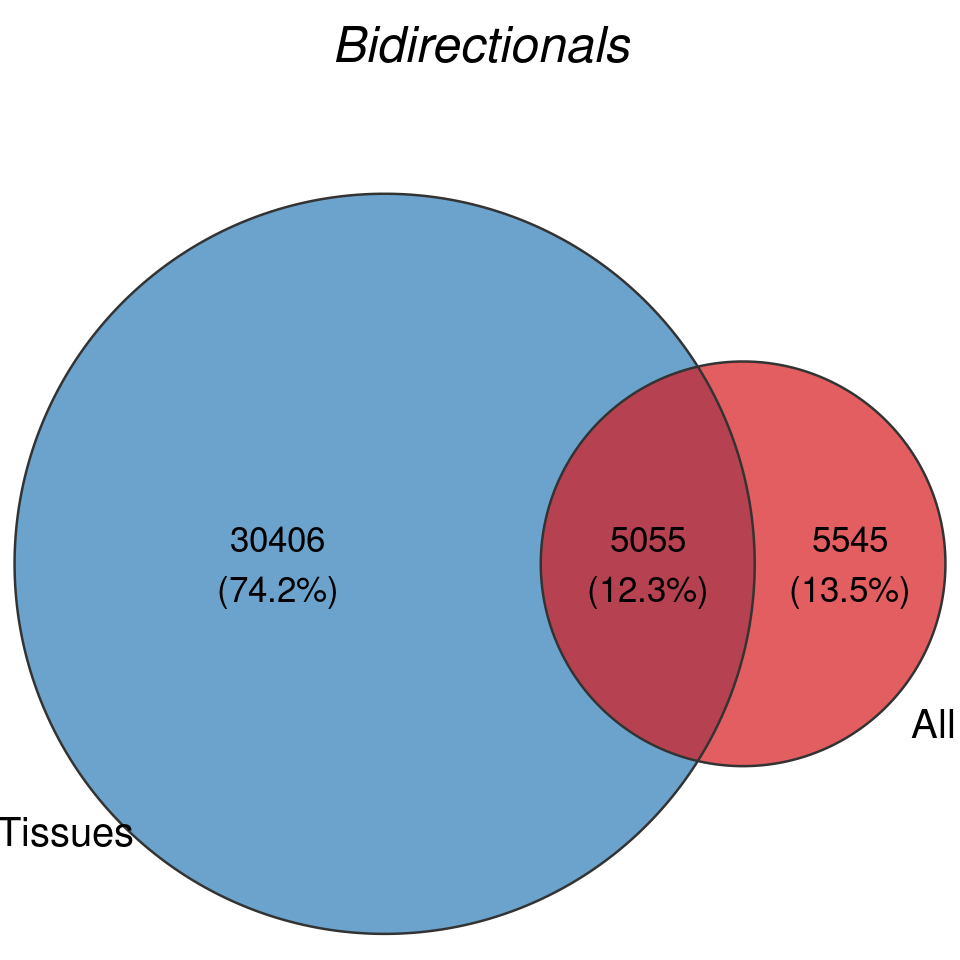

In [53]:
options(repr.plot.width=8, repr.plot.height=8)

bidirs_called <- venn.diagram(list(All = gene_per_bidir_all$Var1, 
                                  Tissues = gene_per_bidir$Var1),
                           filename = NULL,
                           main="Bidirectionals",
                           main.cex = 2.5,
                          main.fontfamily = 'sans',
                          fontfamily = 'sans',
                          main.fontface = 'italic',
                          alpha = 0.70,
                            print.mode=c("raw","percent"),
                           col = rep("gray20",2),
                           fill = c('#d7191c','#2c7bb6'),
                           cex = rep(1.75, 3),
                           cat.cex = rep(2, 2),
                         cat.fontfamily = 'sans')


grid.draw(bidirs_called);
grid.newpage()

### PCC > 0.6 for both

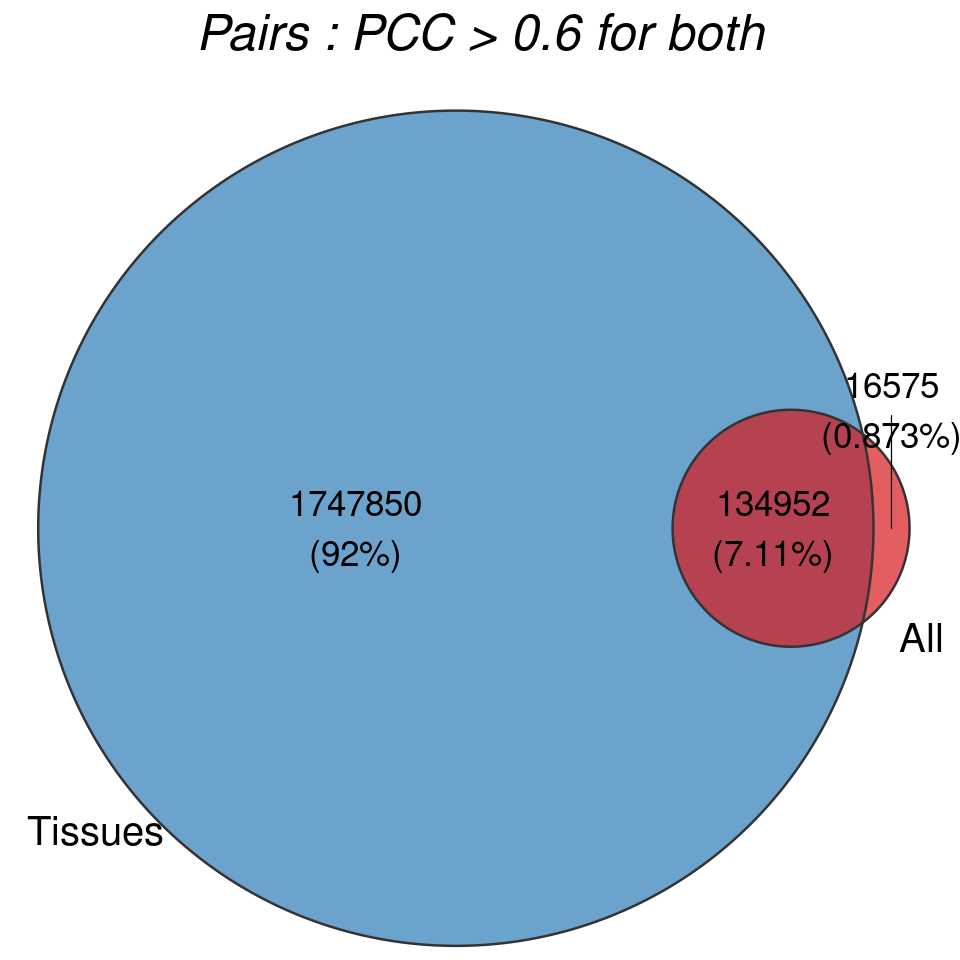

In [54]:
options(repr.plot.width=8, repr.plot.height=8)

pairs_called <- venn.diagram(list(All = sig_pairs_all_path_DT$pair_id, 
                                  Tissues = sig_pairs_path_DT$pair_id),
                           filename = NULL,
                           main="Pairs : PCC > 0.6 for both",
                           main.cex = 2.5,
                          main.fontfamily = 'sans',
                          fontfamily = 'sans',
                          main.fontface = 'italic',
                          alpha = 0.70,
                            print.mode=c("raw","percent"),
                           col = rep("gray20",2),
                           fill = c('#d7191c','#2c7bb6'),
                           cex = rep(1.75, 3),
                           cat.cex = rep(2, 2),
                         cat.fontfamily = 'sans')


grid.draw(pairs_called);
grid.newpage()

### PCC > 0.6 All and > 0.8 Tissue

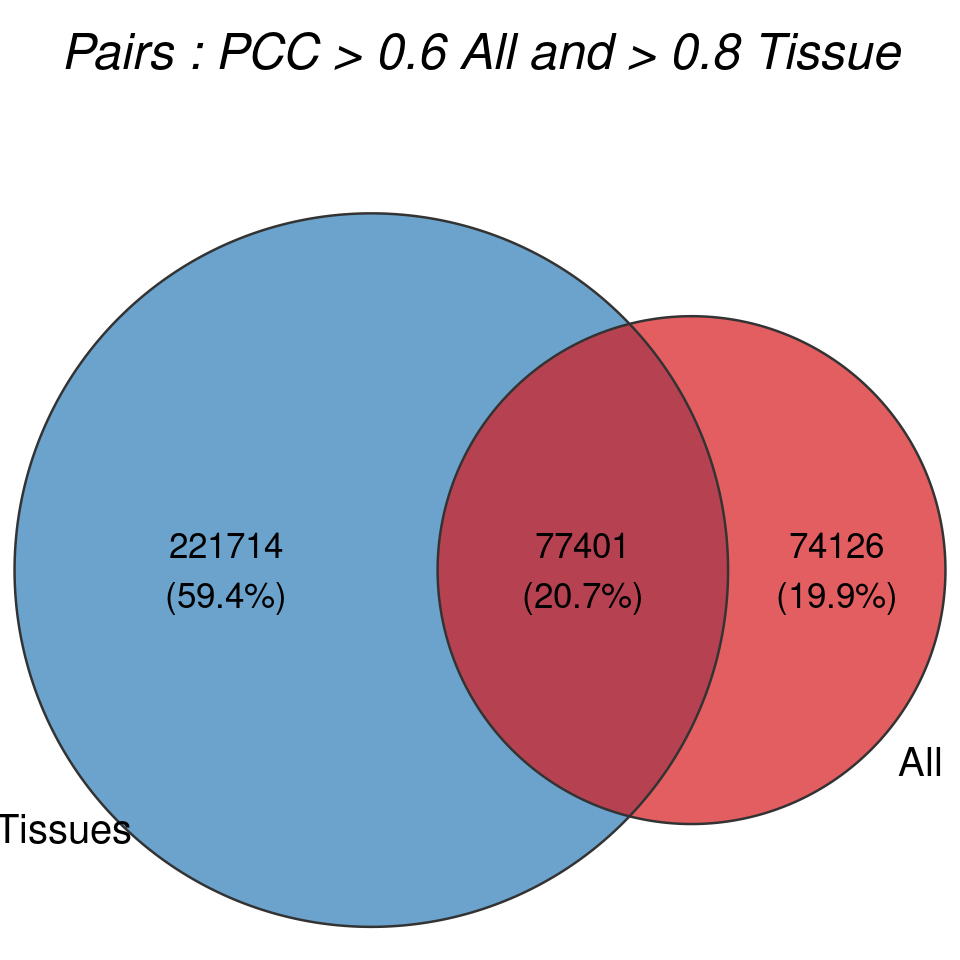

In [55]:
options(repr.plot.width=8, repr.plot.height=8)

pairs_called_08 <- venn.diagram(list(All = sig_pairs_all_path_DT$pair_id, 
                                  Tissues = sig_pairs_path_DT_0.8$pair_id),
                           filename = NULL,
                           main="Pairs : PCC > 0.6 All and > 0.8 Tissue",
                           main.cex = 2.5,
                          main.fontfamily = 'sans',
                          fontfamily = 'sans',
                          main.fontface = 'italic',
                          alpha = 0.70,
                            print.mode=c("raw","percent"),
                           col = rep("gray20",2),
                           fill = c('#d7191c','#2c7bb6'),
                           cex = rep(1.75, 3),
                           cat.cex = rep(2, 2),
                         cat.fontfamily = 'sans')


grid.draw(pairs_called_08);
grid.newpage()

###  PCC > 0.8 All and > 0.8 Tissue

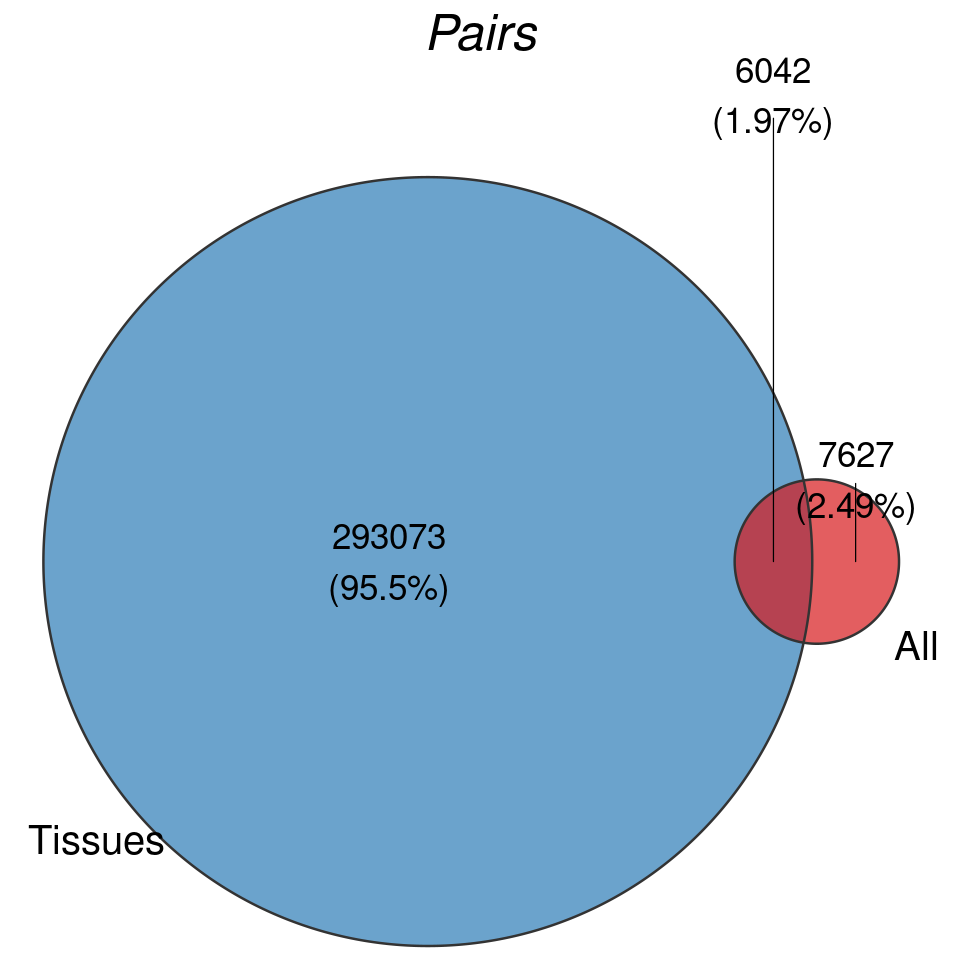

In [56]:
options(repr.plot.width=8, repr.plot.height=8)

pairs_called_both08 <- venn.diagram(list(All = sig_pairs_all_path_DT_0.8$pair_id, 
                                  Tissues = sig_pairs_path_DT_0.8$pair_id),
                           filename = NULL,
                           main="Pairs",
                           main.cex = 2.5,
                          main.fontfamily = 'sans',
                          fontfamily = 'sans',
                          main.fontface = 'italic',
                          alpha = 0.70,
                            print.mode=c("raw","percent"),
                           col = rep("gray20",2),
                           fill = c('#d7191c','#2c7bb6'),
                           cex = rep(1.75, 3),
                           cat.cex = rep(2, 2),
                         cat.fontfamily = 'sans')


grid.draw(pairs_called_both08);
grid.newpage()

## Get sets

### Both

In [57]:
overlap <- intersect(sig_pairs_all_path_DT$pair_id, 
                     sig_pairs_path_DT_0.8$pair_id)
length(overlap)
head(overlap)

[1] 77401

[1] "ZZZ3:chr1-77560995-77561253-tfit" "ZZZ3:chr1-77561368-77561728-dreg"
[3] "ZZZ3:chr1-77685403-77685767-dreg" "ZZZ3:chr1-77692601-77692809-dreg"
[5] "ZZZ3:chr1-77693510-77693782-dreg" "ZZZ3:chr1-77880578-77880964-dreg"

In [58]:
sig_pairs_path_DT_0.8_tissues_overlap <- sig_pairs_path_DT_0.8_tissues[sig_pairs_path_DT_0.8_tissues$Var1 %in% overlap,]
dim(sig_pairs_path_DT_0.8_tissues_overlap)
dim(sig_pairs_path_DT_0.8_tissues)

[1] 77401     2

[1] 299115      2

In [59]:
median(sig_pairs_path_DT_0.8_tissues_overlap$Freq)
median(sig_pairs_path_DT_0.8_tissues$Freq)

[1] 2

[1] 1

In [60]:
overlap_pair_df <- sig_pairs_path_DT_0.8[sig_pairs_path_DT_0.8$pair_id %in% overlap,]
overlap_genes <- unique(overlap_pair_df$transcript_1)
overlap_bidirs <- unique(overlap_pair_df$transcript_2)
length(overlap_genes)
length(overlap_bidirs)

[1] 12187

[1] 19985

In [61]:
overlap_counts <- gn_bdr_tpm_updated_df_trunc[gn_bdr_tpm_updated_df_trunc$GeneID %in%
                                              c(overlap_genes, overlap_bidirs),]
dim(overlap_counts)
head(overlap_counts, 3)

[1] 32172   893

chromosome,start,end,GeneID,Length,SRZ1950491,SRZ1950493,SRZ1950495,SRZ1950497,SRZ1950499,⋯,SRR11793829,SRR11793830,stdev,variance,mean,median,coefvar,max,bidir,bidir_id
<chr>,<int>,<int>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
chr1,77562416,77681908,ZZZ3,119493,5.829455,8.314578,5.980257,6.282368,6.340999,⋯,0.5279793,4.530625,4.004108,16.032880,6.242682,5.644451,0.6414082,36.13679,,Gene
chr17,4004445,4142280,ZZEF1,137836,2.965708,3.672934,3.443278,3.309438,3.710857,⋯,0.4787957,2.945369,2.723936,7.419826,4.139845,3.601543,0.6579801,18.42629,,Gene
chr3,126458901,126475169,ZXDC,16269,4.432499,5.130054,4.639450,4.063353,5.319617,⋯,0.4400926,3.607818,5.499086,30.239947,8.319729,7.157210,0.6609694,53.80431,,Gene


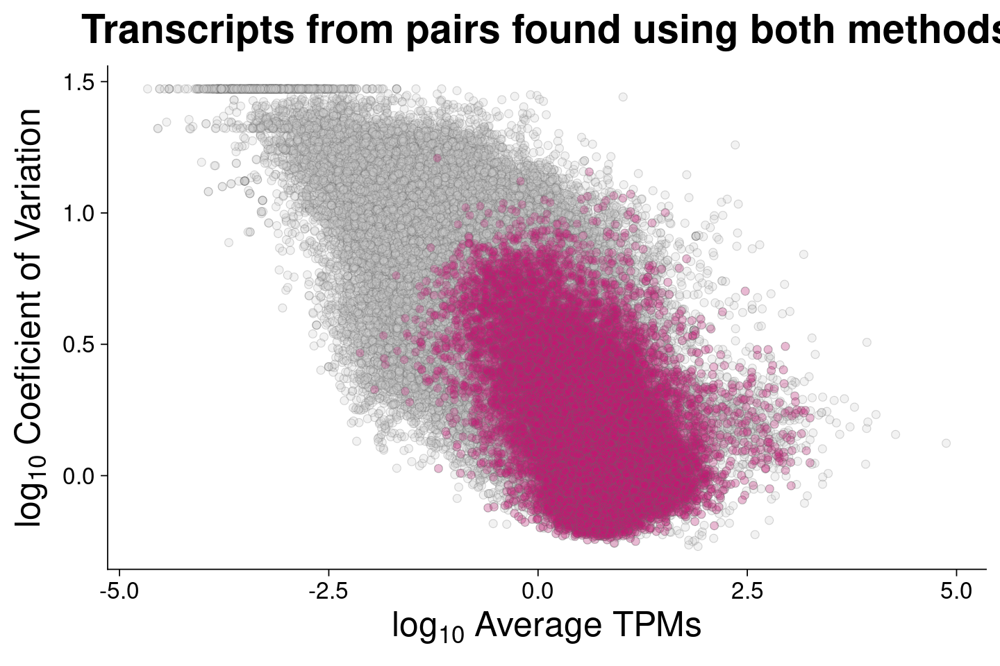

In [62]:
options(repr.plot.width=12, repr.plot.height=8)
overlap_cv <- ggplot(gn_bdr_tpm_updated_df_trunc, 
       aes(x=log(mean, base=10),
           y=log(coefvar, base=10))) + 
ggtitle("Transcripts from pairs found using both methods") +
xlab(expression(paste(log[10],' Average TPMs'))) + 
ylab(expression(paste(log[10], ' Coeficient of Variation', sep=""))) +
geom_point(color = 'gray40',
           fill = 'gray80',
           size = 3,
           shape = 21,
           alpha = 0.25) + 
geom_point(data=overlap_counts,
           aes(x=log(mean, base=10),
           y=log(coefvar, base=10)),
           color = 'gray40',
           fill = 'deeppink3',
           size = 3,
           shape = 21,
           alpha = 0.25) + 
theme_cowplot(24) +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 30,  face = "bold"), 
      axis.title = element_text(size = 30, face = "bold"), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 26),
     legend.text = element_text(size = 24)) 

overlap_cv

### Tissues only

In [63]:
tissue_only <- setdiff(sig_pairs_path_DT_0.8$pair_id, 
                       sig_pairs_all_path_DT$pair_id)
length(tissue_only)
print(tail(tissue_only))
head(tissue_only) 

[1] 221714

[1] "GYG2P1:chrY-13232389-13232527-tfit"  "GYG2P1:chrY-12362005-12362627-dreg" 
[3] "GYG2P1:chrY-13232881-13233369-dreg"  "DDX3Y:chrY-13232389-13232527-tfit"  
[5] "PRKY:chrY-7457640-7458831-tfit,dreg" "PRKY:chrY-7464871-7465785-tfit,dreg"


[1] "LOC101927851:chr1-234980647-234981157-tfit,dreg"
[2] "ZNF687:chr1-151798844-151799581-dreg"           
[3] "ZMYM6:chr1-35710391-35712609-dreg"              
[4] "ZFYVE9:chr1-52830051-52830779-dreg"             
[5] "ZFP69B:chr1-40295778-40296240-tfit"             
[6] "ZFP69B:chr1-40296790-40297138-dreg"

In [64]:
sig_pairs_path_DT_0.8_tissues_tissue <- sig_pairs_path_DT_0.8_tissues[sig_pairs_path_DT_0.8_tissues$Var1 %in% tissue_only,]
dim(sig_pairs_path_DT_0.8_tissues_tissue)
dim(sig_pairs_path_DT_0.8_tissues)

[1] 221714      2

[1] 299115      2

In [65]:
median(sig_pairs_path_DT_0.8_tissues_tissue$Freq)
median(sig_pairs_path_DT_0.8_tissues$Freq)

[1] 1

[1] 1

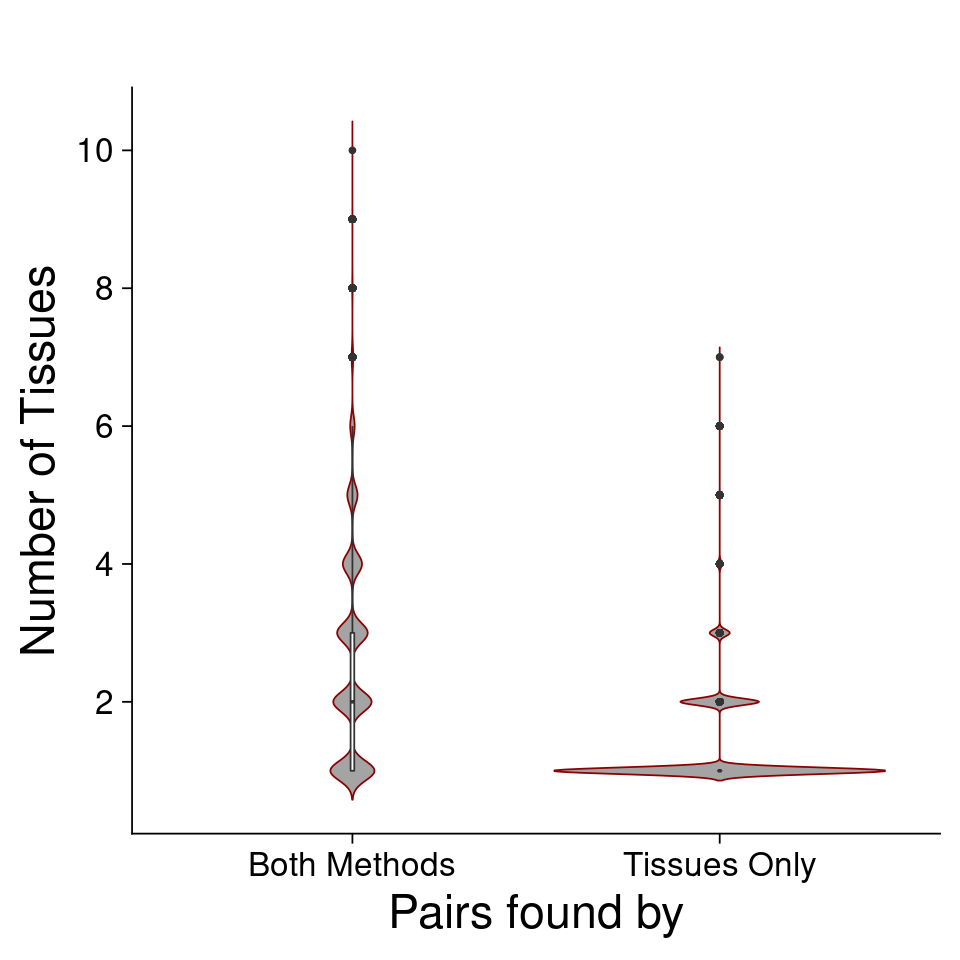

In [66]:
sig_pairs_path_DT_0.8_tissues_tissue$found <- 'Tissues Only'
sig_pairs_path_DT_0.8_tissues_overlap$found <- 'Both Methods'
num_tissues_support_pair <- rbind(sig_pairs_path_DT_0.8_tissues_overlap, 
                                 sig_pairs_path_DT_0.8_tissues_tissue)

options(repr.plot.width=8, repr.plot.height=8)
ggplot(num_tissues_support_pair, aes(x=found, y=Freq)) +
  geom_violin(trim=FALSE, fill='#A4A4A4', color="darkred")+
  geom_boxplot(width=0.01) + 
 scale_y_continuous(breaks = c(0,2,4,6,8,10,12)) +
ggtitle(" ") +
xlab("Pairs found by") + 
ylab("Number of Tissues") +
theme_cowplot(24) +
theme(plot.title = element_text(size = 30, hjust = 0.5, face = "bold"),
      axis.title = element_text(size = 28), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 26),
     legend.text = element_text(size = 24)) 

In [67]:
tissue_pair_df <- sig_pairs_path_DT_0.8[sig_pairs_path_DT_0.8$pair_id %in% tissue_only,]
tissue_genes <- unique(tissue_pair_df$transcript_1)
tissue_bidirs <- unique(tissue_pair_df$transcript_2)
length(tissue_genes)
length(tissue_bidirs)

[1] 17392

[1] 31861

In [68]:
tissue_counts <- gn_bdr_tpm_updated_df_trunc[gn_bdr_tpm_updated_df_trunc$GeneID %in%
                                              c(tissue_genes, tissue_bidirs),]
dim(tissue_counts)
head(tissue_counts, 3)

[1] 49253   893

chromosome,start,end,GeneID,Length,SRZ1950491,SRZ1950493,SRZ1950495,SRZ1950497,SRZ1950499,⋯,SRR11793829,SRR11793830,stdev,variance,mean,median,coefvar,max,bidir,bidir_id
<chr>,<int>,<int>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
chr1,77562416,77681908,ZZZ3,119493,5.829455,8.3145779,5.9802570,6.2823684,6.3409987,⋯,0.5279793,4.530625,4.004108,16.032880,6.242682,5.644451,0.6414082,36.13679,,Gene
chr17,4004445,4142280,ZZEF1,137836,2.965708,3.6729336,3.4432781,3.3094377,3.7108574,⋯,0.4787957,2.945369,2.723936,7.419826,4.139845,3.601543,0.6579801,18.42629,,Gene
chr7,143382095,143391111,ZYX,9017,1.324866,0.9145094,0.3628197,0.4957133,0.8411699,⋯,1.3579248,6.731350,19.013528,361.514236,14.768354,8.292290,1.2874507,185.82795,,Gene


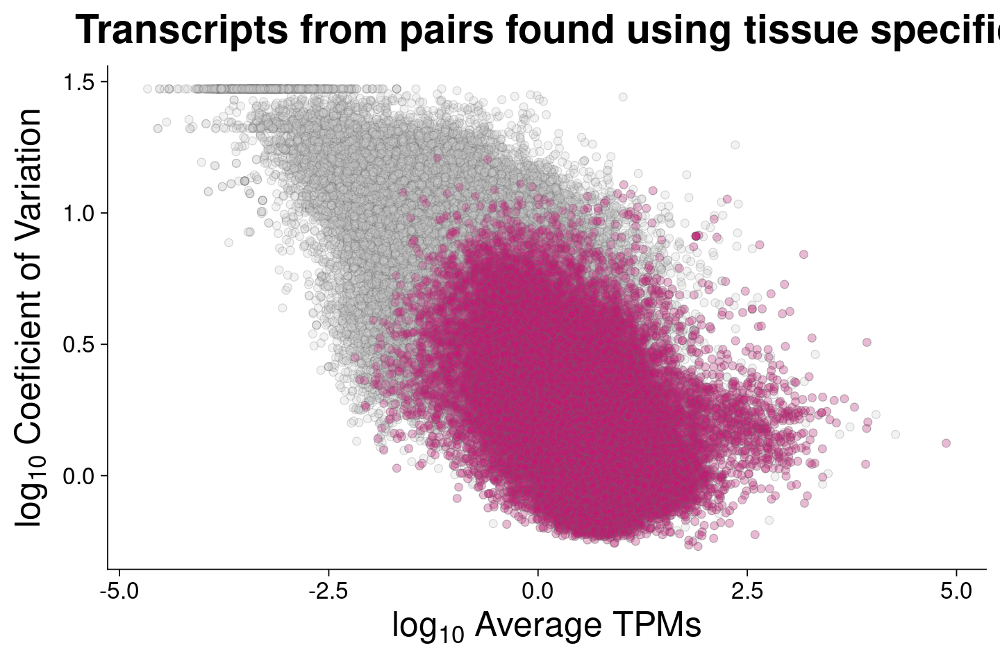

In [69]:
options(repr.plot.width=12, repr.plot.height=8)
tissue_cv <- ggplot(gn_bdr_tpm_updated_df_trunc, 
       aes(x=log(mean, base=10),
           y=log(coefvar, base=10))) + 
ggtitle("Transcripts from pairs found using tissue specific") +
xlab(expression(paste(log[10],' Average TPMs'))) + 
ylab(expression(paste(log[10], ' Coeficient of Variation', sep=""))) +
geom_point(color = 'gray40',
           fill = 'gray80',
           size = 3,
           shape = 21,
           alpha = 0.25) + 
geom_point(data=tissue_counts,
           aes(x=log(mean, base=10),
           y=log(coefvar, base=10)),
           color = 'gray40',
           fill = 'deeppink3',
           size = 3,
           shape = 21,
           alpha = 0.25) + 
theme_cowplot(24) +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 30,  face = "bold"), 
      axis.title = element_text(size = 30, face = "bold"), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 26),
     legend.text = element_text(size = 24)) 

tissue_cv

### All only

In [70]:
all_only <- setdiff(sig_pairs_all_path_DT$pair_id,
                    sig_pairs_path_DT_0.8$pair_id)
length(all_only)
head(all_only, 40)
tail(all_only, 40)

[1] 74126

[1] "ZZZ3:chr1-78549583-78550187-tfit,dreg"      
 [2] "ZZZ3:chr1-78435277-78435871-tfit"           
 [3] "ZZZ3:chr1-78478067-78478583-tfit"           
 [4] "ZZZ3:chr1-78488748-78488998-tfit"           
 [5] "ZZZ3:chr1-78546215-78546477-tfit"           
 [6] "ZZZ3:chr1-78547551-78548449-tfit"           
 [7] "ZZZ3:chr1-78458321-78458699-dreg"           
 [8] "ZSWIM5:chr1-45207903-45208533-tfit"         
 [9] "ZSWIM5:chr1-45212302-45213100-tfit"         
[10] "ZSCAN20:chr1-33501875-33502115-dreg"        
[11] "ZRANB2-AS1:chr1-70528126-70529064-tfit,dreg"
[12] "ZRANB2-AS1:chr1-70546208-70547686-tfit,dreg"
[13] "ZRANB2-AS1:chr1-70585975-70586595-tfit,dreg"
[14] "ZRANB2-AS1:chr1-70588026-70588400-tfit,dreg"
[15] "ZRANB2-AS1:chr1-70589474-70589968-tfit,dreg"
[16] "ZRANB2-AS1:chr1-70593576-70593956-tfit,dreg"
[17] "ZRANB2-AS1:chr1-70685359-70685651-tfit,dreg"
[18] "ZRANB2-AS1:chr1-70567015-70568295-tfit"     
[19] "ZRANB2-AS1:chr1-70592432-70592752-tfit"     
[20] "ZRANB2-AS1:chr1-70686400-70689702-tfit"     
[21] "ZRANB2-AS1:chr1-70827329-70829543-tfit"     
[22] "ZRANB2-AS1:chr1-70848319-70848541-tfit"     
[23] "ZRANB2-AS1:chr1-70600497-70600993-dreg"     
[24] "ZRANB2-AS1:chr1-70621441-70621759-dreg"     
[25] "ZRANB2-AS1:chr1-70653431-70653809-dreg"     
[26] "ZRANB2-AS1:chr1-70658061-70658429-dreg"     
[27] "ZRANB2:chr1-70587013-70587373-dreg"         
[28] "ZNHIT6:chr1-85639521-85639869-dreg"         
[29] "ZNF847P:chr1-227857182-227858806-tfit,dreg" 
[30] "ZNF847P:chr1-227961642-227962473-tfit,dreg" 
[31] "ZNF847P:chr1-228469699-228471164-tfit,dreg" 
[32] "ZNF847P:chr1-227797704-227798492-tfit"      
[33] "ZNF847P:chr1-228474398-228475300-tfit"      
[34] "ZNF847P:chr1-228131010-228131420-dreg"      
[35] "ZNF847P:chr1-228137024-228137306-dreg"      
[36] "ZNF847P:chr1-228465891-228466199-dreg"      
[37] "ZNF847P:chr1-228478911-228479371-dreg"      
[38] "ZNF847P:chr1-228482816-228483124-dreg"      
[39] "ZNF697:chr1-119603727-119604121-tfit"       
[40] "ZNF697:chr1-119672405-119672947-tfit"

[1] "LINC00278:chrY-3121867-3122393-tfit"    
 [2] "KDM5D:chrY-19432891-19433411-tfit,dreg" 
 [3] "KDM5D:chrY-19078805-19079111-tfit"      
 [4] "KDM5D:chrY-19079807-19080425-tfit"      
 [5] "KDM5D:chrY-19694283-19694545-tfit"      
 [6] "KDM5D:chrY-20642681-20643727-tfit"      
 [7] "KDM5D:chrY-19613131-19613719-dreg"      
 [8] "KDM5D:chrY-19780948-19781706-dreg"      
 [9] "GYG2P1:chrY-12391012-12392614-tfit,dreg"
[10] "GYG2P1:chrY-12394979-12395927-tfit,dreg"
[11] "GYG2P1:chrY-12379503-12380189-tfit"     
[12] "GYG2P1:chrY-12403995-12404277-tfit"     
[13] "GYG2P1:chrY-12387448-12387852-dreg"     
[14] "EIF1AY:chrY-21180643-21184457-tfit,dreg"
[15] "EIF1AY:chrY-21185062-21186210-tfit,dreg"
[16] "EIF1AY:chrY-19688533-19688765-tfit"     
[17] "EIF1AY:chrY-19694283-19694545-tfit"     
[18] "EIF1AY:chrY-20451377-20451915-tfit"     
[19] "EIF1AY:chrY-20572543-20574651-tfit"     
[20] "EIF1AY:chrY-20642681-20643727-tfit"     
[21] "EIF1AY:chrY-19613131-19613719-dreg"     
[22] "EIF1AY:chrY-19699620-19700144-dreg"     
[23] "EIF1AY:chrY-20593742-20593994-dreg"     
[24] "EIF1AY:chrY-21249113-21249635-dreg"     
[25] "EIF1AY:chrY-21259210-21259530-dreg"     
[26] "DDX3Y:chrY-12296326-12297798-tfit,dreg" 
[27] "DDX3Y:chrY-12651024-12651404-tfit,dreg" 
[28] "DDX3Y:chrY-12941719-12942433-tfit,dreg" 
[29] "DDX3Y:chrY-11924919-11925049-tfit"      
[30] "DDX3Y:chrY-13712825-13713167-tfit"      
[31] "DDX3Y:chrY-13728253-13730104-tfit"      
[32] "DDX3Y:chrY-13738962-13740260-tfit"      
[33] "DDX3Y:chrY-12938151-12938449-dreg"      
[34] "DDX3Y:chrY-13777931-13778193-dreg"      
[35] "DDX3Y:chrY-13825209-13825505-dreg"      
[36] "DDX3Y:chrY-13850741-13851009-dreg"      
[37] "DDX3Y:chrY-13874279-13874861-dreg"      
[38] "BCORP1:chrY-19406306-19408492-tfit,dreg"
[39] "BCORP1:chrY-19432891-19433411-tfit,dreg"
[40] "BCORP1:chrY-19550148-19550360-tfit,dreg"

In [71]:
all_pair_df <- sig_pairs_all_path_DT[sig_pairs_all_path_DT$pair_id %in% all_only,]
all_genes <- unique(all_pair_df$transcript_1)
all_bidirs <- unique(all_pair_df$transcript_2)
length(all_genes)
length(all_bidirs)

[1] 16952

[1] 45917

In [72]:
all_counts <- gn_bdr_tpm_updated_df_trunc[gn_bdr_tpm_updated_df_trunc$GeneID %in%
                                              c(all_genes, all_bidirs),]
dim(all_counts)
head(all_counts, 3)

[1] 62869   893

chromosome,start,end,GeneID,Length,SRZ1950491,SRZ1950493,SRZ1950495,SRZ1950497,SRZ1950499,⋯,SRR11793829,SRR11793830,stdev,variance,mean,median,coefvar,max,bidir,bidir_id
<chr>,<int>,<int>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
chr1,77562416,77681908,ZZZ3,119493,5.829455,8.314578,5.980257,6.282368,6.340999,⋯,0.5279793,4.530625,4.004108,16.032880,6.242682,5.644451,0.6414082,36.13679,,Gene
chr3,126458901,126475169,ZXDC,16269,4.432499,5.130054,4.639450,4.063353,5.319617,⋯,0.4400926,3.607818,5.499086,30.239947,8.319729,7.157210,0.6609694,53.80431,,Gene
chrX,57592586,57597477,ZXDB,4892,2.308811,3.422352,1.337508,1.875501,1.788987,⋯,0.0424228,1.590681,2.941938,8.654998,3.411378,2.741799,0.8623898,41.36633,,Gene


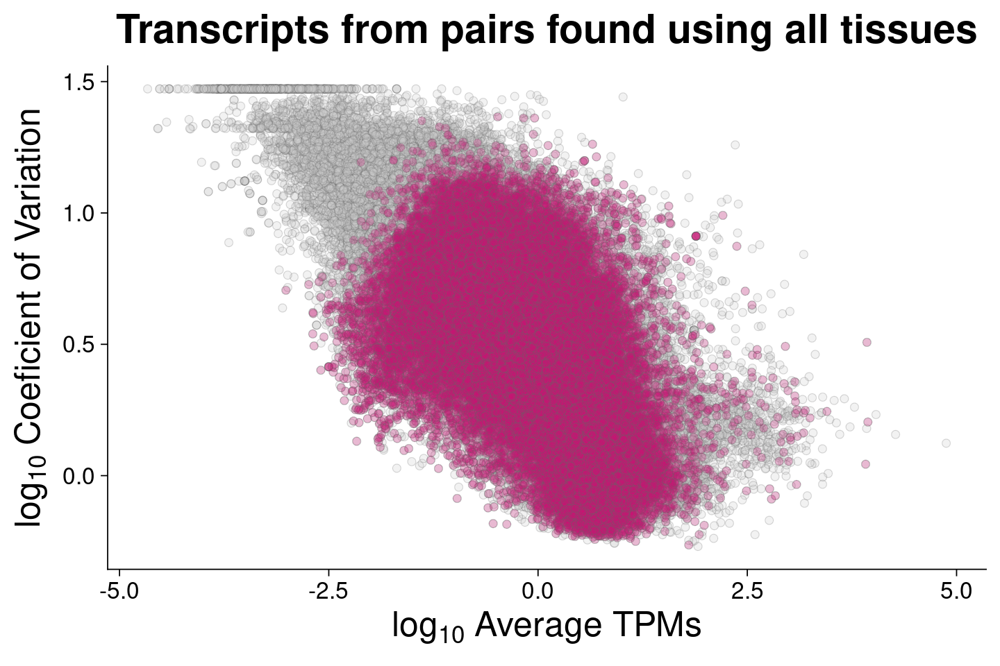

In [73]:
options(repr.plot.width=12, repr.plot.height=8)
all_cv <- ggplot(gn_bdr_tpm_updated_df_trunc, 
       aes(x=log(mean, base=10),
           y=log(coefvar, base=10))) + 
ggtitle("Transcripts from pairs found using all tissues") +
xlab(expression(paste(log[10],' Average TPMs'))) + 
ylab(expression(paste(log[10], ' Coeficient of Variation', sep=""))) +
geom_point(color = 'gray40',
           fill = 'gray80',
           size = 3,
           shape = 21,
           alpha = 0.25) + 
geom_point(data=all_counts,
           aes(x=log(mean, base=10),
           y=log(coefvar, base=10)),
           color = 'gray40',
           fill = 'deeppink3',
           size = 3,
           shape = 21,
           alpha = 0.25) + 
theme_cowplot(24) +
theme(plot.title = element_text(hjust = 0.5),
      title = element_text(size = 30,  face = "bold"), 
      axis.title = element_text(size = 30, face = "bold"), 
      axis.text.x = element_text(size = 20),
      axis.text.y = element_text(size = 20),
     legend.title = element_text(size = 26),
     legend.text = element_text(size = 24)) 

all_cv

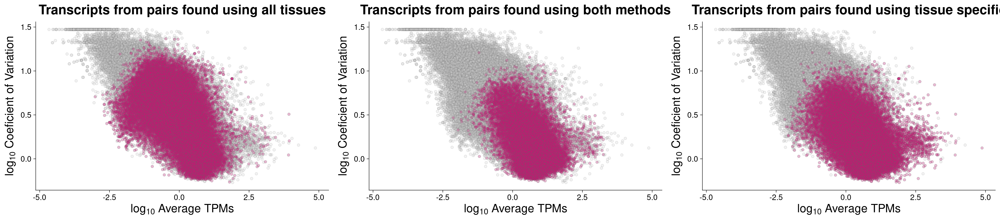

In [74]:
options(repr.plot.width=36, repr.plot.height=8)
cowplot::plot_grid(all_cv, overlap_cv, tissue_cv,
                   ncol = 3, nrow = 1 )

# Pair examples


## Plot pair for ZZZ3 : Both

In [75]:
subset(sig_pairs_path_DT_0.8, pair_id =='ZZZ3:chr1-77560995-77561253-tfit') 

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
ZZZ3,chr1-77560995-77561253-tfit,ZZZ3:chr1-77560995-77561253-tfit,0.8767971,7.190826e-32,7.555046e-35,18.59502,106,77562416,77681908,Gene,77560995,77561253,Tfit,-1421,kidney,92.17391
ZZZ3,chr1-77560995-77561253-tfit,ZZZ3:chr1-77560995-77561253-tfit,0.8416262,4.766497e-13,2.965906e-15,11.12915,53,77562416,77681908,Gene,77560995,77561253,Tfit,-1421,prostate,96.36364
ZZZ3,chr1-77560995-77561253-tfit,ZZZ3:chr1-77560995-77561253-tfit,0.9226068,5.938145e-16,2.122040e-19,15.68390,45,77562416,77681908,Gene,77560995,77561253,Tfit,-1421,uterus,93.75000


[1] "ZZZ3"
[1] "chr1-77560995-77561253-tfit"
   transcript_1                transcript_2                          pair_id
1:         ZZZ3 chr1-77560995-77561253-tfit ZZZ3:chr1-77560995-77561253-tfit
         pcc     adj_p_BH         pval        t nObs transcript1_start
1: 0.8767971 7.190826e-32 7.555046e-35 18.59502  106          77562416
   transcript1_end transcript1_biotype transcript2_start transcript2_end
1:        77681908                Gene          77560995        77561253
   transcript2_biotype distance tissue percent_transcribed_both
1:                Tfit    -1421 kidney                 92.17391
[1] "Bidir: chr1-77560995-77561253-tfit"
[1] "Gene: ZZZ3"
[1] "Coeff: 0.87679714979065"
[1] "Adj p-val: 7.19082632047303e-32"
               ZZZ3 chr1-77560995-77561253-tfit
SRZ1950491 5.829455                    6.735064
SRZ1950493 8.314578                   16.465143
SRZ1950495 5.980257                   11.774663
SRZ1950497 6.282368                    7.294732
SRZ1950499 6.340999

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 9 rows containing non-finite values (stat_smooth).”


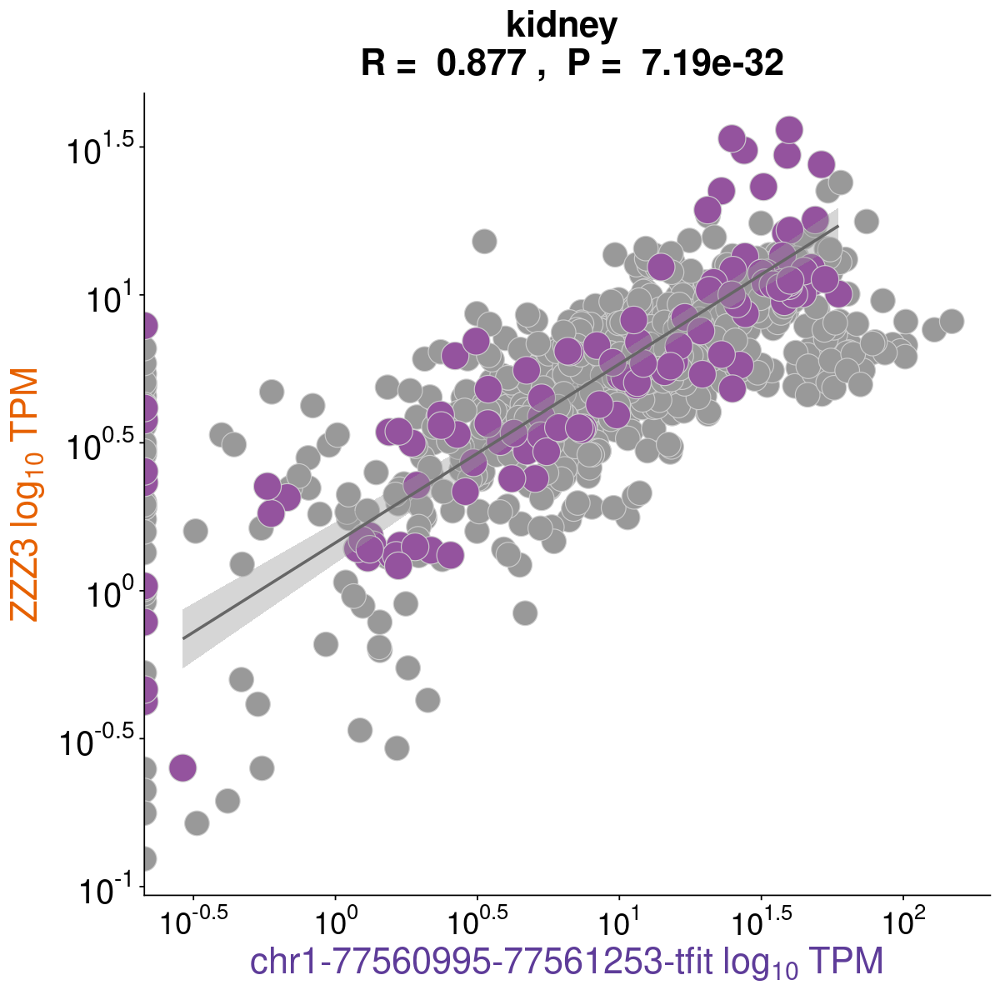

In [76]:
options(repr.plot.width=10, repr.plot.height=10)
zzz3_blood <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'ZZZ3',
                             'chr1-77560995-77561253-tfit', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "kidney")

[1] "ZZZ3"
[1] "chr1-77560995-77561253-tfit"
   transcript_1                transcript_2                          pair_id
1:         ZZZ3 chr1-77560995-77561253-tfit ZZZ3:chr1-77560995-77561253-tfit
         pcc     adj_p_BH        pval       t nObs transcript1_start
1: 0.9226068 5.938145e-16 2.12204e-19 15.6839   45          77562416
   transcript1_end transcript1_biotype transcript2_start transcript2_end
1:        77681908                Gene          77560995        77561253
   transcript2_biotype distance tissue percent_transcribed_both
1:                Tfit    -1421 uterus                    93.75
[1] "Bidir: chr1-77560995-77561253-tfit"
[1] "Gene: ZZZ3"
[1] "Coeff: 0.922606753138929"
[1] "Adj p-val: 5.93814543462225e-16"
               ZZZ3 chr1-77560995-77561253-tfit
SRZ1950491 5.829455                    6.735064
SRZ1950493 8.314578                   16.465143
SRZ1950495 5.980257                   11.774663
SRZ1950497 6.282368                    7.294732
SRZ1950499 6.340999   

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 3 rows containing non-finite values (stat_smooth).”


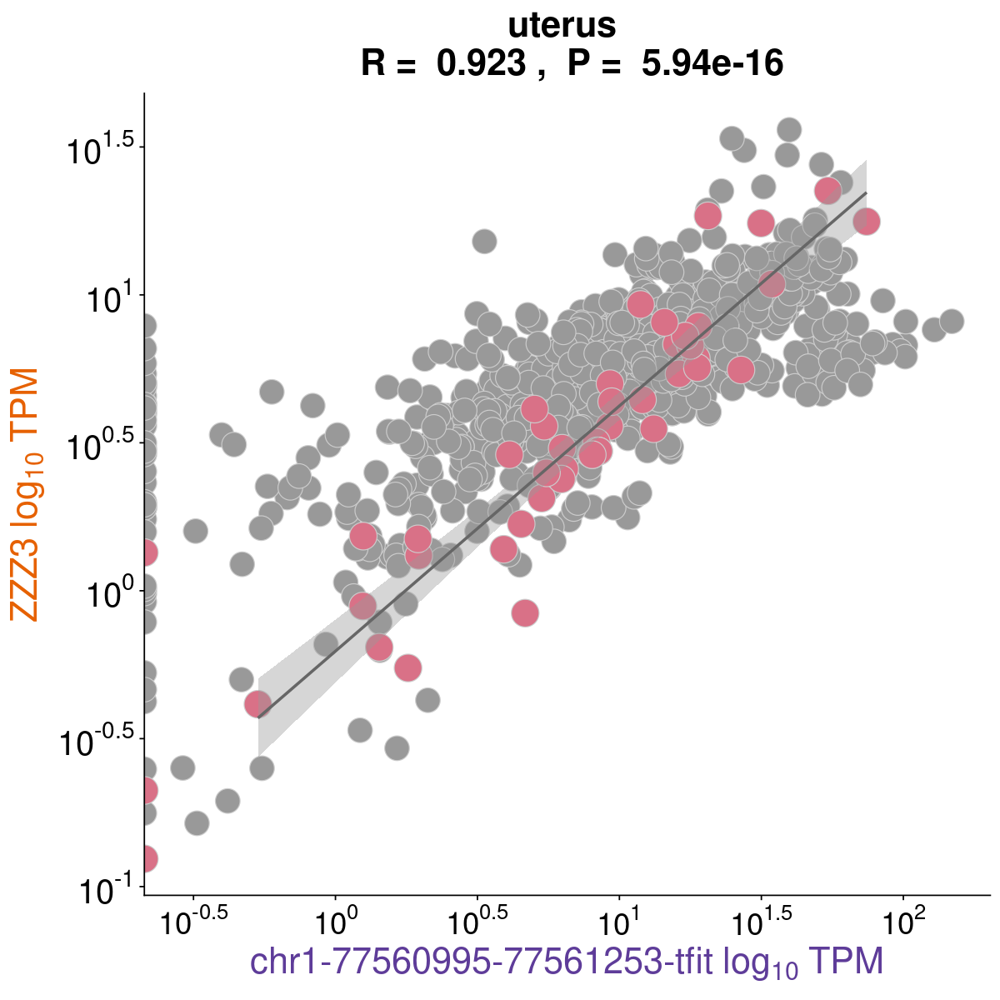

In [77]:
options(repr.plot.width=10, repr.plot.height=10)
zzz3_uterus <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'ZZZ3',
                             'chr1-77560995-77561253-tfit', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "uterus")

[1] "ZZZ3"
[1] "chr1-77560995-77561253-tfit"
   transcript_1                transcript_2                          pair_id
1:         ZZZ3 chr1-77560995-77561253-tfit ZZZ3:chr1-77560995-77561253-tfit
         pcc     adj_p_BH         pval        t nObs transcript1_start
1: 0.8416262 4.766497e-13 2.965906e-15 11.12915   53          77562416
   transcript1_end transcript1_biotype transcript2_start transcript2_end
1:        77681908                Gene          77560995        77561253
   transcript2_biotype distance   tissue percent_transcribed_both
1:                Tfit    -1421 prostate                 96.36364
[1] "Bidir: chr1-77560995-77561253-tfit"
[1] "Gene: ZZZ3"
[1] "Coeff: 0.841626185015193"
[1] "Adj p-val: 4.7664968404633e-13"
               ZZZ3 chr1-77560995-77561253-tfit
SRZ1950491 5.829455                    6.735064
SRZ1950493 8.314578                   16.465143
SRZ1950495 5.980257                   11.774663
SRZ1950497 6.282368                    7.294732
SRZ1950499 6.34

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 2 rows containing non-finite values (stat_smooth).”


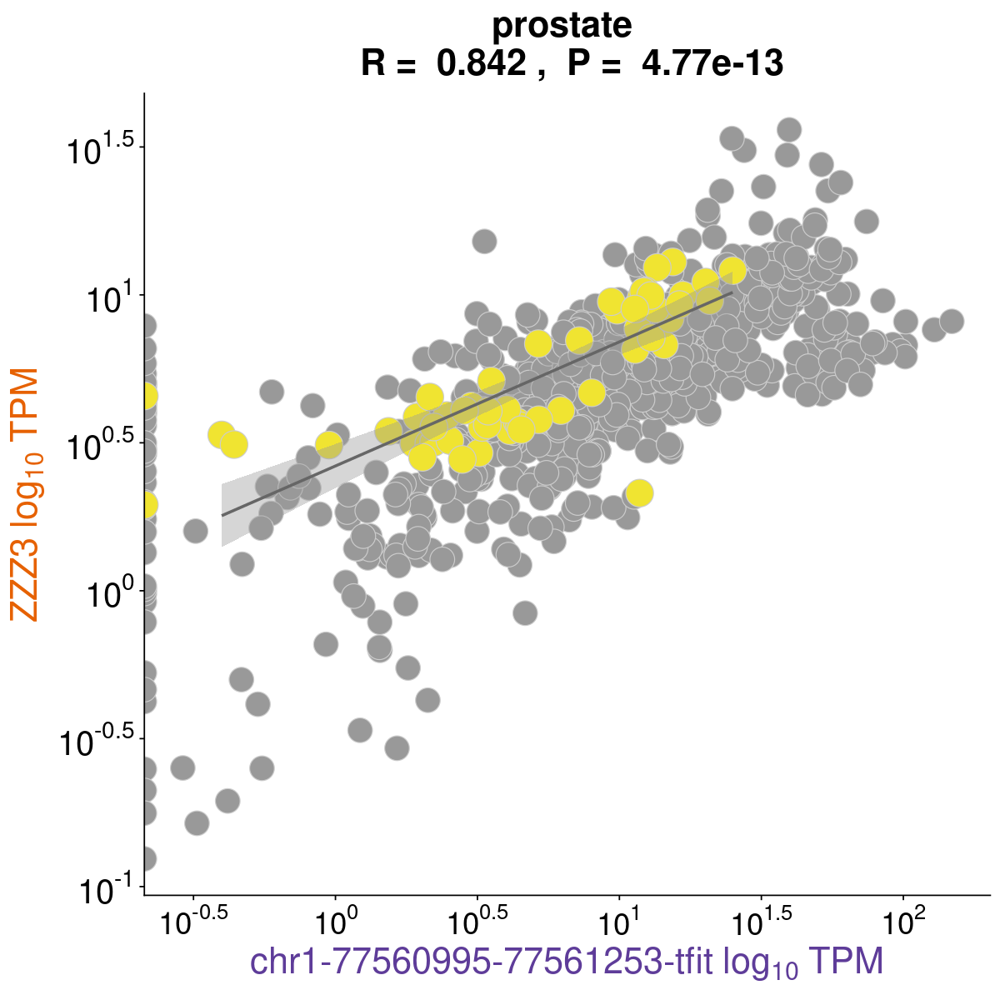

In [78]:
options(repr.plot.width=10, repr.plot.height=10)
zzz3_prostate <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'ZZZ3',
                             'chr1-77560995-77561253-tfit', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "prostate")

## Plot pair for LOC101927851 : Tissue only

In [79]:

subset(sig_pairs_path_DT_0.8, pair_id =='LOC101927851:chr1-234980647-234981157-tfit,dreg')

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
LOC101927851,"chr1-234980647-234981157-tfit,dreg","LOC101927851:chr1-234980647-234981157-tfit,dreg",0.8403954,3.570089e-44,1.99753e-48,20.51278,177,234957343,234963249,Gene,234980647,234981157,Tfit & dREG,23304,blood,76.95652


[1] "LOC101927851"
[1] "chr1-234980647-234981157-tfit,dreg"
   transcript_1                       transcript_2
1: LOC101927851 chr1-234980647-234981157-tfit,dreg
                                           pair_id       pcc     adj_p_BH
1: LOC101927851:chr1-234980647-234981157-tfit,dreg 0.8403954 3.570089e-44
          pval        t nObs transcript1_start transcript1_end
1: 1.99753e-48 20.51278  177         234957343       234963249
   transcript1_biotype transcript2_start transcript2_end transcript2_biotype
1:                Gene         234980647       234981157         Tfit & dREG
   distance tissue percent_transcribed_both
1:    23304  blood                 76.95652
[1] "Bidir: chr1-234980647-234981157-tfit,dreg"
[1] "Gene: LOC101927851"
[1] "Coeff: 0.840395429664297"
[1] "Adj p-val: 3.57008881980075e-44"
           LOC101927851 chr1-234980647-234981157-tfit,dreg
SRZ1950491     1.691462                           31.94203
SRZ1950493     1.438296                           26.94814
SRZ

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 53 rows containing non-finite values (stat_smooth).”


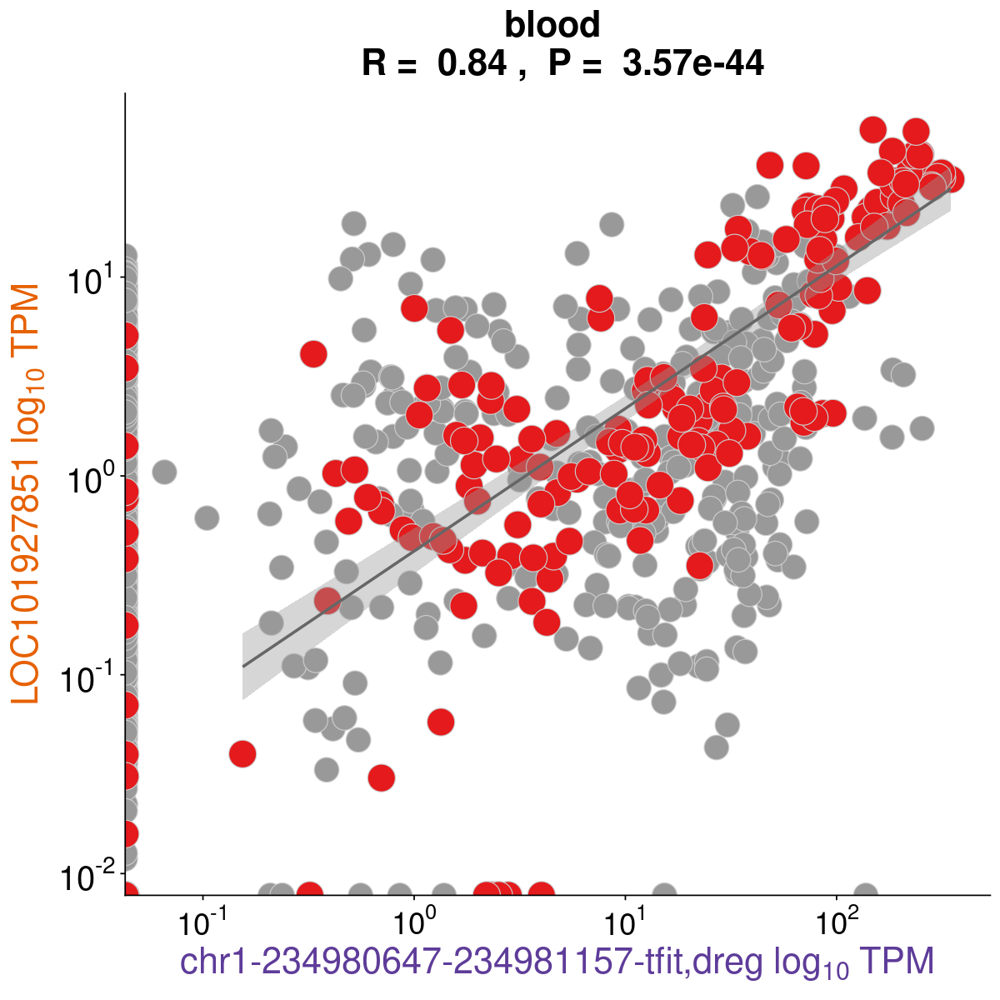

In [80]:
options(repr.plot.width=10, repr.plot.height=10)
LOC101927851_blood <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'LOC101927851',
                             'chr1-234980647-234981157-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "blood")

## Plot pair from PRKY : Tissue only

In [81]:

subset(sig_pairs_path_DT_0.8, pair_id =='PRKY:chrY-7457640-7458831-tfit,dreg')

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
PRKY,"chrY-7457640-7458831-tfit,dreg","PRKY:chrY-7457640-7458831-tfit,dreg",0.9306439,3.099377e-07,2.736999e-09,10.79012,20,7274722,7381547,Gene,7457640,7458831,Tfit & dREG,182918,umbilical cord,100


[1] "PRKY"
[1] "chrY-7457640-7458831-tfit,dreg"
   transcript_1                   transcript_2
1:         PRKY chrY-7457640-7458831-tfit,dreg
                               pair_id       pcc     adj_p_BH         pval
1: PRKY:chrY-7457640-7458831-tfit,dreg 0.9306439 3.099377e-07 2.736999e-09
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 10.79012   20           7274722         7381547                Gene
   transcript2_start transcript2_end transcript2_biotype distance
1:           7457640         7458831         Tfit & dREG   182918
           tissue percent_transcribed_both
1: umbilical cord                      100
[1] "Bidir: chrY-7457640-7458831-tfit,dreg"
[1] "Gene: PRKY"
[1] "Coeff: 0.930643852509857"
[1] "Adj p-val: 3.09937715417368e-07"
               PRKY chrY-7457640-7458831-tfit,dreg
SRZ1950491 3.826609                      0.0000000
SRZ1950493 4.580069                      0.6294276
SRZ1950495 6.455310                      0.0000000
SRZ1950497 7.5

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”


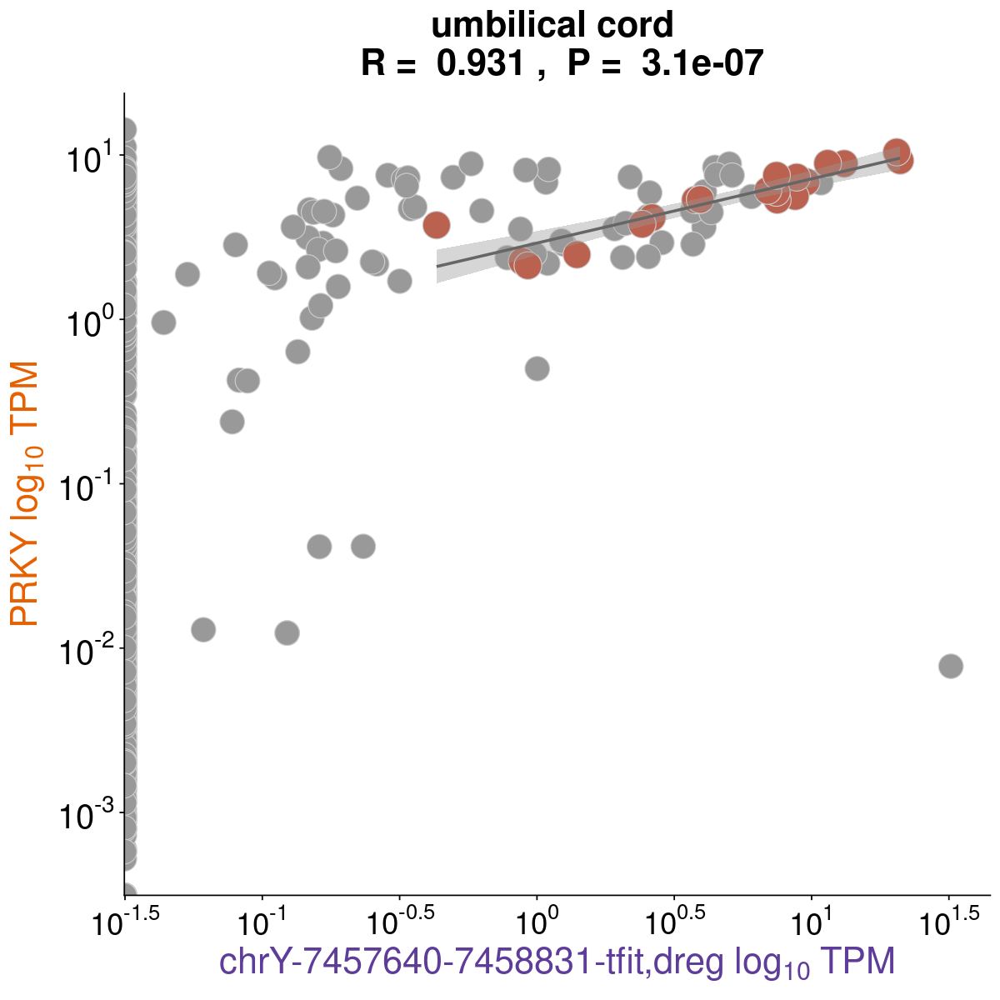

In [82]:
options(repr.plot.width=10, repr.plot.height=10)
PRKY_umbilical_cord <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'PRKY',
                             'chrY-7457640-7458831-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "umbilical cord")

## Plot pair from ZSWIM5 : All only

[1] "ZSWIM5"
[1] "chr1-45207903-45208533-tfit"
   transcript_1                transcript_2                            pair_id
1:       ZSWIM5 chr1-45207903-45208533-tfit ZSWIM5:chr1-45207903-45208533-tfit
        pcc     adj_p_BH         pval        t nObs transcript1_start
1: 0.619423 2.381999e-60 9.563919e-63 18.96923  580          45016399
   transcript1_end transcript1_biotype transcript2_start transcript2_end
1:        45205855                Gene          45207903        45208533
   transcript2_biotype distance      tissue percent_transcribed_both
1:                Tfit   191504 All_samples                 65.90909
[1] "Bidir: chr1-45207903-45208533-tfit"
[1] "Gene: ZSWIM5"
[1] "Coeff: 0.619422967079321"
[1] "Adj p-val: 2.38199912217499e-60"
              ZSWIM5 chr1-45207903-45208533-tfit
SRZ1950491 0.5113234                   1.0343134
SRZ1950493 0.6555141                   1.1899179
SRZ1950495 0.4415676                   0.0000000
SRZ1950497 0.5674722                   0.37342

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 300 rows containing non-finite values (stat_smooth).”


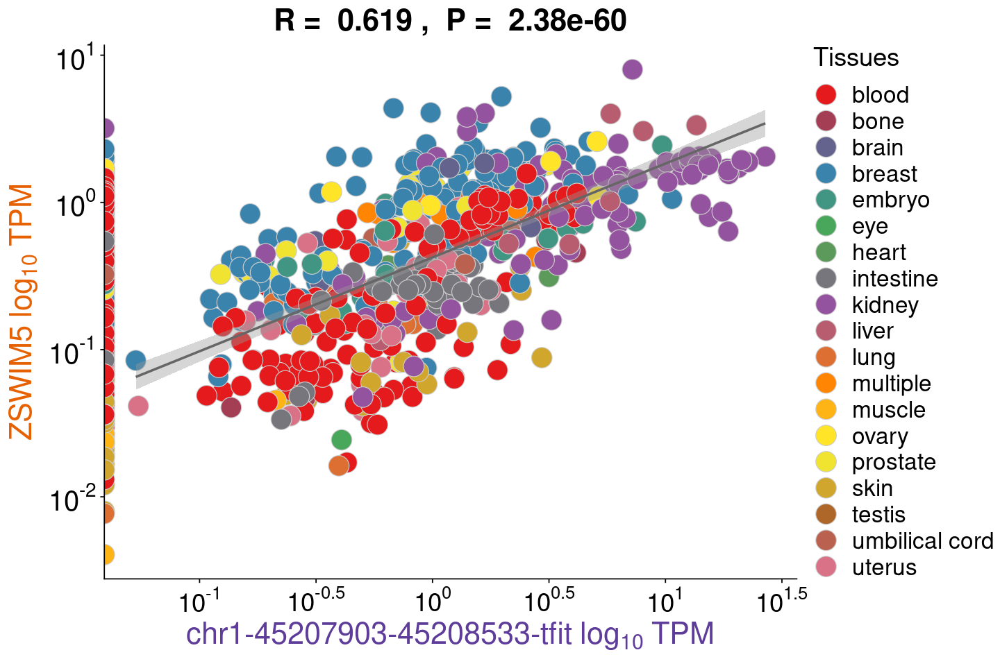

In [83]:
ZSWIM5_all <- plot_transcript_pairs_txptID(gn_bdr_tpm_updated_df_trunc, sig_pairs_all_path_DT, 
                                  880, "ZSWIM5", "chr1-45207903-45208533-tfit",
                                 metadata_celltype_counted, mycolors)

## Plot pair from EIF1AY : All only

[1] "EIF1AY"
[1] "chrY-21180643-21184457-tfit,dreg"
   transcript_1                     transcript_2
1:       EIF1AY chrY-21180643-21184457-tfit,dreg
                                   pair_id      pcc    adj_p_BH         pval
1: EIF1AY:chrY-21180643-21184457-tfit,dreg 0.657575 3.77089e-16 6.150807e-19
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 10.32738  142          20576461        20593154                Gene
   transcript2_start transcript2_end transcript2_biotype distance      tissue
1:          21180643        21184457         Tfit & dREG   604182 All_samples
   percent_transcribed_both
1:                 16.13636
[1] "Bidir: chrY-21180643-21184457-tfit,dreg"
[1] "Gene: EIF1AY"
[1] "Coeff: 0.657575022952647"
[1] "Adj p-val: 3.77088991702802e-16"
              EIF1AY chrY-21180643-21184457-tfit,dreg
SRZ1950491 1.4182001                       0.11389922
SRZ1950493 2.0207363                       0.00000000
SRZ1950495 0.8538749                       0.0

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 738 rows containing non-finite values (stat_smooth).”


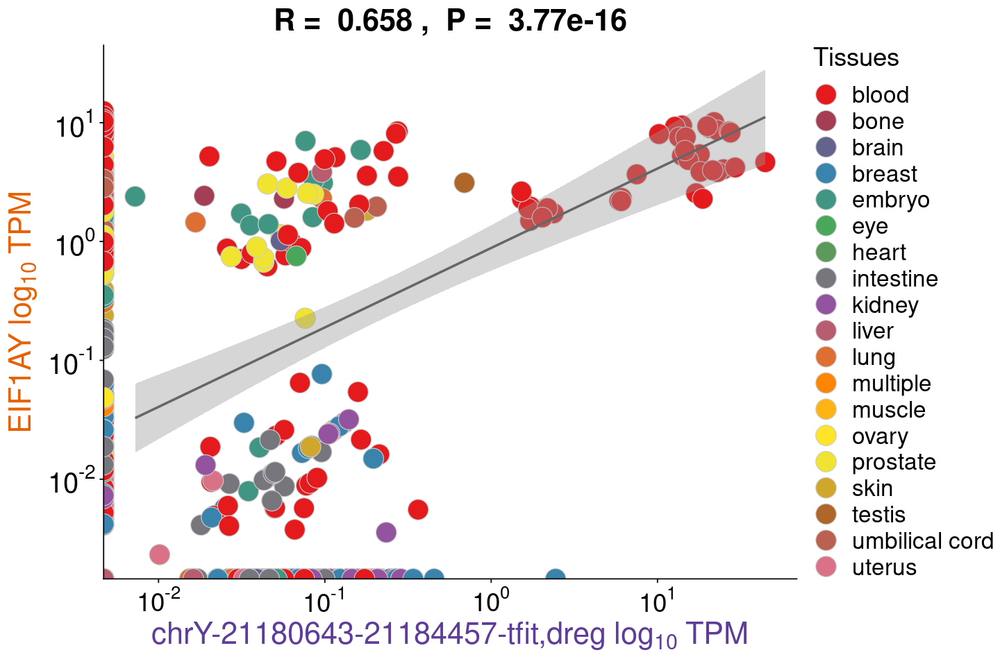

In [84]:
EIF1AY_all <- plot_transcript_pairs_txptID(gn_bdr_tpm_updated_df_trunc, sig_pairs_all_path_DT, 
                                  880, "EIF1AY", "chrY-21180643-21184457-tfit,dreg",
                                 metadata_celltype_counted, mycolors)

## Plot pair from TTTY14 : All only

[1] "TTTY14"
[1] "chrY-19378670-19379303-tfit,dreg"
   transcript_1                     transcript_2
1:       TTTY14 chrY-19378670-19379303-tfit,dreg
                                   pair_id       pcc     adj_p_BH         pval
1: TTTY14:chrY-19378670-19379303-tfit,dreg 0.6350354 1.121918e-33 7.430984e-37
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 14.52066  314          18932451        19075253                Gene
   transcript2_start transcript2_end transcript2_biotype distance      tissue
1:          19378670        19379303         Tfit & dREG   446219 All_samples
   percent_transcribed_both
1:                 35.68182
[1] "Bidir: chrY-19378670-19379303-tfit,dreg"
[1] "Gene: TTTY14"
[1] "Coeff: 0.635035399575059"
[1] "Adj p-val: 1.12191750187733e-33"
              TTTY14 chrY-19378670-19379303-tfit,dreg
SRZ1950491 1.2670072                                0
SRZ1950493 1.5888570                                0
SRZ1950495 0.5972833                      

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 566 rows containing non-finite values (stat_smooth).”


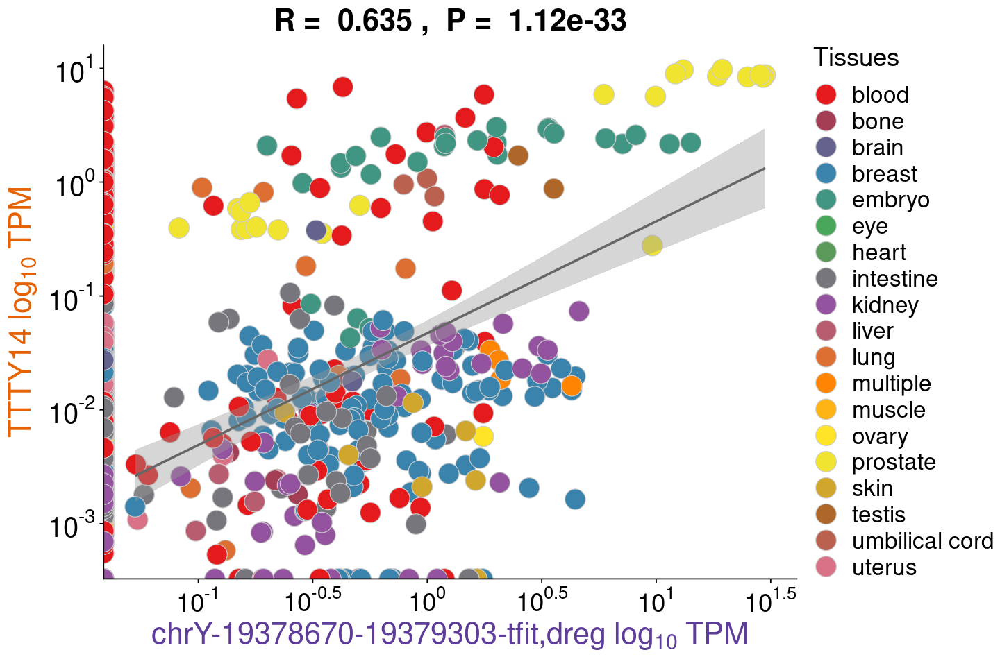

In [85]:
TTTY14_all <- plot_transcript_pairs_txptID(gn_bdr_tpm_updated_df_trunc, sig_pairs_all_path_DT, 
                                  880, "TTTY14", "chrY-19378670-19379303-tfit,dreg",
                                 metadata_celltype_counted, mycolors)

## Plot pair from ZNF684 : All only

[1] "ZNF684"
[1] "chr1-40549759-40550157-tfit"
   transcript_1                transcript_2                            pair_id
1:       ZNF684 chr1-40549759-40550157-tfit ZNF684:chr1-40549759-40550157-tfit
        pcc      adj_p_BH          pval        t nObs transcript1_start
1: 0.783881 7.172858e-163 1.669649e-166 35.57386  796          40532387
   transcript1_end transcript1_biotype transcript2_start transcript2_end
1:        40548166                Gene          40549759        40550157
   transcript2_biotype distance      tissue percent_transcribed_both
1:                Tfit    17372 All_samples                 90.45455
[1] "Bidir: chr1-40549759-40550157-tfit"
[1] "Gene: ZNF684"
[1] "Coeff: 0.783881044752634"
[1] "Adj p-val: 7.17285752604618e-163"
             ZNF684 chr1-40549759-40550157-tfit
SRZ1950491 2.890572                    4.911689
SRZ1950493 3.578803                    8.162000
SRZ1950495 2.665572                    2.348561
SRZ1950497 2.385350                    1.7732

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 84 rows containing non-finite values (stat_smooth).”


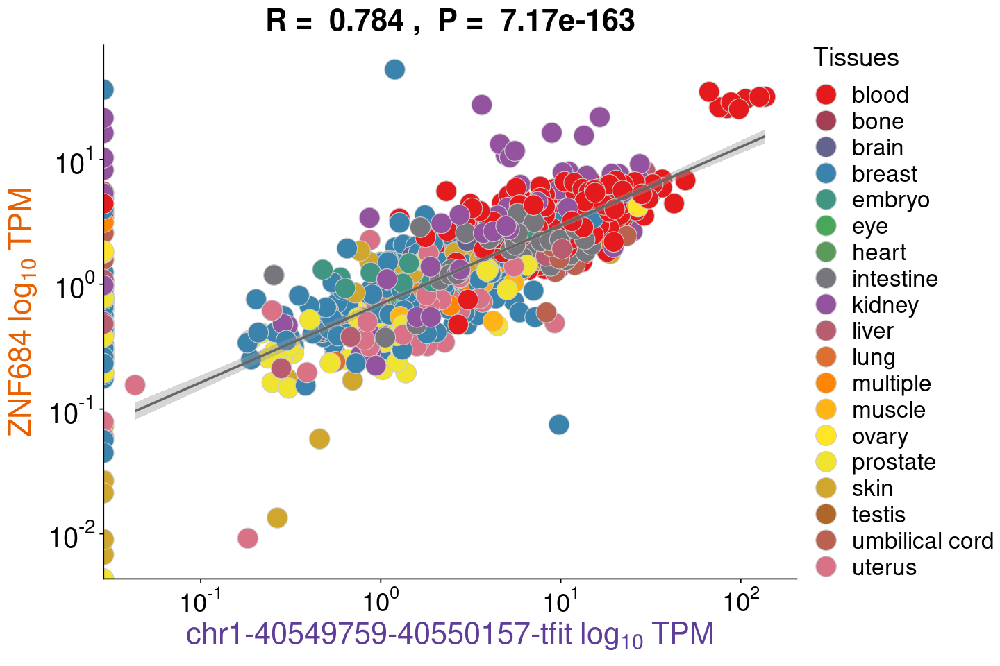

In [86]:
ZNF684_all <- plot_transcript_pairs_txptID(gn_bdr_tpm_updated_df_trunc, sig_pairs_all_path_DT, 
                                  880, "ZNF684", "chr1-40549759-40550157-tfit",
                                 metadata_celltype_counted, mycolors)

In [87]:
subset(sig_pairs_all_path_DT, transcript_1 == "ZNF684")

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
ZNF684,"chr1-39714750-39714980-tfit,dreg","ZNF684:chr1-39714750-39714980-tfit,dreg",0.6288204,9.242826e-06,7.755485e-07,5.661037,51,40532387,40548166,Gene,39714750,39714980,Tfit & dREG,-817637,All_samples,5.795455
ZNF684,"chr1-39907211-39908283-tfit,dreg","ZNF684:chr1-39907211-39908283-tfit,dreg",0.6492491,2.627697e-19,5.316528e-21,10.864915,164,40532387,40548166,Gene,39907211,39908283,Tfit & dREG,-625176,All_samples,18.636364
ZNF684,"chr1-39927480-39927906-tfit,dreg","ZNF684:chr1-39927480-39927906-tfit,dreg",0.7490404,1.611655e-16,3.902901e-18,10.844194,94,40532387,40548166,Gene,39927480,39927906,Tfit & dREG,-604907,All_samples,10.681818
ZNF684,"chr1-39928930-39930210-tfit,dreg","ZNF684:chr1-39928930-39930210-tfit,dreg",0.6281200,3.128847e-16,7.732158e-18,9.820393,150,40532387,40548166,Gene,39928930,39930210,Tfit & dREG,-603457,All_samples,17.045455
ZNF684,"chr1-39950883-39951603-tfit,dreg","ZNF684:chr1-39950883-39951603-tfit,dreg",0.6164665,2.003115e-41,1.508809e-43,15.678217,403,40532387,40548166,Gene,39950883,39951603,Tfit & dREG,-581504,All_samples,45.795455
ZNF684,"chr1-40339902-40340302-tfit,dreg","ZNF684:chr1-40339902-40340302-tfit,dreg",0.7119655,1.366929e-20,2.564538e-22,11.736582,136,40532387,40548166,Gene,40339902,40340302,Tfit & dREG,-192485,All_samples,15.454545
ZNF684,"chr1-40352228-40352460-tfit,dreg","ZNF684:chr1-40352228-40352460-tfit,dreg",0.8446459,8.746518e-16,2.231791e-17,12.016301,60,40532387,40548166,Gene,40352228,40352460,Tfit & dREG,-180159,All_samples,6.818182
ZNF684,"chr1-40356576-40356798-tfit,dreg","ZNF684:chr1-40356576-40356798-tfit,dreg",0.6636348,5.700516e-18,1.253295e-19,10.571553,144,40532387,40548166,Gene,40356576,40356798,Tfit & dREG,-175811,All_samples,16.363636
ZNF684,"chr1-40436853-40437947-tfit,dreg","ZNF684:chr1-40436853-40437947-tfit,dreg",0.6336468,2.388707e-77,5.736070e-80,21.654927,701,40532387,40548166,Gene,40436853,40437947,Tfit & dREG,-95534,All_samples,79.659091


## FOS pairs

### All samples

In [88]:
subset(sig_pairs_all_path_DT, transcript_1 == 'FOS')

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
FOS,"chr14-75284022-75284278-tfit,dreg","FOS:chr14-75284022-75284278-tfit,dreg",0.7533582,8.612060e-100,9.760336e-103,26.93986,555,75279578,75282230,Gene,75284022,75284278,Tfit & dREG,4444,All_samples,63.06818
FOS,chr14-75282939-75283171-dreg,FOS:chr14-75282939-75283171-dreg,0.8747806,1.841691e-221,1.273352e-225,48.10799,712,75279578,75282230,Gene,75282939,75283171,dREG,3361,All_samples,80.90909


[1] "FOS"
[1] "chr14-75284022-75284278-tfit,dreg"
   transcript_1                      transcript_2
1:          FOS chr14-75284022-75284278-tfit,dreg
                                 pair_id       pcc     adj_p_BH          pval
1: FOS:chr14-75284022-75284278-tfit,dreg 0.7533582 8.61206e-100 9.760336e-103
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 26.93986  555          75279578        75282230                Gene
   transcript2_start transcript2_end transcript2_biotype distance      tissue
1:          75284022        75284278         Tfit & dREG     4444 All_samples
   percent_transcribed_both
1:                 63.06818
[1] "Bidir: chr14-75284022-75284278-tfit,dreg"
[1] "Gene: FOS"
[1] "Coeff: 0.753358181894853"
[1] "Adj p-val: 8.61206016679274e-100"
                 FOS chr14-75284022-75284278-tfit,dreg
SRZ1950491 0.2456153                         0.8484602
SRZ1950493 0.1883775                         0.9761045
SRZ1950495 0.6165746                      

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 325 rows containing non-finite values (stat_smooth).”


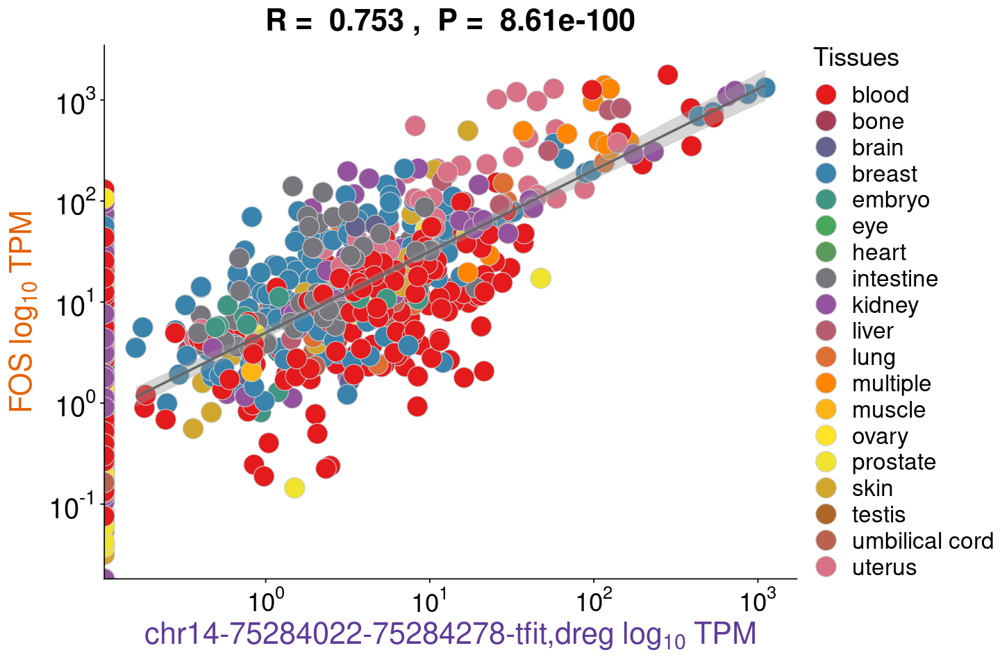

In [89]:
fos_all_1 <- plot_transcript_pairs_txptID(gn_bdr_tpm_updated_df_trunc, sig_pairs_all_path_DT, 
                                  880, "FOS", "chr14-75284022-75284278-tfit,dreg",
                                 metadata_celltype_counted, mycolors)

[1] "FOS"
[1] "chr14-75282939-75283171-dreg"
   transcript_1                 transcript_2                          pair_id
1:          FOS chr14-75282939-75283171-dreg FOS:chr14-75282939-75283171-dreg
         pcc      adj_p_BH          pval        t nObs transcript1_start
1: 0.8747806 1.841691e-221 1.273352e-225 48.10799  712          75279578
   transcript1_end transcript1_biotype transcript2_start transcript2_end
1:        75282230                Gene          75282939        75283171
   transcript2_biotype distance      tissue percent_transcribed_both
1:                dREG     3361 All_samples                 80.90909
[1] "Bidir: chr14-75282939-75283171-dreg"
[1] "Gene: FOS"
[1] "Coeff: 0.874780563598599"
[1] "Adj p-val: 1.84169093557661e-221"
                 FOS chr14-75282939-75283171-dreg
SRZ1950491 0.2456153                     0.000000
SRZ1950493 0.1883775                     0.000000
SRZ1950495 0.6165746                     0.000000
SRZ1950497 0.2660254                     

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 168 rows containing non-finite values (stat_smooth).”


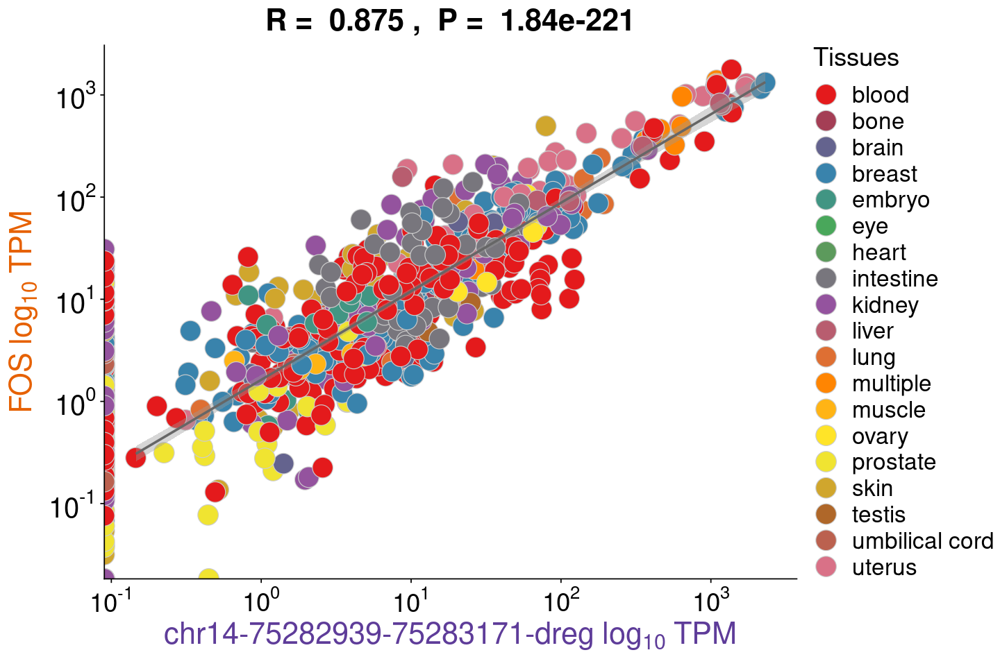

In [90]:
fos_all_2 <- plot_transcript_pairs_txptID(gn_bdr_tpm_updated_df_trunc, sig_pairs_all_path_DT, 
                                  880, "FOS", "chr14-75282939-75283171-dreg",
                                 metadata_celltype_counted, mycolors)

### Tissues

In [91]:
subset(sig_pairs_path_DT_0.8, transcript_1 == 'FOS')

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
FOS,chr14-75282939-75283171-dreg,FOS:chr14-75282939-75283171-dreg,0.8126215,4.483190e-43,3.905403e-47,19.371066,195,75279578,75282230,Gene,75282939,75283171,dREG,3361,blood,84.78261
FOS,chr14-75282939-75283171-dreg,FOS:chr14-75282939-75283171-dreg,0.9157114,2.703602e-76,6.161915e-80,31.984702,199,75279578,75282230,Gene,75282939,75283171,dREG,3361,breast,91.28440
FOS,"chr14-75258648-75259757-tfit,dreg","FOS:chr14-75258648-75259757-tfit,dreg",0.8350425,5.589709e-10,3.371160e-12,9.718326,43,75279578,75282230,Gene,75258648,75259757,Tfit & dREG,-20930,skin,97.72727
FOS,"chr14-75276931-75277533-tfit,dreg","FOS:chr14-75276931-75277533-tfit,dreg",0.8172808,3.163939e-09,2.292793e-11,9.081554,43,75279578,75282230,Gene,75276931,75277533,Tfit & dREG,-2647,skin,97.72727
FOS,chr14-75282939-75283171-dreg,FOS:chr14-75282939-75283171-dreg,0.9105191,3.781386e-15,1.737533e-18,14.607450,46,75279578,75282230,Gene,75282939,75283171,dREG,3361,uterus,95.83333


[1] "FOS"
[1] "chr14-75258648-75259757-tfit,dreg"
   transcript_1                      transcript_2
1:          FOS chr14-75258648-75259757-tfit,dreg
                                 pair_id       pcc     adj_p_BH        pval
1: FOS:chr14-75258648-75259757-tfit,dreg 0.8350425 5.589709e-10 3.37116e-12
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 9.718326   43          75279578        75282230                Gene
   transcript2_start transcript2_end transcript2_biotype distance tissue
1:          75258648        75259757         Tfit & dREG   -20930   skin
   percent_transcribed_both
1:                 97.72727
[1] "Bidir: chr14-75258648-75259757-tfit,dreg"
[1] "Gene: FOS"
[1] "Coeff: 0.835042522807596"
[1] "Adj p-val: 5.58970901969021e-10"
                 FOS chr14-75258648-75259757-tfit,dreg
SRZ1950491 0.2456153                          5.875721
SRZ1950493 0.1883775                          4.055807
SRZ1950495 0.6165746                          4.635707
SR

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 1 rows containing non-finite values (stat_smooth).”


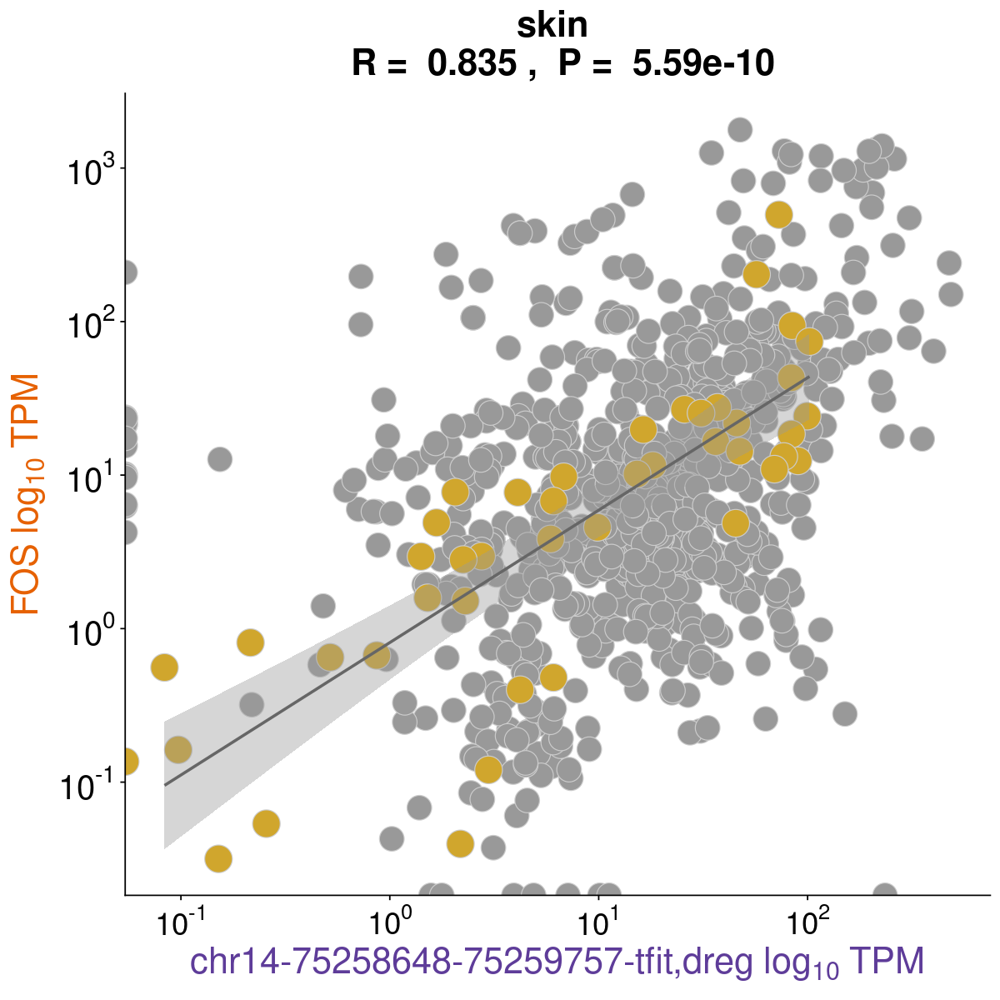

In [92]:
options(repr.plot.width=10, repr.plot.height=10)
fos_1_skin <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'FOS',
                             'chr14-75258648-75259757-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "skin")

[1] "FOS"
[1] "chr14-75282939-75283171-dreg"
   transcript_1                 transcript_2                          pair_id
1:          FOS chr14-75282939-75283171-dreg FOS:chr14-75282939-75283171-dreg
         pcc    adj_p_BH         pval        t nObs transcript1_start
1: 0.8126215 4.48319e-43 3.905403e-47 19.37107  195          75279578
   transcript1_end transcript1_biotype transcript2_start transcript2_end
1:        75282230                Gene          75282939        75283171
   transcript2_biotype distance tissue percent_transcribed_both
1:                dREG     3361  blood                 84.78261
[1] "Bidir: chr14-75282939-75283171-dreg"
[1] "Gene: FOS"
[1] "Coeff: 0.812621504734811"
[1] "Adj p-val: 4.48318964811893e-43"
                 FOS chr14-75282939-75283171-dreg
SRZ1950491 0.2456153                     0.000000
SRZ1950493 0.1883775                     0.000000
SRZ1950495 0.6165746                     0.000000
SRZ1950497 0.2660254                     0.000000
SRZ19504

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 35 rows containing non-finite values (stat_smooth).”


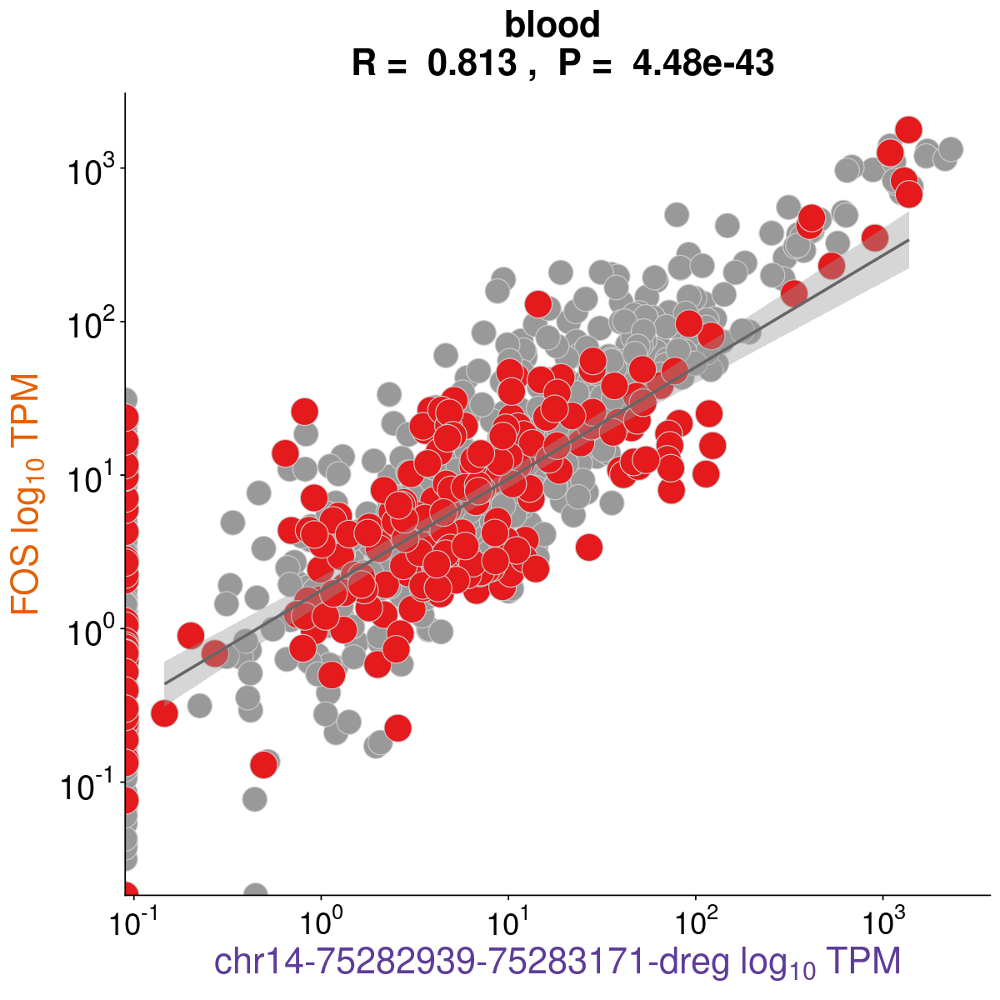

In [93]:
options(repr.plot.width=10, repr.plot.height=10)
fos_2_blood <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'FOS',
                             'chr14-75282939-75283171-dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "blood")

[1] "FOS"
[1] "chr14-75282939-75283171-dreg"
   transcript_1                 transcript_2                          pair_id
1:          FOS chr14-75282939-75283171-dreg FOS:chr14-75282939-75283171-dreg
         pcc     adj_p_BH         pval       t nObs transcript1_start
1: 0.9157114 2.703602e-76 6.161915e-80 31.9847  199          75279578
   transcript1_end transcript1_biotype transcript2_start transcript2_end
1:        75282230                Gene          75282939        75283171
   transcript2_biotype distance tissue percent_transcribed_both
1:                dREG     3361 breast                  91.2844
[1] "Bidir: chr14-75282939-75283171-dreg"
[1] "Gene: FOS"
[1] "Coeff: 0.915711412897179"
[1] "Adj p-val: 2.70360239735988e-76"
                 FOS chr14-75282939-75283171-dreg
SRZ1950491 0.2456153                     0.000000
SRZ1950493 0.1883775                     0.000000
SRZ1950495 0.6165746                     0.000000
SRZ1950497 0.2660254                     0.000000
SRZ19504

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 19 rows containing non-finite values (stat_smooth).”


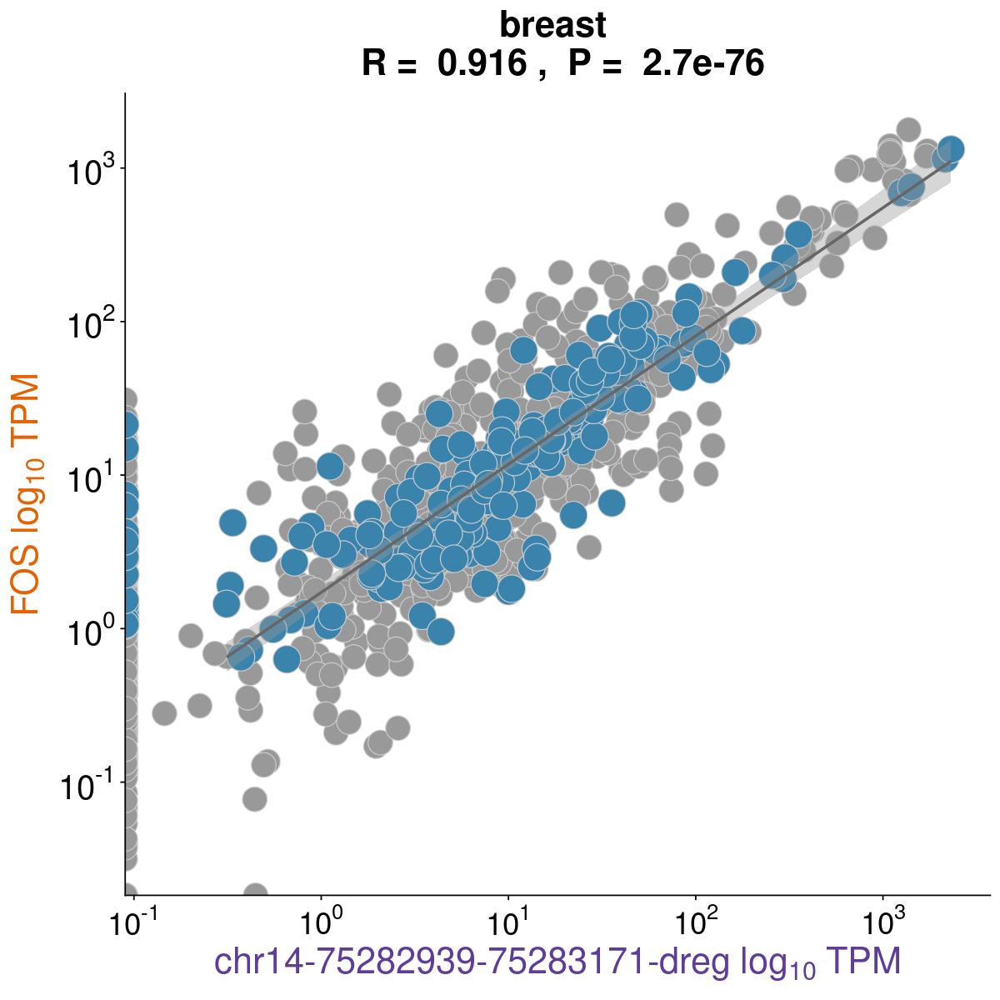

In [94]:
options(repr.plot.width=10, repr.plot.height=10)
fos_2_breast <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'FOS',
                             'chr14-75282939-75283171-dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "breast")

[1] "FOS"
[1] "chr14-75276931-75277533-tfit,dreg"
   transcript_1                      transcript_2
1:          FOS chr14-75276931-75277533-tfit,dreg
                                 pair_id       pcc     adj_p_BH         pval
1: FOS:chr14-75276931-75277533-tfit,dreg 0.8172808 3.163939e-09 2.292793e-11
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 9.081554   43          75279578        75282230                Gene
   transcript2_start transcript2_end transcript2_biotype distance tissue
1:          75276931        75277533         Tfit & dREG    -2647   skin
   percent_transcribed_both
1:                 97.72727
[1] "Bidir: chr14-75276931-75277533-tfit,dreg"
[1] "Gene: FOS"
[1] "Coeff: 0.817280834881499"
[1] "Adj p-val: 3.16393909923328e-09"
                 FOS chr14-75276931-75277533-tfit,dreg
SRZ1950491 0.2456153                         3.2472629
SRZ1950493 0.1883775                         0.8301753
SRZ1950495 0.6165746                         1.1645271


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 1 rows containing non-finite values (stat_smooth).”


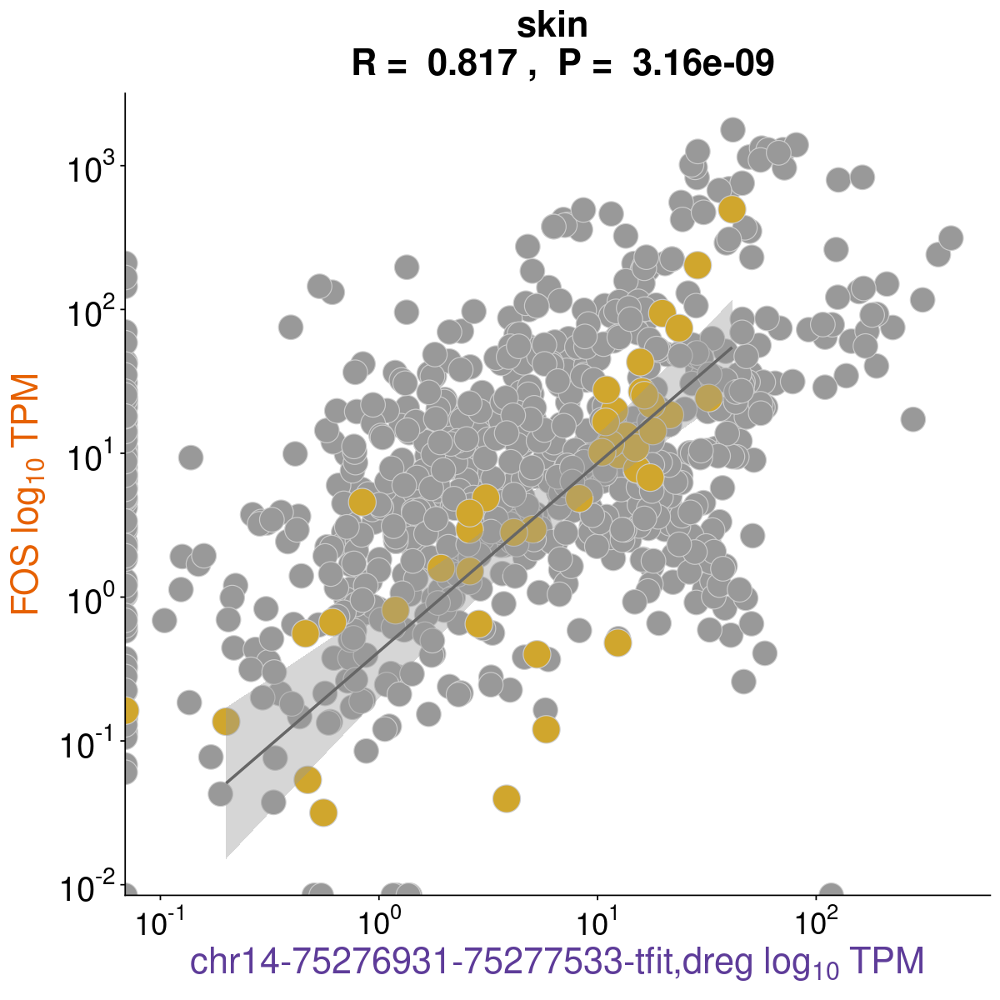

In [95]:
options(repr.plot.width=10, repr.plot.height=10)
fos_2_skin <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'FOS',
                             'chr14-75276931-75277533-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "skin")

[1] "FOS"
[1] "chr14-75282939-75283171-dreg"
   transcript_1                 transcript_2                          pair_id
1:          FOS chr14-75282939-75283171-dreg FOS:chr14-75282939-75283171-dreg
         pcc     adj_p_BH         pval        t nObs transcript1_start
1: 0.9105191 3.781386e-15 1.737533e-18 14.60745   46          75279578
   transcript1_end transcript1_biotype transcript2_start transcript2_end
1:        75282230                Gene          75282939        75283171
   transcript2_biotype distance tissue percent_transcribed_both
1:                dREG     3361 uterus                 95.83333
[1] "Bidir: chr14-75282939-75283171-dreg"
[1] "Gene: FOS"
[1] "Coeff: 0.910519058948601"
[1] "Adj p-val: 3.78138624248845e-15"
                 FOS chr14-75282939-75283171-dreg
SRZ1950491 0.2456153                     0.000000
SRZ1950493 0.1883775                     0.000000
SRZ1950495 0.6165746                     0.000000
SRZ1950497 0.2660254                     0.000000
SRZ195

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 2 rows containing non-finite values (stat_smooth).”


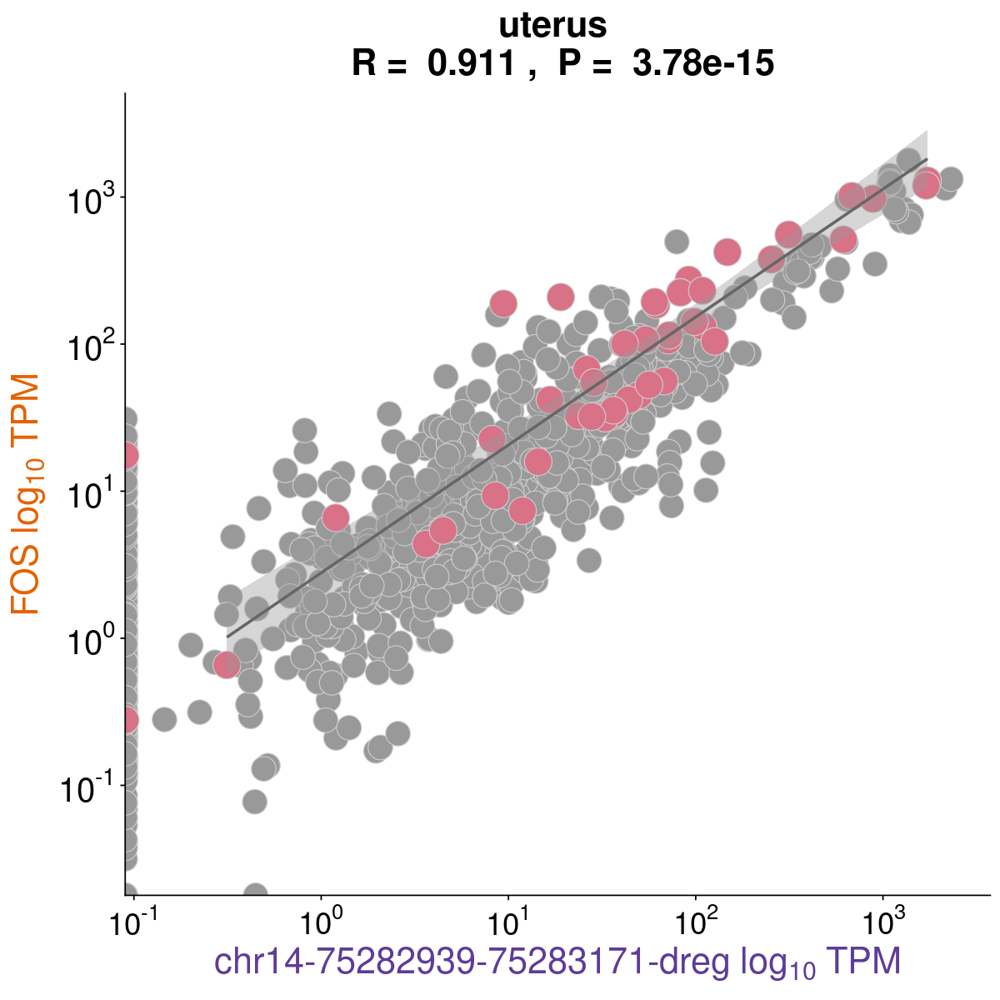

In [96]:
options(repr.plot.width=10, repr.plot.height=10)
fos_2_uterus <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'FOS',
                             'chr14-75282939-75283171-dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "uterus")

## RUNX1 pairs

### All samples

In [101]:
subset(sig_pairs_all_path_DT_0.8, transcript_1 == 'RUNX1')

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
RUNX1,chr21-34786931-34787369-dreg,RUNX1:chr21-34786931-34787369-dreg,0.8303743,4.794108e-194,5.210648e-198,41.37951,773,34821279,34887949,Gene,34786931,34787369,dREG,-34348,All_samples,87.84091


### Tissues

In [100]:
subset(sig_pairs_path_DT_0.8, transcript_1 == 'RUNX1')

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
RUNX1,chr21-34786931-34787369-dreg,RUNX1:chr21-34786931-34787369-dreg,0.8123180,5.567228e-51,2.634475e-55,21.031248,230,34821279,34887949,Gene,34786931,34787369,dREG,-34348,blood,100.00000
RUNX1,chr21-34786931-34787369-dreg,RUNX1:chr21-34786931-34787369-dreg,0.8830612,2.108840e-66,6.012485e-70,27.074745,209,34821279,34887949,Gene,34786931,34787369,dREG,-34348,breast,95.87156
RUNX1,"chr21-33980212-33981798-tfit,dreg","RUNX1:chr21-33980212-33981798-tfit,dreg",0.9169231,1.945102e-09,4.288226e-13,12.373413,31,34821279,34887949,Gene,33980212,33981798,Tfit & dREG,-841067,embryo,100.00000
RUNX1,chr21-33900301-33900659-dreg,RUNX1:chr21-33900301-33900659-dreg,0.8057823,3.003770e-05,7.764418e-08,7.199787,30,34821279,34887949,Gene,33900301,33900659,dREG,-920978,embryo,96.77419
RUNX1,chr21-33973342-33973586-dreg,RUNX1:chr21-33973342-33973586-dreg,0.8283453,1.370619e-05,2.904351e-08,7.683097,29,34821279,34887949,Gene,33973342,33973586,dREG,-847937,embryo,93.54839
RUNX1,chr21-34198777-34199049-dreg,RUNX1:chr21-34198777-34199049-dreg,0.8801840,2.000270e-07,1.458163e-10,9.812842,30,34821279,34887949,Gene,34198777,34199049,dREG,-622502,embryo,96.77419
RUNX1,"chr21-33901242-33902856-tfit,dreg","RUNX1:chr21-33901242-33902856-tfit,dreg",0.8931482,7.667517e-12,9.309298e-15,12.241429,40,34821279,34887949,Gene,33901242,33902856,Tfit & dREG,-920037,skin,90.90909
RUNX1,"chr21-34146515-34149273-tfit,dreg","RUNX1:chr21-34146515-34149273-tfit,dreg",0.8528651,2.184986e-10,3.866180e-13,10.459055,43,34821279,34887949,Gene,34146515,34149273,Tfit & dREG,-674764,skin,97.72727
RUNX1,chr21-34786931-34787369-dreg,RUNX1:chr21-34786931-34787369-dreg,0.9229672,1.088061e-15,5.063382e-19,15.541294,44,34821279,34887949,Gene,34786931,34787369,dREG,-34348,skin,100.00000


## NPEPPS

In [102]:
npepps <- subset(sig_pairs_path_DT_0.8, transcript_1 == 'NPEPPS' & abs(distance) < 150000)
nrow(npepps)
length(unique(npepps$pair_id))
npepps

[1] 23

[1] 8

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
NPEPPS,chr17-47624823-47625337-dreg,NPEPPS:chr17-47624823-47625337-dreg,0.8454232,5.188109e-57,3.304273e-60,23.155855,216,47531858,47623276,Gene,47624823,47625337,dREG,92965,breast,99.08257
NPEPPS,chr17-47624823-47625337-dreg,NPEPPS:chr17-47624823-47625337-dreg,0.8976916,2.098172e-09,7.736386e-12,10.971292,31,47531858,47623276,Gene,47624823,47625337,dREG,92965,embryo,100.00000
NPEPPS,chr17-47626751-47627009-dreg,NPEPPS:chr17-47626751-47627009-dreg,0.8024638,2.967780e-06,5.650226e-08,7.242156,31,47531858,47623276,Gene,47626751,47627009,dREG,94893,embryo,100.00000
NPEPPS,"chr17-47623880-47624200-tfit,dreg","NPEPPS:chr17-47623880-47624200-tfit,dreg",0.8367289,1.184552e-12,1.116988e-14,10.804199,52,47531858,47623276,Gene,47623880,47624200,Tfit & dREG,92022,intestine,100.00000
NPEPPS,chr17-47624823-47625337-dreg,NPEPPS:chr17-47624823-47625337-dreg,0.9324685,9.862416e-21,9.330000e-24,18.251964,52,47531858,47623276,Gene,47624823,47625337,dREG,92965,intestine,100.00000
NPEPPS,chr17-47626751-47627009-dreg,NPEPPS:chr17-47626751-47627009-dreg,0.8340071,1.662580e-12,1.632267e-14,10.688322,52,47531858,47623276,Gene,47626751,47627009,dREG,94893,intestine,100.00000
NPEPPS,chr17-47624823-47625337-dreg,NPEPPS:chr17-47624823-47625337-dreg,0.8884421,9.804159e-04,1.898740e-06,7.496744,17,47531858,47623276,Gene,47624823,47625337,dREG,92965,lung,100.00000
NPEPPS,"chr17-47623880-47624200-tfit,dreg","NPEPPS:chr17-47623880-47624200-tfit,dreg",0.8285964,7.033893e-13,1.045904e-14,10.672736,54,47531858,47623276,Gene,47623880,47624200,Tfit & dREG,92022,prostate,98.18182
NPEPPS,chr17-47443445-47443761-tfit,NPEPPS:chr17-47443445-47443761-tfit,0.9094479,1.822725e-16,9.180605e-19,14.671719,47,47531858,47623276,Gene,47443445,47443761,Tfit,-88413,prostate,85.45455


[1] "NPEPPS"
[1] "chr17-47623880-47624200-tfit,dreg"
   transcript_1                      transcript_2
1:       NPEPPS chr17-47623880-47624200-tfit,dreg
                                    pair_id       pcc     adj_p_BH         pval
1: NPEPPS:chr17-47623880-47624200-tfit,dreg 0.8367289 1.184552e-12 1.116988e-14
         t nObs transcript1_start transcript1_end transcript1_biotype
1: 10.8042   52          47531858        47623276                Gene
   transcript2_start transcript2_end transcript2_biotype distance    tissue
1:          47623880        47624200         Tfit & dREG    92022 intestine
   percent_transcribed_both
1:                      100
[1] "Bidir: chr17-47623880-47624200-tfit,dreg"
[1] "Gene: NPEPPS"
[1] "Coeff: 0.836728903590112"
[1] "Adj p-val: 1.18455204387096e-12"
             NPEPPS chr17-47623880-47624200-tfit,dreg
SRZ1950491 3.304929                          4.751377
SRZ1950493 4.515542                          6.247069
SRZ1950495 2.257091                       

Warning message:
“Transformation introduced infinite values in continuous x-axis”


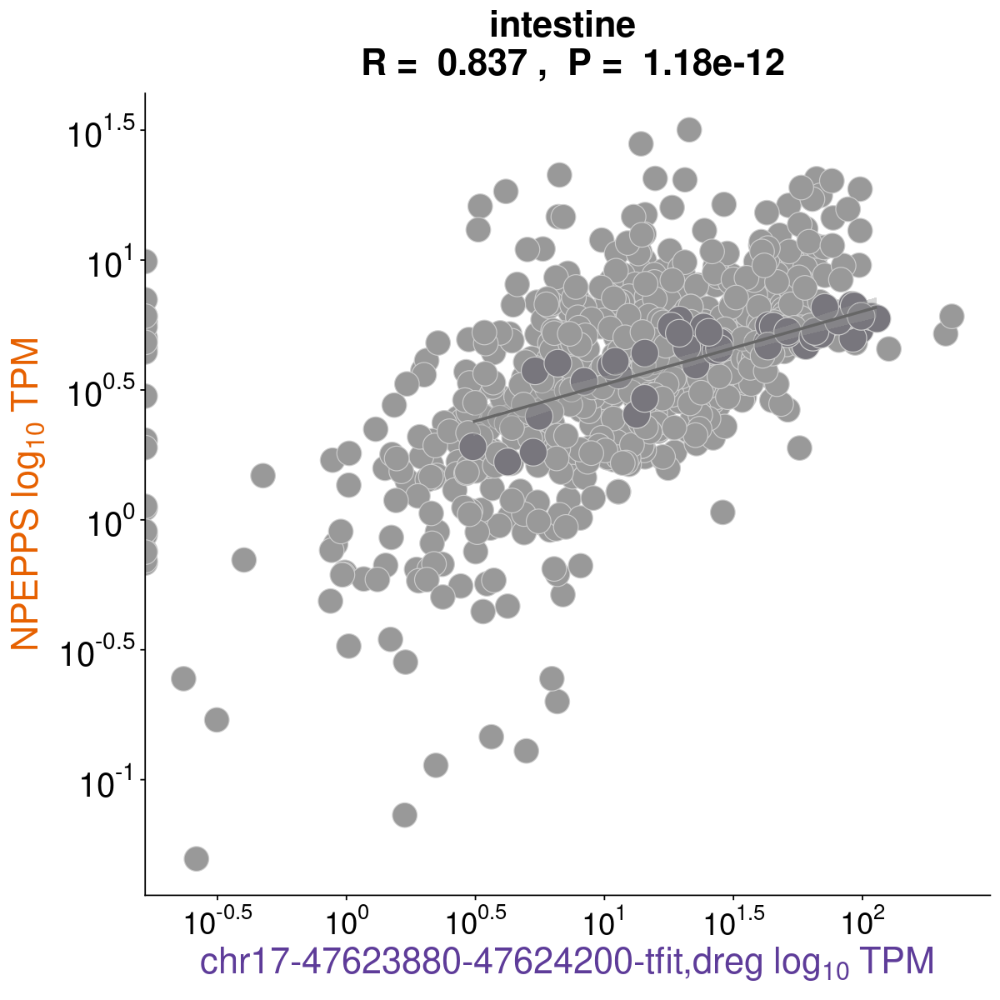

In [103]:
options(repr.plot.width=10, repr.plot.height=10)
NPEPPS_1_interstine <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'NPEPPS',
                             'chr17-47623880-47624200-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "intestine")

[1] "NPEPPS"
[1] "chr17-47623880-47624200-tfit,dreg"
   transcript_1                      transcript_2
1:       NPEPPS chr17-47623880-47624200-tfit,dreg
                                    pair_id       pcc     adj_p_BH         pval
1: NPEPPS:chr17-47623880-47624200-tfit,dreg 0.8435136 5.366205e-11 6.611574e-13
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 10.17783   44          47531858        47623276                Gene
   transcript2_start transcript2_end transcript2_biotype distance tissue
1:          47623880        47624200         Tfit & dREG    92022   skin
   percent_transcribed_both
1:                      100
[1] "Bidir: chr17-47623880-47624200-tfit,dreg"
[1] "Gene: NPEPPS"
[1] "Coeff: 0.843513554133717"
[1] "Adj p-val: 5.3662045457955e-11"
             NPEPPS chr17-47623880-47624200-tfit,dreg
SRZ1950491 3.304929                          4.751377
SRZ1950493 4.515542                          6.247069
SRZ1950495 2.257091                          4.

Warning message:
“Transformation introduced infinite values in continuous x-axis”


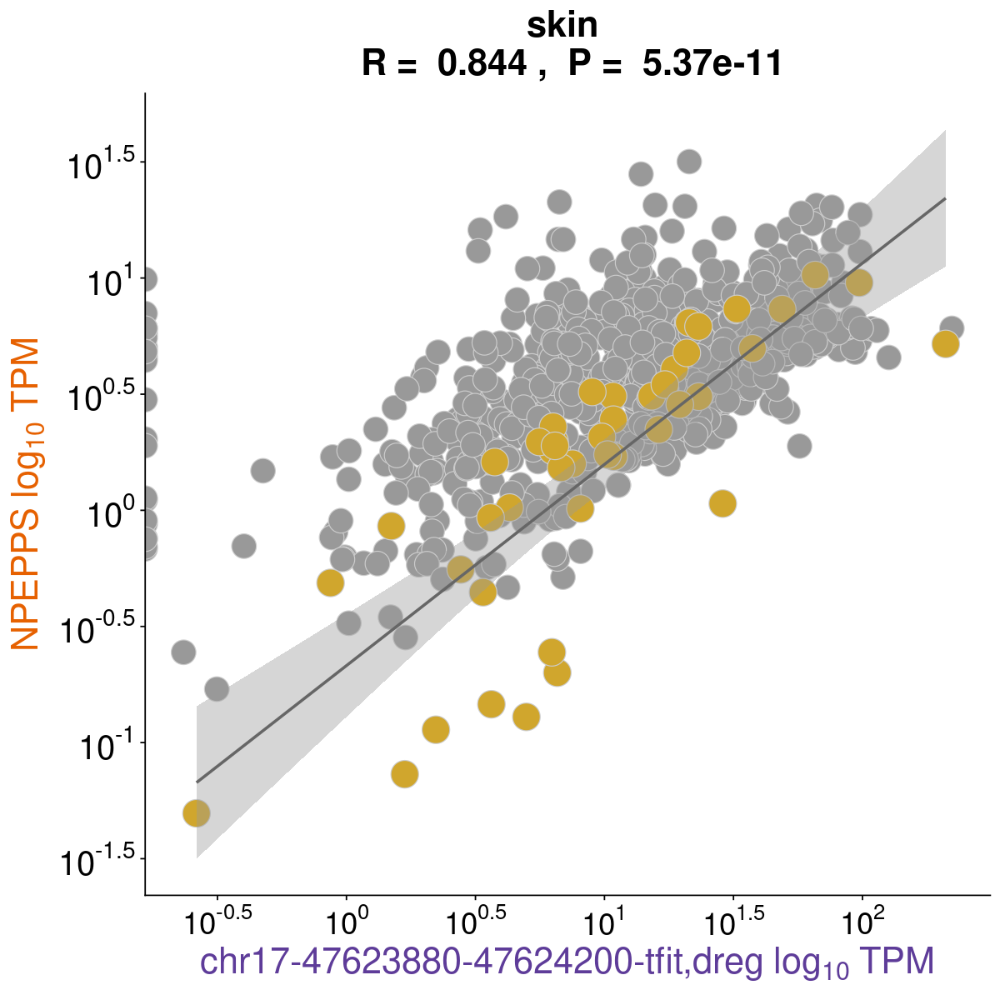

In [104]:
options(repr.plot.width=10, repr.plot.height=10)
NPEPPS_1_skin <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'NPEPPS',
                             'chr17-47623880-47624200-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "skin")

[1] "NPEPPS"
[1] "chr17-47623880-47624200-tfit,dreg"
   transcript_1                      transcript_2
1:       NPEPPS chr17-47623880-47624200-tfit,dreg
                                    pair_id       pcc     adj_p_BH         pval
1: NPEPPS:chr17-47623880-47624200-tfit,dreg 0.8285964 7.033893e-13 1.045904e-14
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 10.67274   54          47531858        47623276                Gene
   transcript2_start transcript2_end transcript2_biotype distance   tissue
1:          47623880        47624200         Tfit & dREG    92022 prostate
   percent_transcribed_both
1:                 98.18182
[1] "Bidir: chr17-47623880-47624200-tfit,dreg"
[1] "Gene: NPEPPS"
[1] "Coeff: 0.828596377001639"
[1] "Adj p-val: 7.03389279097379e-13"
             NPEPPS chr17-47623880-47624200-tfit,dreg
SRZ1950491 3.304929                          4.751377
SRZ1950493 4.515542                          6.247069
SRZ1950495 2.257091                       

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 1 rows containing non-finite values (stat_smooth).”


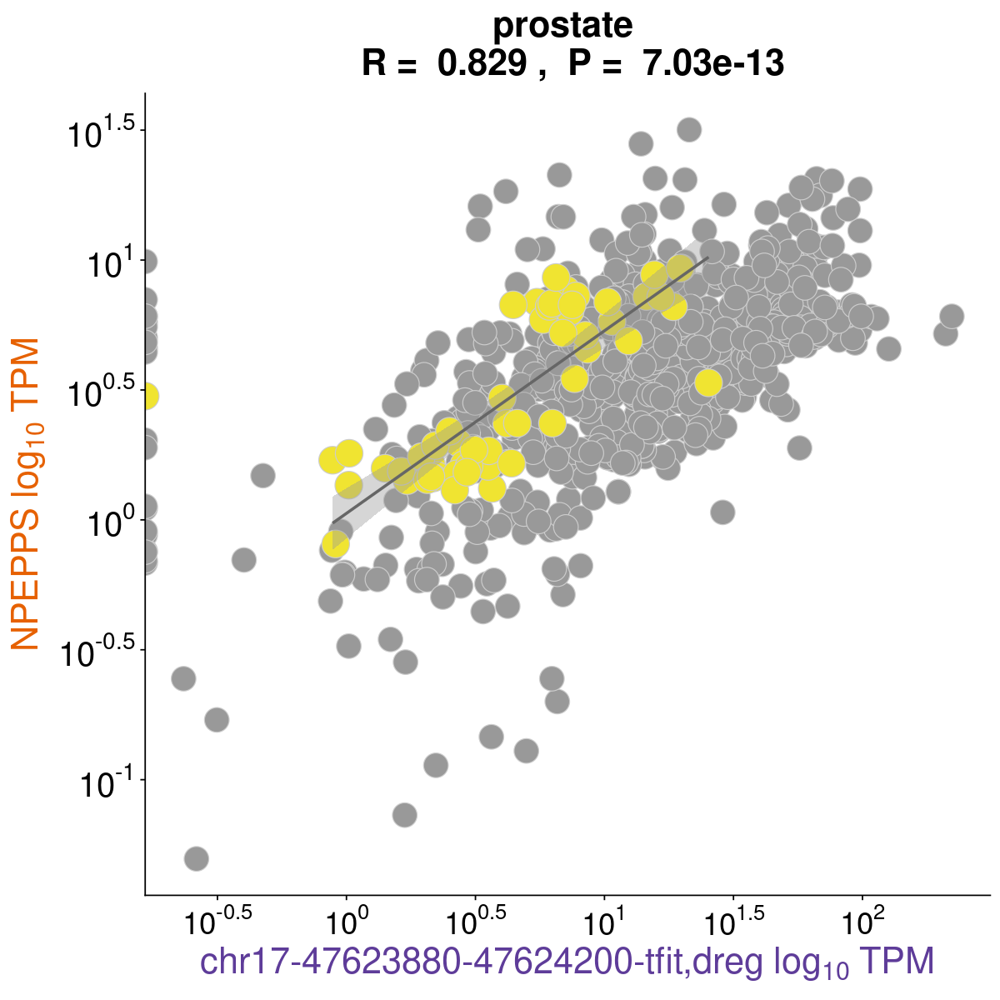

In [105]:
options(repr.plot.width=10, repr.plot.height=10)
NPEPPS_1_prostate <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'NPEPPS',
                             'chr17-47623880-47624200-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "prostate")

[1] "NPEPPS"
[1] "chr17-47623880-47624200-tfit,dreg"
   transcript_1                      transcript_2
1:       NPEPPS chr17-47623880-47624200-tfit,dreg
                                    pair_id       pcc     adj_p_BH         pval
1: NPEPPS:chr17-47623880-47624200-tfit,dreg 0.8512809 3.092256e-11 3.433847e-14
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 10.88328   47          47531858        47623276                Gene
   transcript2_start transcript2_end transcript2_biotype distance tissue
1:          47623880        47624200         Tfit & dREG    92022 uterus
   percent_transcribed_both
1:                 97.91667
[1] "Bidir: chr17-47623880-47624200-tfit,dreg"
[1] "Gene: NPEPPS"
[1] "Coeff: 0.851280916530939"
[1] "Adj p-val: 3.09225626111084e-11"
             NPEPPS chr17-47623880-47624200-tfit,dreg
SRZ1950491 3.304929                          4.751377
SRZ1950493 4.515542                          6.247069
SRZ1950495 2.257091                          4

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 1 rows containing non-finite values (stat_smooth).”


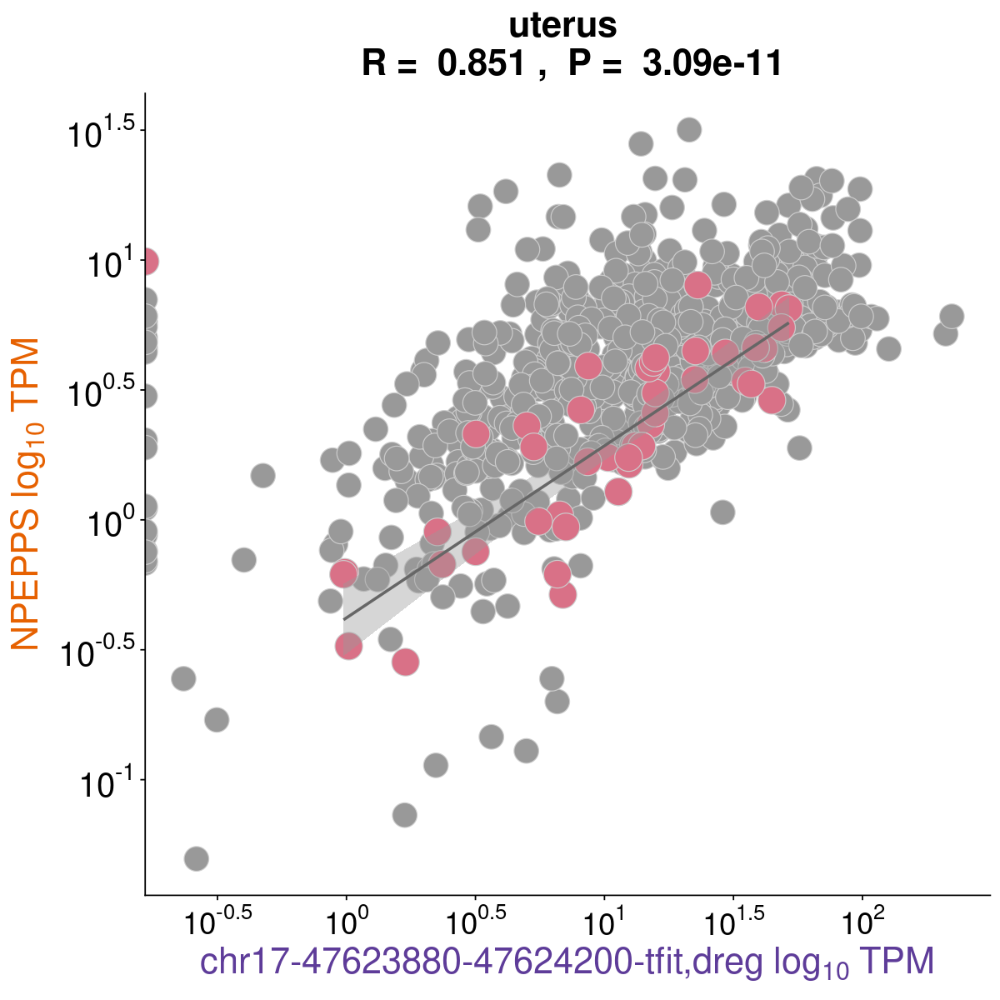

In [106]:
options(repr.plot.width=10, repr.plot.height=10)
NPEPPS_1_uterus <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'NPEPPS',
                             'chr17-47623880-47624200-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "uterus")

## Plot pairs for SUMO

In [107]:
sumo <- subset(sig_pairs_path_DT_0.8, 
       transcript_1 == 'SUMO2' & 
              transcript_2 == 'chr17-75160659-75162464-tfit,dreg')
nrow(sumo)
length(unique(sumo$pair_id))

[1] 6

[1] 1

In [108]:
sumo

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
SUMO2,"chr17-75160659-75162464-tfit,dreg","SUMO2:chr17-75160659-75162464-tfit,dreg",0.8718041,2.251515e-65,7.042207e-69,26.15643,218,75165586,75182209,Gene,75160659,75162464,Tfit & dREG,-4927,breast,100.00000
SUMO2,"chr17-75160659-75162464-tfit,dreg","SUMO2:chr17-75160659-75162464-tfit,dreg",0.9082850,6.289678e-10,1.700440e-12,11.69175,31,75165586,75182209,Gene,75160659,75162464,Tfit & dREG,-4927,embryo,100.00000
SUMO2,"chr17-75160659-75162464-tfit,dreg","SUMO2:chr17-75160659-75162464-tfit,dreg",0.9355885,3.541151e-21,2.967754e-24,18.73621,52,75165586,75182209,Gene,75160659,75162464,Tfit & dREG,-4927,intestine,100.00000
SUMO2,"chr17-75160659-75162464-tfit,dreg","SUMO2:chr17-75160659-75162464-tfit,dreg",0.9378999,9.043506e-05,2.717998e-08,10.47105,17,75165586,75182209,Gene,75160659,75162464,Tfit & dREG,-4927,lung,100.00000
SUMO2,"chr17-75160659-75162464-tfit,dreg","SUMO2:chr17-75160659-75162464-tfit,dreg",0.9522764,5.743583e-25,1.833977e-28,22.49716,54,75165586,75182209,Gene,75160659,75162464,Tfit & dREG,-4927,prostate,98.18182
SUMO2,"chr17-75160659-75162464-tfit,dreg","SUMO2:chr17-75160659-75162464-tfit,dreg",0.9641638,1.430986e-20,1.685465e-23,22.40230,40,75165586,75182209,Gene,75160659,75162464,Tfit & dREG,-4927,skin,90.90909


[1] "SUMO2"
[1] "chr17-75160659-75162464-tfit,dreg"
   transcript_1                      transcript_2
1:        SUMO2 chr17-75160659-75162464-tfit,dreg
                                   pair_id       pcc     adj_p_BH         pval
1: SUMO2:chr17-75160659-75162464-tfit,dreg 0.8718041 2.251515e-65 7.042207e-69
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 26.15643  218          75165586        75182209                Gene
   transcript2_start transcript2_end transcript2_biotype distance tissue
1:          75160659        75162464         Tfit & dREG    -4927 breast
   percent_transcribed_both
1:                      100
[1] "Bidir: chr17-75160659-75162464-tfit,dreg"
[1] "Gene: SUMO2"
[1] "Coeff: 0.871804057042482"
[1] "Adj p-val: 2.2515154807042e-65"
               SUMO2 chr17-75160659-75162464-tfit,dreg
SRZ1950491 12.752218                          9.145508
SRZ1950493 14.415157                         11.905771
SRZ1950495  6.775422                          4.

Warning message:
“Transformation introduced infinite values in continuous x-axis”


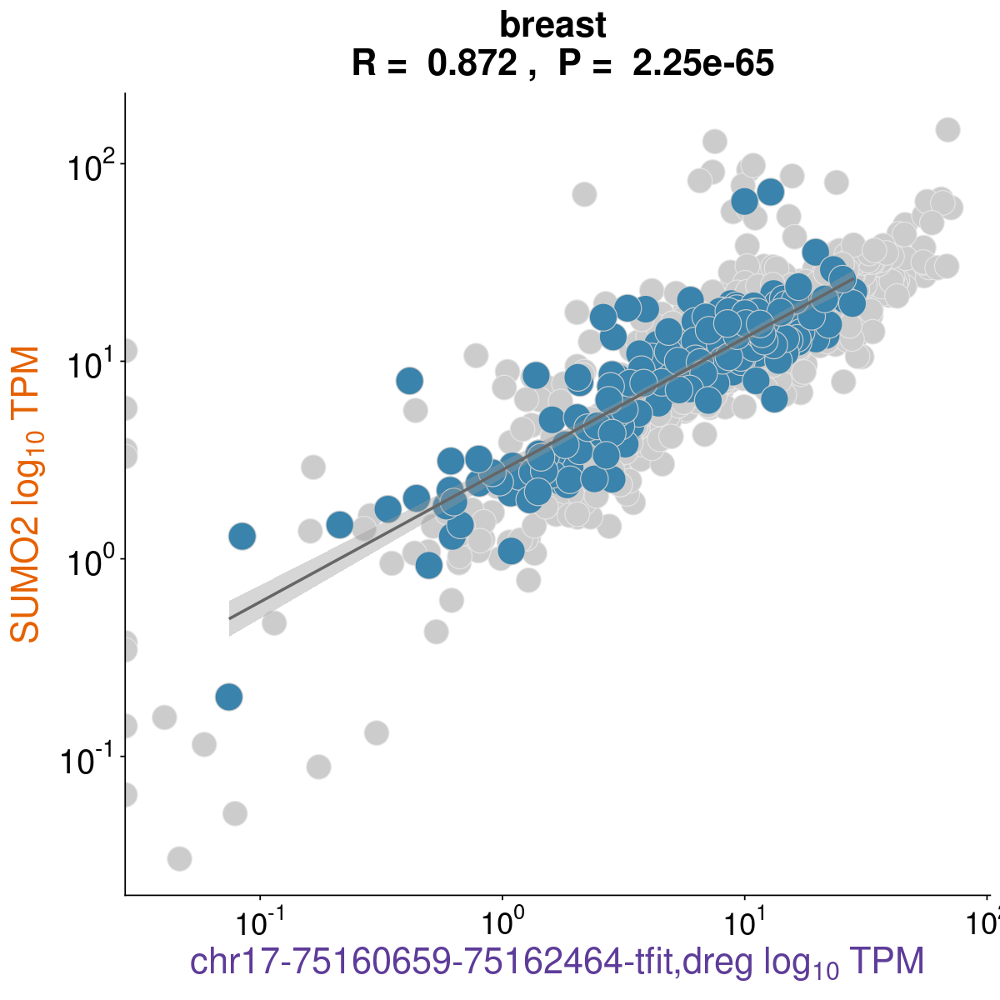

In [134]:
options(repr.plot.width=10, repr.plot.height=10)
SUMO2_breast <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'SUMO2',
                             'chr17-75160659-75162464-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "breast")

[1] "SUMO2"
[1] "chr17-75160659-75162464-tfit,dreg"
   transcript_1                      transcript_2
1:        SUMO2 chr17-75160659-75162464-tfit,dreg
                                   pair_id       pcc     adj_p_BH         pval
1: SUMO2:chr17-75160659-75162464-tfit,dreg 0.9641638 1.430986e-20 1.685465e-23
         t nObs transcript1_start transcript1_end transcript1_biotype
1: 22.4023   40          75165586        75182209                Gene
   transcript2_start transcript2_end transcript2_biotype distance tissue
1:          75160659        75162464         Tfit & dREG    -4927   skin
   percent_transcribed_both
1:                 90.90909
[1] "Bidir: chr17-75160659-75162464-tfit,dreg"
[1] "Gene: SUMO2"
[1] "Coeff: 0.964163781894537"
[1] "Adj p-val: 1.43098607982191e-20"
               SUMO2 chr17-75160659-75162464-tfit,dreg
SRZ1950491 12.752218                          9.145508
SRZ1950493 14.415157                         11.905771
SRZ1950495  6.775422                          4.4

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 4 rows containing non-finite values (stat_smooth).”


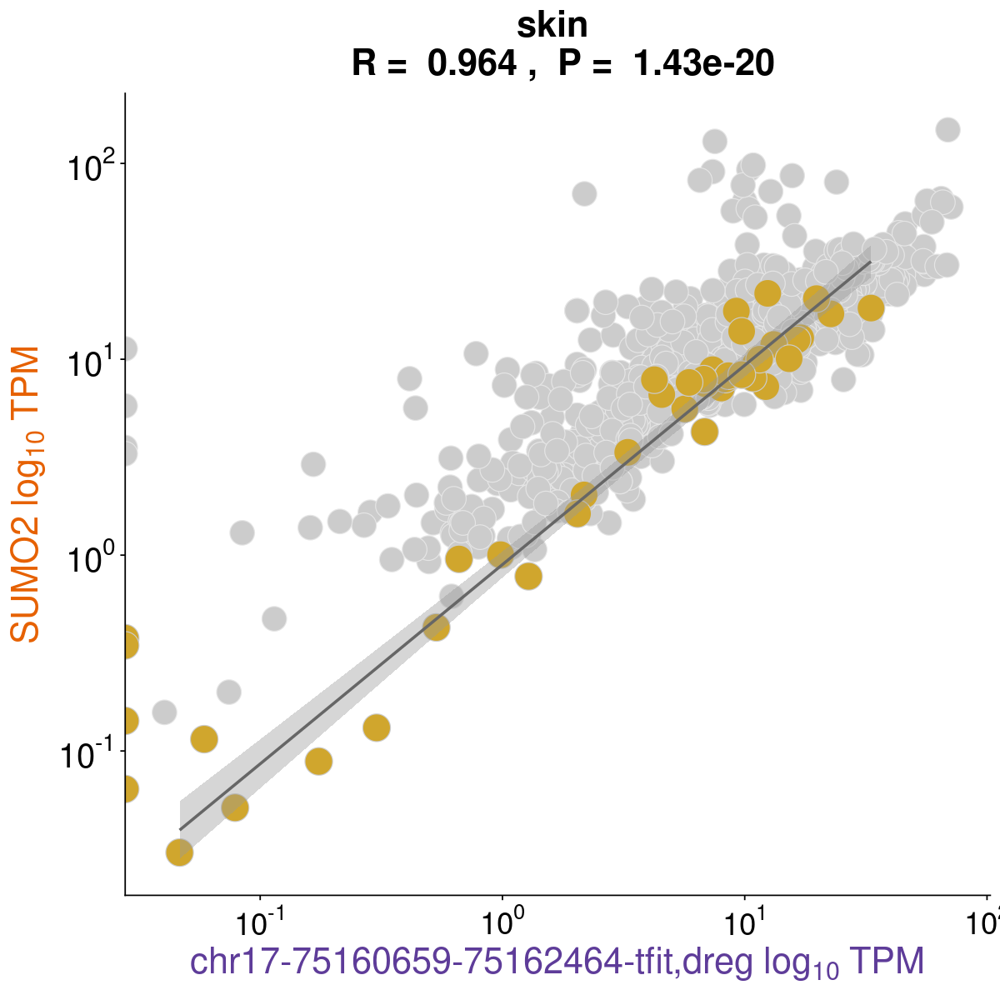

In [135]:
SUMO2_skin <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'SUMO2',
                             'chr17-75160659-75162464-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "skin")

[1] "SUMO2"
[1] "chr17-75160659-75162464-tfit,dreg"
   transcript_1                      transcript_2
1:        SUMO2 chr17-75160659-75162464-tfit,dreg
                                   pair_id       pcc     adj_p_BH         pval
1: SUMO2:chr17-75160659-75162464-tfit,dreg 0.9355885 3.541151e-21 2.967754e-24
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 18.73621   52          75165586        75182209                Gene
   transcript2_start transcript2_end transcript2_biotype distance    tissue
1:          75160659        75162464         Tfit & dREG    -4927 intestine
   percent_transcribed_both
1:                      100
[1] "Bidir: chr17-75160659-75162464-tfit,dreg"
[1] "Gene: SUMO2"
[1] "Coeff: 0.935588501433847"
[1] "Adj p-val: 3.54115109678023e-21"
               SUMO2 chr17-75160659-75162464-tfit,dreg
SRZ1950491 12.752218                          9.145508
SRZ1950493 14.415157                         11.905771
SRZ1950495  6.775422                     

Warning message:
“Transformation introduced infinite values in continuous x-axis”


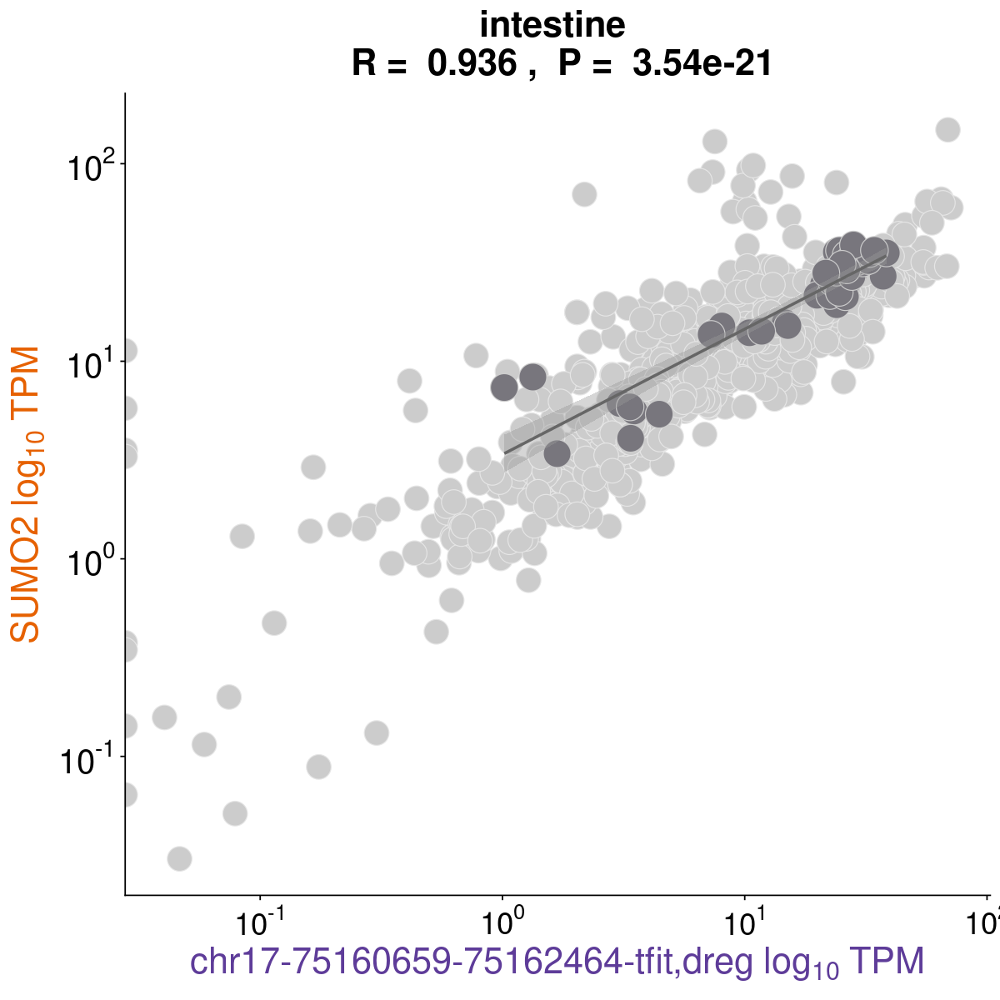

In [136]:
SUMO2_intestine <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'SUMO2',
                             'chr17-75160659-75162464-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "intestine")

[1] "SUMO2"
[1] "chr17-75160659-75162464-tfit,dreg"
   transcript_1                      transcript_2
1:        SUMO2 chr17-75160659-75162464-tfit,dreg
                                   pair_id       pcc     adj_p_BH         pval
1: SUMO2:chr17-75160659-75162464-tfit,dreg 0.9378999 9.043506e-05 2.717998e-08
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 10.47105   17          75165586        75182209                Gene
   transcript2_start transcript2_end transcript2_biotype distance tissue
1:          75160659        75162464         Tfit & dREG    -4927   lung
   percent_transcribed_both
1:                      100
[1] "Bidir: chr17-75160659-75162464-tfit,dreg"
[1] "Gene: SUMO2"
[1] "Coeff: 0.93789985794447"
[1] "Adj p-val: 9.04350573081151e-05"
               SUMO2 chr17-75160659-75162464-tfit,dreg
SRZ1950491 12.752218                          9.145508
SRZ1950493 14.415157                         11.905771
SRZ1950495  6.775422                          4.

Warning message:
“Transformation introduced infinite values in continuous x-axis”


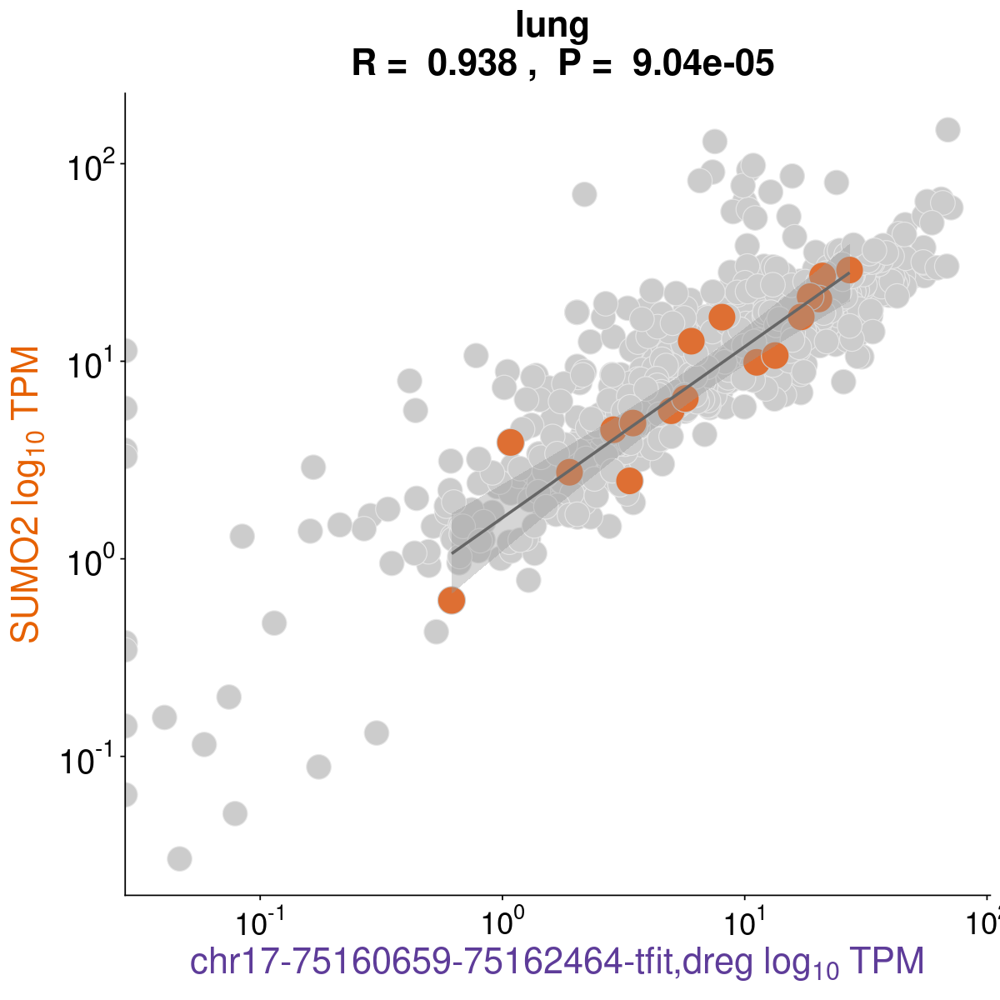

In [137]:
SUMO2_lung <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'SUMO2',
                             'chr17-75160659-75162464-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "lung")

[1] "SUMO2"
[1] "chr17-75160659-75162464-tfit,dreg"
   transcript_1                      transcript_2
1:        SUMO2 chr17-75160659-75162464-tfit,dreg
                                   pair_id       pcc     adj_p_BH         pval
1: SUMO2:chr17-75160659-75162464-tfit,dreg 0.9522764 5.743583e-25 1.833977e-28
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 22.49716   54          75165586        75182209                Gene
   transcript2_start transcript2_end transcript2_biotype distance   tissue
1:          75160659        75162464         Tfit & dREG    -4927 prostate
   percent_transcribed_both
1:                 98.18182
[1] "Bidir: chr17-75160659-75162464-tfit,dreg"
[1] "Gene: SUMO2"
[1] "Coeff: 0.952276434730123"
[1] "Adj p-val: 5.74358298700781e-25"
               SUMO2 chr17-75160659-75162464-tfit,dreg
SRZ1950491 12.752218                          9.145508
SRZ1950493 14.415157                         11.905771
SRZ1950495  6.775422                       

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 1 rows containing non-finite values (stat_smooth).”


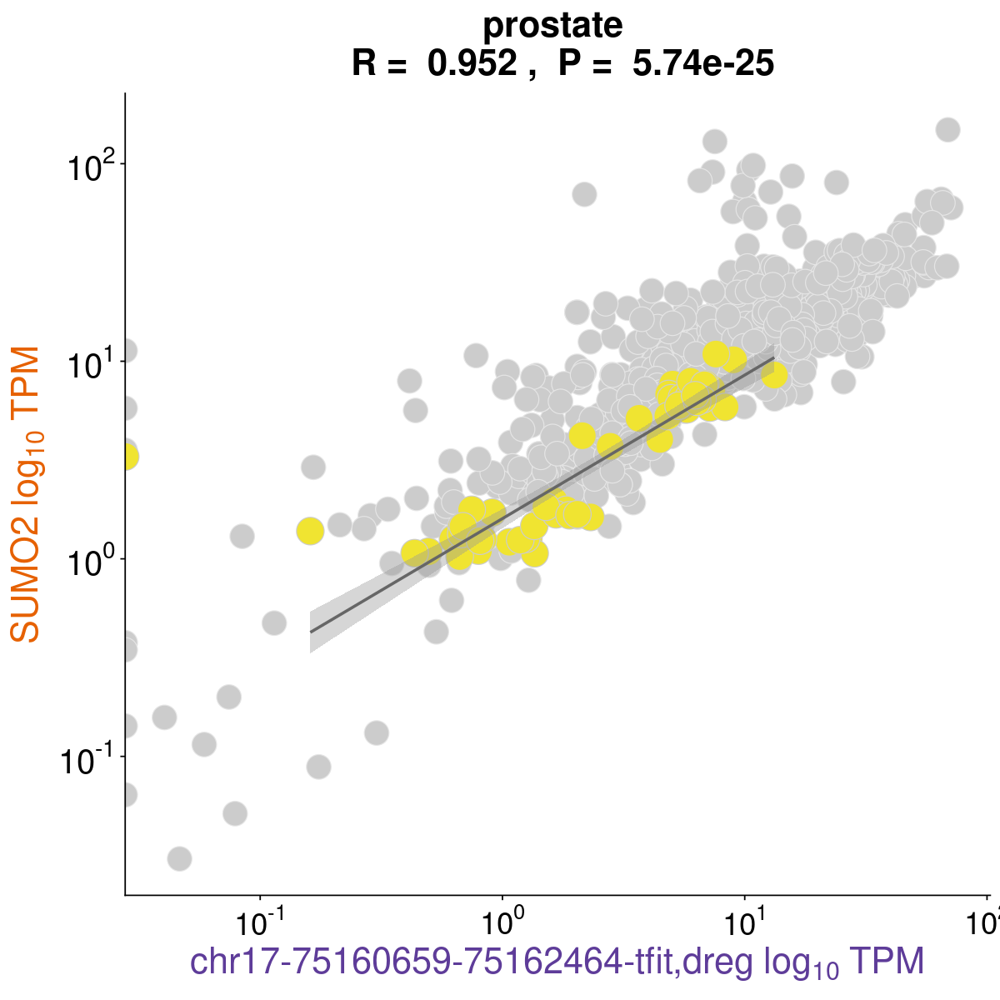

In [138]:
SUMO2_prostate <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'SUMO2',
                             'chr17-75160659-75162464-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "prostate")

[1] "SUMO2"
[1] "chr17-75160659-75162464-tfit,dreg"
   transcript_1                      transcript_2
1:        SUMO2 chr17-75160659-75162464-tfit,dreg
                                   pair_id      pcc     adj_p_BH        pval
1: SUMO2:chr17-75160659-75162464-tfit,dreg 0.908285 6.289678e-10 1.70044e-12
          t nObs transcript1_start transcript1_end transcript1_biotype
1: 11.69175   31          75165586        75182209                Gene
   transcript2_start transcript2_end transcript2_biotype distance tissue
1:          75160659        75162464         Tfit & dREG    -4927 embryo
   percent_transcribed_both
1:                      100
[1] "Bidir: chr17-75160659-75162464-tfit,dreg"
[1] "Gene: SUMO2"
[1] "Coeff: 0.908285005244282"
[1] "Adj p-val: 6.28967826312698e-10"
               SUMO2 chr17-75160659-75162464-tfit,dreg
SRZ1950491 12.752218                          9.145508
SRZ1950493 14.415157                         11.905771
SRZ1950495  6.775422                          4.401

Warning message:
“Transformation introduced infinite values in continuous x-axis”


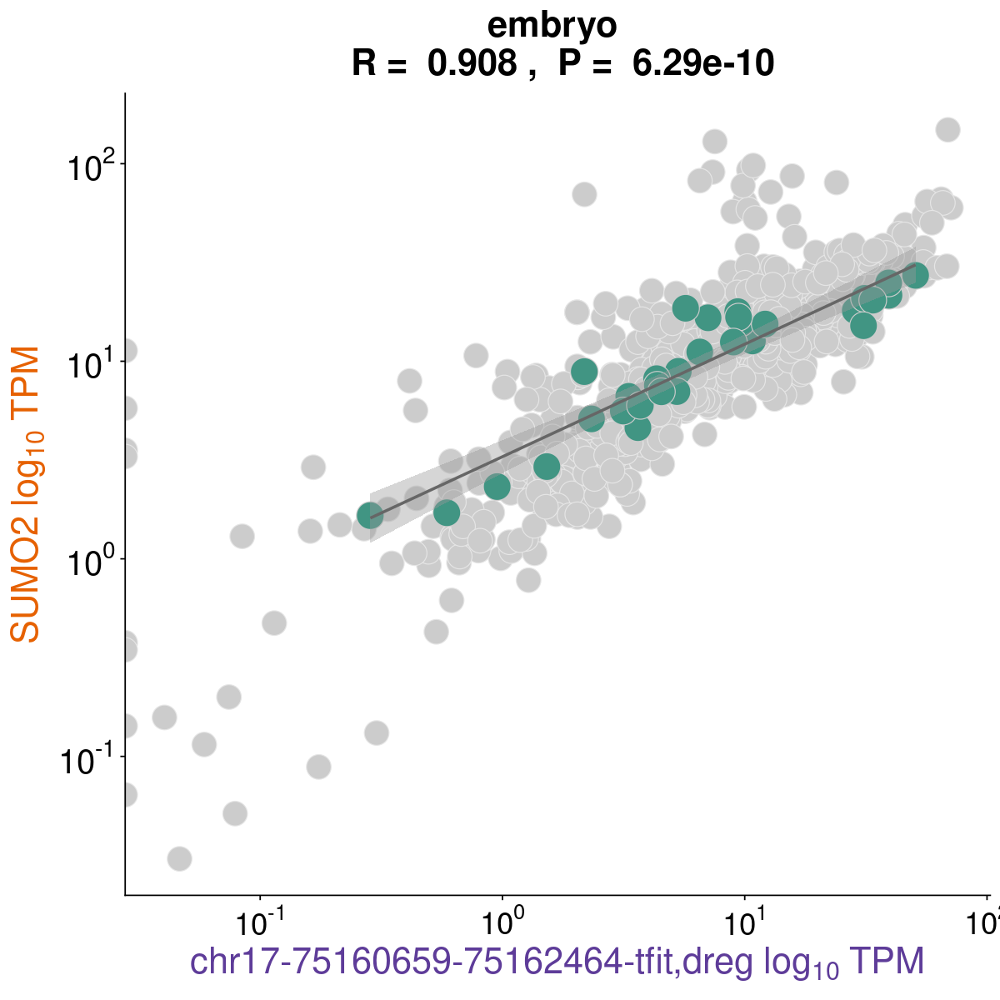

In [139]:
SUMO2_emryo <- plot_transcript_pairs_txptID_col(gn_bdr_tpm_updated_df_trunc,
                             sig_pairs_path_DT_0.8,
                            880,
                             'SUMO2',
                             'chr17-75160659-75162464-tfit,dreg', 
                             metadata_celltype_counted, 
                             mycolors,
                                 "embryo")

### Plot main panel D

In [140]:
all_sumo2_pair <- subset(sig_pairs_all_path_DT,
                          transcript_1 == 'SUMO2' & 
                          transcript_2 == 'chr17-75160659-75162464-tfit,dreg')
all_sumo2_pair

transcript_1,transcript_2,pair_id,pcc,adj_p_BH,pval,t,nObs,transcript1_start,transcript1_end,transcript1_biotype,transcript2_start,transcript2_end,transcript2_biotype,distance,tissue,percent_transcribed_both
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<dbl>
SUMO2,"chr17-75160659-75162464-tfit,dreg","SUMO2:chr17-75160659-75162464-tfit,dreg",0.8465012,2.765094e-236,2.098966e-240,46.8986,872,75165586,75182209,Gene,75160659,75162464,Tfit & dREG,-4927,All_samples,99.09091


In [141]:
all_sumo2_pair$pcc

[1] 0.8465012

In [142]:
normalized_counts_df <- as.data.frame(gn_bdr_tpm_updated_df_trunc)

gene_filtered <- subset(normalized_counts_df, GeneID == as.character("SUMO2"))
bidir_filtered <- normalized_counts_df[normalized_counts_df$GeneID %in% "chr17-75160659-75162464-tfit,dreg",]

filtered_pair <- rbind(gene_filtered, bidir_filtered)
rownames(filtered_pair) <- filtered_pair$GeneID


transcript_1id <- all_sumo2_pair$transcript_2  #datatable_pairs[row_number,]$transcript_1
transcript_2id <- all_sumo2_pair$transcript_1 #datatable_pairs[row_number,]$transcript_2
coeff <- all_sumo2_pair$pcc 
adj <- all_sumo2_pair$adj_p_BH

filtered_pair_df <- as.data.frame(t(filtered_pair[c(6:(880+5))]))
print(head(filtered_pair_df))

colnames(filtered_pair_df) <- c('transcript_1','transcript_2')
filtered_pair_df$srz <- rownames(filtered_pair_df)

filtered_pair_metadata <- merge(filtered_pair_df, 
                      metadata_celltype_counted, 
                      by.x = 'srz',
                     by.y = 'sample_name')

head(filtered_pair_metadata)

               SUMO2 chr17-75160659-75162464-tfit,dreg
SRZ1950491 12.752218                          9.145508
SRZ1950493 14.415157                         11.905771
SRZ1950495  6.775422                          4.401762
SRZ1950497  7.245586                          3.910057
SRZ1950499  9.324037                          7.003535
SRZ1950501  8.582892                          5.953951


,srz,transcript_1,transcript_2,organism,tissue,tissue_description,disease,srp,paper_id,protocol,sample_type,cell_type,samp_qc_score,samp_data_score,replicate,control_experimental,Tissue
,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>
1,ERR769522,3.546007,0.000000,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,3,2,1,experimental,Uterus
2,ERR769523,11.311546,0.000000,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,3,1,1,experimental,Uterus
3,ERR769524,20.520386,8.263410,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,2,1,1,control,Uterus
4,ERR769525,17.838921,7.608904,H. sapiens,uterus,uterus; cervix; cervical adenocarcinoma,1,ERP009673,Laitem2015cdk9,GRO-seq,cell line,HeLa,2,1,2,control,Uterus
5,SRR10298307,19.592567,8.788003,H. sapiens,breast,breast; mammary; adenocarcinoma,1,SRP226022,Li2021comprehensive,GRO-seq,cell line,MCF7,2,2,1,control,Breast
6,SRR10298308,19.089497,9.231436,H. sapiens,breast,breast; mammary; adenocarcinoma,1,SRP226022,Li2021comprehensive,GRO-seq,cell line,MCF7,1,2,2,control,Breast


Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 8 rows containing non-finite values (stat_smooth).”


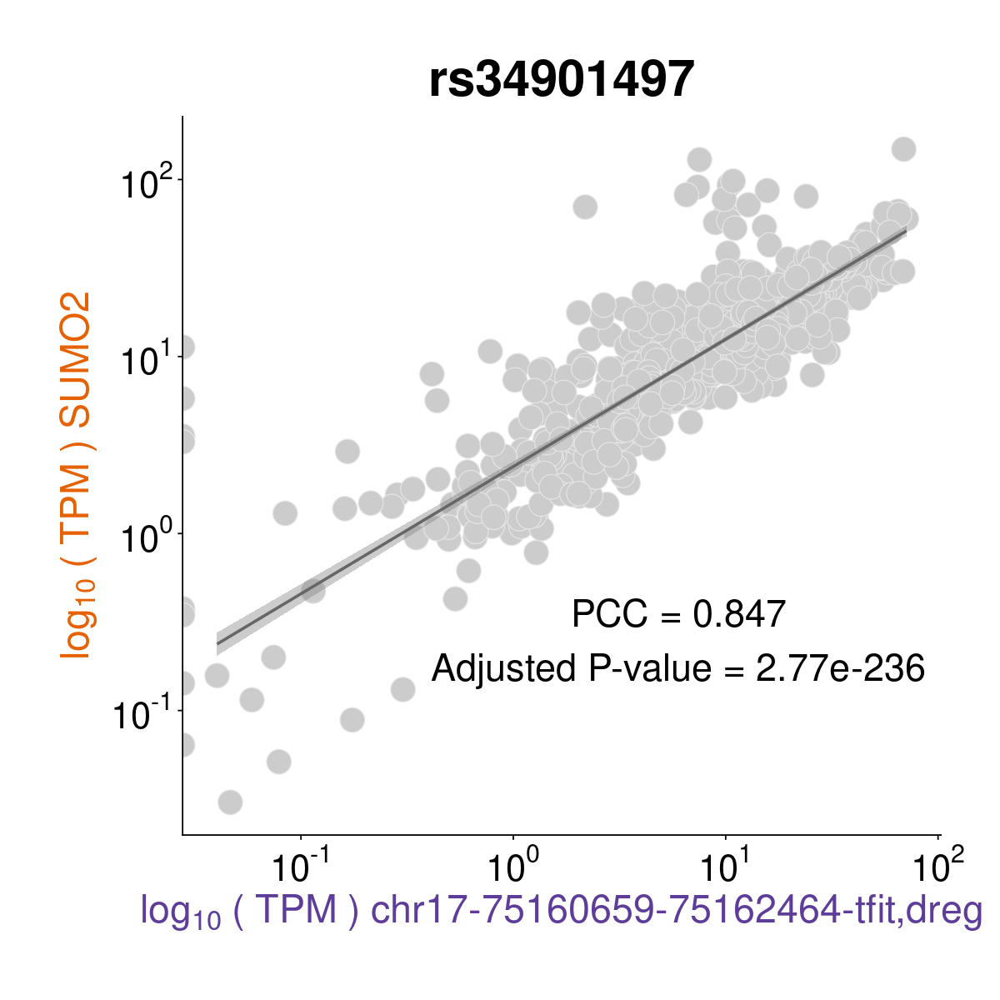

In [146]:
options(repr.plot.width=10, repr.plot.height=10)
# Change the confidence interval fill color
panelD <- ggplot(filtered_pair_metadata, 
       aes(x=transcript_2,
           y=transcript_1)) + 
  geom_point(size=8,shape=21, color="gray90",fill="gray80")+
theme_cowplot() + 
geom_smooth(method='lm',formula=y~x, color = 'gray40', fill='gray50') +
labs(title = paste("rs34901497"),
     x = bquote(log[10] ~ '(' ~ TPM ~')'~ .(transcript_1id)), 
     y = bquote(log[10] ~ '(' ~ TPM ~')'~ .(transcript_2id))
     #x = bquote(.(transcript_1id) ~ log[10] ~ '(' ~ TPM ~')'), 
     #y = bquote(.(transcript_2id) ~ log[10] ~ TPM)
    ) + 
theme(plot.title = element_text(hjust = 0.5, 
                                #face = "bold",
                               size = 36),
      axis.title = element_text(size = 28), 
      axis.text = element_text(size = 26),
      axis.text.x = element_text(size = 26),
  axis.title.x = element_text(colour = "#5e3c99"),
  axis.title.y = element_text(colour = "#e66101"),
  panel.background = element_rect(fill = "transparent"), 
  plot.background = element_rect(fill = "transparent", color = NA),
  legend.key = element_rect(colour = "transparent", 
                            fill = "transparent"),
  legend.background = element_rect(fill = "transparent"), 
  legend.box.background = element_rect(fill = "transparent",
                                       colour = "transparent")) +
 scale_x_log10(breaks = trans_breaks("log10", function(x) 10^x),
          labels = trans_format("log10", math_format(10^.x))) +
 scale_y_log10(breaks = trans_breaks("log10", function(x) 10^x),
          labels = trans_format("log10", math_format(10^.x))) +
               theme(plot.margin = margin(1.5,1.5,1.5,1.5, "cm")) + 
               annotate(geom="text", x=6, y=0.25, size=9.5,
                        label=paste0("PCC = ",
                   signif(coeff, 3),
                   "\n", 
                   "Adjusted P-value = ",
                   signif(adj, 3)),color="black")

panelD

### Plot supplement to panel D 

The correlations for all samples (not tissue specitic) can be found here: `/Users/rusi2317/projects/meta_analysis_qc/hg38/processed_data/correlations`

In [144]:
ggsave(panelD, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/sumo2_bidir_scatter.pdf',
      bg = "transparent")

ggsave(SUMO2_skin, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/sumo2_bidir_scatter_skin.pdf',
      bg = "transparent")

ggsave(SUMO2_emryo, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/sumo2_bidir_scatter_embryo.pdf',
      bg = "transparent")

ggsave(SUMO2_prostate, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/sumo2_bidir_scatter_prostate.pdf',
      bg = "transparent")

ggsave(SUMO2_lung, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/sumo2_bidir_scatter_lung.pdf',
      bg = "transparent")

ggsave(SUMO2_intestine, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/sumo2_bidir_scatter_colon.pdf',
      bg = "transparent")

ggsave(SUMO2_breast, width = 10, height = 10,
       filename = '/Users/rusi2317/projects/DBNascent_Analysis/figures/sumo2_bidir_scatter_breast.pdf',
      bg = "transparent")

Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 8 rows containing non-finite values (stat_smooth).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 4 rows containing non-finite values (stat_smooth).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 1 rows containing non-finite values (stat_smooth).”
Warning message:
“Transforma

# Session Information

In [145]:
sessionInfo()

R version 3.6.0 (2019-04-26)
Platform: x86_64-redhat-linux-gnu (64-bit)
Running under: CentOS Linux 7 (Core)

Matrix products: default
BLAS/LAPACK: /usr/lib64/R/lib/libRblas.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
[1] VennDiagram_1.7.3   futile.logger_1.4.3 scales_1.2.1       
[4] data.table_1.14.2   tidyr_1.2.1         dplyr_1.0.10       
[7] RColorBrewer_1.1-3  cowplot_1.1.1       ggplot2_3.3.6      

loaded via a namespace (and not attached):
 [1] pbdZMQ_0.3-7         tidyselect_1.1.2     repr_1.1.4          
 [4] purrr_0.3.4 